In [1]:
import argparse
import math
from datetime import datetime
#import h5pyprovider
import numpy as np
import tensorflow as tf
import socket
import importlib
import matplotlib.pylab as plt
import os
import pickle
# os.environ['CUDA_DEVICE_ORDER']="PCI_BUS_ID"
# os.environ['CUDA_VISIBLE_DEVICES']="1"

import sys
BASE_DIR = os.path.abspath('')
print(BASE_DIR)
sys.path.append(os.path.join(BASE_DIR, 'models'))
sys.path.append(BASE_DIR) # model
sys.path.append(os.path.join(BASE_DIR, 'tf_utils'))
import provider
import tf_util

/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:469: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:470: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:471: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 

/home/michael/lidar/D-FCN


In [2]:
# Argparses
EPOCH_CNT = 0

BATCH_SIZE = 6
NUM_POINT = 2048
MAX_EPOCH = 200
BASE_LEARNING_RATE = .01
# GPU_INDEX = 7
GPU_INDEX = 1
MOMENTUM = 0.9
OPTIMIZER = 'adam'
DECAY_STEP = 20000
DECAY_RATE = 0.5

In [3]:
MODEL = importlib.import_module('DFCN_pointnet2_group2') # import network module
MODEL_FILE = os.path.join(BASE_DIR, 'DFCN_pointnet2_group2'+'.py')
LOG_DIR = 'log_wen_v16_sample8192_group2_lw14_F1_noheight'
if not os.path.exists(LOG_DIR): os.mkdir(LOG_DIR)
os.system('cp models/DFCN_pointnet2.py %s' % (LOG_DIR)) # bkp of model def
os.system('cp tf_utils/DFCN_util_xy2.py %s' % (LOG_DIR)) # bkp of model def
# os.system('cp train_pointsift_lx_npsplit_V16.ipynb %s' % (LOG_DIR)) # bkp of train procedure
LOG_FOUT = open(os.path.join(LOG_DIR, 'log_train.txt'), 'w')
# LOG_FOUT.write(str(FLAGS)+'\n')

BN_INIT_DECAY = 0.5
BN_DECAY_DECAY_RATE = 0.5
BN_DECAY_DECAY_STEP = float(DECAY_STEP)
BN_DECAY_CLIP = 0.99

HOSTNAME = socket.gethostname()

NUM_CLASSES = 9

BASE_DIR /home/michael/lidar/D-FCN/tf_utils


In [4]:
def log_string(out_str):
    LOG_FOUT.write(out_str+'\n')
    LOG_FOUT.flush()
    print(out_str)

def get_learning_rate(batch):
    learning_rate = tf.train.exponential_decay(
                        BASE_LEARNING_RATE,  # Base learning rate.
                        batch * BATCH_SIZE,  # Current index into the dataset.
                        DECAY_STEP,          # Decay step.
                        DECAY_RATE,          # Decay rate.
                        staircase=True)
    learning_rate = tf.maximum(learning_rate, 0.00001) # CLIP THE LEARNING RATE!!
    return learning_rate        

def get_bn_decay(batch):
    bn_momentum = tf.train.exponential_decay(
                      BN_INIT_DECAY,
                      batch*BATCH_SIZE,
                      BN_DECAY_DECAY_STEP,
                      BN_DECAY_DECAY_RATE,
                      staircase=True)
    bn_decay = tf.minimum(BN_DECAY_CLIP, 1 - bn_momentum)
    return bn_decay

def Acc_from_confusions(confusions):
    
    TP = np.diagonal(confusions, axis1=-2, axis2=-1)
    TP_plus_FN = np.sum(confusions, axis=-1)
    TP_plus_FP = np.sum(confusions, axis=-2)
    
    mAcc = np.sum(TP)/np.sum(confusions)
    
    precision = TP / (TP_plus_FP + 1e-6)
    recall = TP / (TP_plus_FN+ 1e-6)
    fscore = 2*(precision * recall)/(precision + recall + 1e-6)
    
    ave_F1 = np.mean(fscore)
    
    s = 'Overall accuracy：{:5.2f}  Average F1 score：{:5.2f} \n'.format(100 * mAcc, 100 * ave_F1)
    s += log_acc(precision)
    s += log_acc(recall)
    s += log_acc(fscore)
    
    log_string(s)
    
    return mAcc, ave_F1
    

def log_acc(acc_list):
    s = ""
    for acc in acc_list:
        s += '{:5.2f} '.format(100 * acc)
    s += '\n'
    return s

def pc_normalize(pc):
    l = pc.shape[0]
    centroid = np.mean(pc, axis=0)
    pc = pc - centroid
    m = np.max(np.sqrt(np.sum(pc**2, axis=1)))
    pc = pc / m
    return pc
    
def drawPlot(x,y,name):
    plt.rcParams['savefig.dpi'] = 300 
    plt.plot(np.arange(0,len(x)),x,'k-',alpha=1,label='Train max: '+str(round(max(x),3))+', min: '+str(round(min(x),3)))
    plt.plot(np.arange(0,len(y)),y,'r-',alpha=1,label='Test max: '+str(round(max(y),3))+', min: '+str(round(min(y),3)))
    plt.legend()
    plt.xlabel('epoch',fontsize=9)
    plt.ylabel(name+' value',fontsize=9)
    plt.savefig(LOG_DIR+"/"+name+".png",bbox_inches='tight')
    plt.show()
    
def drawF1Plot(x,name):
    plt.rcParams['savefig.dpi'] = 300 
    plt.plot(np.arange(0,len(x)),x,'k-',alpha=1,label='Train max: '+str(round(max(x),3))+', min: '+str(round(min(x),3)))
    plt.legend()
    plt.xlabel('epoch',fontsize=9)
    plt.ylabel(name+' value',fontsize=9)
    plt.savefig(LOG_DIR+"/"+name+".png",bbox_inches='tight')
    plt.show()
    
    
def placeholder_inputs(batch_size, num_point):
    pointclouds_pl = tf.placeholder(tf.float32, shape=(None, None, 3))
    labels_pl = tf.placeholder(tf.int32, shape=(None, None))
    smpws_pl = tf.placeholder(tf.float32, shape=(None, None))
    return pointclouds_pl, labels_pl, smpws_pl

def pc_normalize_min_max(data):
    mindata = np.min(data[:,:3], axis=0)
    maxdata = np.max(data[:,:3], axis=0)
    return 2*(data[:,:3] - mindata)/(maxdata - mindata)

def pc_normalize_min(data):
    mindata = np.min(data[:,:3], axis=0)
    
    return (data[:,:3] - mindata)

def get_batch(dataset, index, npoints = NUM_POINT):
  
    if(dataset =='train'):
        cub_l = 30.0
        cub_w = 30.0
        cub_h = 100.0
        point_set =  trainSet[:,:3] - np.min(trainSet[:,:3], axis=0)
        semantic_seg = trainSet[:,4].astype(np.int32)
        coordmax = np.max(point_set,axis=0)
        coordmin = np.min(point_set,axis=0)
        smpmin = np.maximum(coordmax-[cub_l,cub_w,cub_h], coordmin)
        smpmin[2] = coordmin[2]
        smpsz = np.minimum(coordmax-smpmin,[cub_l,cub_w,cub_h])
        smpsz[2] = coordmax[2]-coordmin[2]
        isvalid = False
        for i in range(10):
            curcenter = point_set[np.random.choice(len(semantic_seg),1)[0],:]
            curmin = curcenter-[cub_l/2,cub_w/2,cub_h/2]
            curmax = curcenter+[cub_l/2,cub_w/2,cub_h/2]
            curmin[2] = coordmin[2]
            curmax[2] = coordmax[2]
            curchoice = np.sum((point_set>=(curmin-0.0))*(point_set<(curmax+0.0)),axis=1)==3
            cur_point_set = point_set[curchoice,:]
            cur_semantic_seg = semantic_seg[curchoice]
            cur_feat_set = trainFeats[curchoice,:]
    #         if len(cur_semantic_seg)<npoints:
            if len(cur_semantic_seg)==0:
                continue
            mask = np.sum((cur_point_set>=(curmin-0.0))*(cur_point_set<(curmax+0.0)),axis=1)==3
            vidx = np.ceil((cur_point_set[mask,:2]-curmin[:2])/(curmax[:2]-curmin[:2])*[31.0,31.0])
            vidx = np.unique(vidx[:,0]*31.0+vidx[:,1])
            isvalid = np.sum(cur_semantic_seg>-1)/1.0/len(cur_semantic_seg)>=0.7 and len(vidx)/31.0/31.0>=0.3
#             print('isvalid', isvalid,len(vidx)/31.0/31.0,np.sum(cur_semantic_seg>-1),len(cur_semantic_seg))
            if isvalid:
                break
        choice = np.random.choice(len(cur_semantic_seg), npoints, replace=True)
        point_set = cur_point_set[choice,:]
        feature_set = cur_feat_set[choice,:]
        semantic_seg = cur_semantic_seg[choice]
        mask = mask[choice]
        sample_weight = labelweights[semantic_seg]
        sample_weight *= mask
        return point_set, semantic_seg, sample_weight,feature_set
    
    if(dataset =='test'):

        cur_point_set = test_xyz[index]
        cur_semantic_seg = test_label[index].astype(np.int32)
        feature_set = test_feats[index]

        point_set = pc_normalize_min(cur_point_set)
        semantic_seg = cur_semantic_seg # N
        sample_weight = labelweights_t[semantic_seg]
    
        point_sets = np.expand_dims(point_set,0) # 1xNx3
        feature_set = np.expand_dims(feature_set,0) # 1xNx3
        semantic_segs = np.expand_dims(semantic_seg,0)  # 1xN
        sample_weights = np.expand_dims(sample_weight,0)  # 1xN
        return point_sets, semantic_segs, sample_weights,feature_set
    
def get_batch_wdp(dataset, batch_idx):
    bsize = BATCH_SIZE
    batch_data = np.zeros((bsize, NUM_POINT, 3))
    batch_feats = np.zeros((bsize, NUM_POINT, 1))
    batch_label = np.zeros((bsize, NUM_POINT), dtype=np.int32)
    batch_smpw = np.zeros((bsize, NUM_POINT), dtype=np.float32)
    for i in range(bsize):
        ps,seg,smpw,feat = get_batch('train',index=0)
        ps = pc_normalize_min(ps)
        batch_data[i,...] = ps
        batch_label[i,:] = seg
        batch_smpw[i,:] = smpw
        batch_feats[i,:] = feat

        dropout_ratio = np.random.random()*0.875 # 0-0.875
        drop_idx = np.where(np.random.random((ps.shape[0]))<=dropout_ratio)[0]
        batch_data[i,drop_idx,:] = batch_data[i,0,:]
        batch_label[i,drop_idx] = batch_label[i,0]
        batch_smpw[i,drop_idx] *= 0
        
    return batch_data, batch_label, batch_smpw, batch_feats   

In [5]:

# train_f = open('Data/train_merge_min_norm_fea.pickle', 'rb')
# train_xyz, train_label, train_feats = pickle.load(train_f, encoding='bytes')
# train_xyz, train_label, train_feats = pickle.load(train_f)
# train_f.close()

test_f = open('Data/test_merge_min_norm_fea_paper_height.pickle', 'rb')
test_xyz, test_label, test_feats = pickle.load(test_f, encoding='bytes')
test_feats = [tt[:,1:2] for tt in test_feats] #reflectance
test_f.close()

NUM_CLASSES = 9
label_values = range(NUM_CLASSES)

trainSet = np.loadtxt('Data/train_height.pts',skiprows=1)

label_w = trainSet[:,4].astype('uint8')
trainSet[:,3] = trainSet[:,3]/trainSet[:,3].max() #height above ground
trainSet[:,5] = trainSet[:,5]/trainSet[:,5].max() #reflectance

# trainFeats = trainSet[:,[3,5]] #use reflectance and height above ground
trainFeats = trainSet[:,5:6] #only use reflectance

labelweights = np.zeros(9)
tmp,_ = np.histogram(label_w,range(10))
labelweights = tmp
labelweights = labelweights.astype(np.float32)
labelweights = labelweights/np.sum(labelweights)
labelweights = 1/np.log(1.4+labelweights)
print(labelweights)

labelweights_t = np.ones(9)
print(labelweights_t)

[2.967452  2.0217078 1.9802364 2.9339767 2.874856  2.1228907 2.7627099
 2.6275027 2.1882594]
[1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [14]:
def train_one_epoch(sess, ops, train_writer):
    """ ops: dict mapping from string to tf ops """
    is_training = True
    
    log_string('----')
    
   # Shuffle train samples
    train_idxs = np.arange(0, len(train_xyz))
    np.random.shuffle(train_idxs)
    num_batches = len(train_xyz)//BATCH_SIZE
    
    total_correct = 0
    total_seen = 0
    loss_sum = 0
    
    for batch_idx in range(num_batches):
        
        start_idx = batch_idx * BATCH_SIZE
        end_idx = (batch_idx+1) * BATCH_SIZE
        
        batch_data, batch_label, batch_smpw, batch_feats = get_batch_wdp('train', batch_idx)
        
        if batch_idx % (num_batches/2) == 0:
            print('Current batch/total batch num: %d/%d'%(batch_idx,num_batches))
        
        aug_data = provider.rotate_point_cloud_z(batch_data)
        
        feed_dict = {ops['pointclouds_pl']: aug_data,
                     ops['feature_pl']: batch_feats,
                     ops['labels_pl']: batch_label,
                     ops['smpws_pl']: batch_smpw,
                     ops['is_training_pl']: is_training,}
        summary, step, _, loss_val, pred_val, lr_val = sess.run([ops['merged'], ops['step'], ops['train_op'], ops['loss'], ops['pred'], ops['learnrate']],
                                         feed_dict=feed_dict)
        train_writer.add_summary(summary, step)
        pred_val = np.argmax(pred_val, 2)
        correct = np.sum(pred_val == batch_label)
        total_correct += correct
        total_seen += (BATCH_SIZE*NUM_POINT)
        loss_sum += loss_val
        
    log_string('learn rate: %f' % (lr_val))
    log_string('mean loss: %f' % (loss_sum / float(num_batches)))
    log_string('accuracy: %f' % (total_correct / float(total_seen)))
    
    mloss = loss_sum / float(num_batches)
    macc = total_correct / float(total_seen)
    return mloss, macc

def eval_one_epoch_whole_scene(sess, ops, test_writer):
    """ ops: dict mapping from string to tf ops """
    is_training = False
    total_correct = 0
    total_seen = 0
    loss_sum = 0
    total_seen_class = [0 for _ in range(NUM_CLASSES)]
    total_correct_class = [0 for _ in range(NUM_CLASSES)]
    
    log_string('----')
    
    test_idxs = np.arange(0, len(test_xyz))
    
    TEST_BATCH_SIZE = 1
    num_batches = len(test_xyz)
    
    Confs = []
    
    
    is_continue_batch = False
    
    for batch_idx in range(num_batches):
        
        batch_data, batch_label, batch_smpw, batch_feats = get_batch('test', batch_idx)
        
#         print('Current start end /total batch num: %d %d/%d'%(start_idx, end_idx, num_batches))
        
        aug_data = batch_data
        
#         aug_data = provider.rotate_point_cloud_z(batch_data)
        
        feed_dict = {ops['pointclouds_pl']: aug_data,
                     ops['feature_pl']: batch_feats,
                     ops['labels_pl']: batch_label,
                     ops['smpws_pl']: batch_smpw,
                     ops['is_training_pl']: is_training}
        summary, step, loss_val, pred_val, lr_val = sess.run([ops['merged'], ops['step'], ops['loss'], ops['pred'], ops['learnrate']],
                                      feed_dict=feed_dict)
        test_writer.add_summary(summary, step)
        pred_val = np.argmax(pred_val, 2)
        correct = np.sum(pred_val == batch_label)
        total_correct += correct
        total_seen += batch_data.shape[1]
        loss_sum += loss_val
        
        NUM_POINT_fact = batch_data.shape[1]
        for i in range(TEST_BATCH_SIZE):
            for j in range(NUM_POINT_fact):
                l = batch_label[i, j]
                total_seen_class[l] += 1
                total_correct_class[l] += (pred_val[i, j] == l)
                
        from sklearn.metrics import confusion_matrix
        Confs += [confusion_matrix(batch_label.flatten(), pred_val.flatten(), label_values)]
        
    C = np.sum(np.stack(Confs), axis=0).astype(np.float32)
    oa, avgF1 = Acc_from_confusions(C)
    
    log_string('learn rate: %f' % (lr_val))
    log_string('eval mean loss: %f' % (loss_sum / float(num_batches)))
    log_string('eval accuracy: %f'% (total_correct / float(total_seen)))
    log_string('eval avg class acc: %f' % (np.mean(np.array(total_correct_class)/np.array(total_seen_class,dtype=np.float))))
    
    mloss = loss_sum / float(num_batches)
    macc = total_correct / float(total_seen)
    return oa, avgF1

In [7]:
pointclouds_pl, labels_pl, smpws_pl = placeholder_inputs(BATCH_SIZE, NUM_POINT)
feature_pl = tf.placeholder(tf.float32, shape=(None, None, 1))
is_training_pl = tf.placeholder(tf.bool, shape=())

# Note the global_step=batch parameter to minimize. 
# That tells the optimizer to helpfully increment the 'batch' parameter for you every time it trains.
batch = tf.Variable(0)
bn_decay = get_bn_decay(batch)
tf.summary.scalar('bn_decay', bn_decay)

# Get model and loss 
pred, end_points = MODEL.get_model(pointclouds_pl, is_training_pl, NUM_CLASSES, bn_decay=bn_decay, feature=feature_pl)
loss = MODEL.get_loss(pred, labels_pl, smpws_pl)

tf.summary.scalar('loss', loss)

correct = tf.equal(tf.argmax(pred, 2), tf.to_int64(labels_pl))
accuracy = tf.reduce_sum(tf.cast(correct, tf.float32)) / float(BATCH_SIZE*NUM_POINT)
tf.summary.scalar('accuracy', accuracy)

# Get training operator
learning_rate = get_learning_rate(batch)
tf.summary.scalar('learning_rate', learning_rate)
if OPTIMIZER == 'momentum':
    optimizer = tf.train.MomentumOptimizer(learning_rate, momentum=MOMENTUM)
elif OPTIMIZER == 'adam':
    optimizer = tf.train.AdamOptimizer(learning_rate)
train_op = optimizer.minimize(loss, global_step=batch)

# Add ops to save and restore all the variables.
saver = tf.train.Saver()

In [8]:
# Create a session
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.allow_soft_placement = True
config.log_device_placement = True
sess = tf.Session(config=config)

# Add summary writers
merged = tf.summary.merge_all()
train_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'train'),
                          sess.graph)
test_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'test'))

# Init variables
init = tf.global_variables_initializer()
sess.run(init, {is_training_pl:True})

ops = {'pointclouds_pl': pointclouds_pl,
       'labels_pl': labels_pl,
       'feature_pl': feature_pl,
       'smpws_pl': smpws_pl,
       'is_training_pl': is_training_pl,
       'pred': pred,
       'loss': loss,
       'train_op': train_op,
       'merged': merged,
       'step': batch,
       'learnrate': learning_rate}

train_acc_list=[]
test_acc_list=[]
train_loss_list=[]
test_F1_list=[]

In [9]:
train_xyz,train_label,train_weights,train_feats = [],[],[],[]
num_train_samples = 1000
for i in range(num_train_samples):
    train_point_set, train_semantic_seg, train_sample_weight, train_feature_set = get_batch('train',0,
                                                                                            npoints=NUM_POINT)
    train_xyz.append(train_point_set)
    train_label.append(train_semantic_seg)
    train_weights.append(train_sample_weight)
    train_feats.append(train_feature_set)

**** EPOCH 000 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 2.681909
accuracy: 0.517909
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：69.41  Average F1 score：36.22 
 0.00 61.08 92.22 92.25  0.00 82.32 71.43 34.00 49.93 
 0.00 91.65 79.47  3.21  0.00 70.52  0.04 32.55 53.80 
 0.00 73.31 85.37  6.20  0.00 75.96  0.09 33.26 51.79 

learn rate: 0.010000
eval mean loss: 0.868804
eval accuracy: 0.694091
eval avg class acc: 0.368048


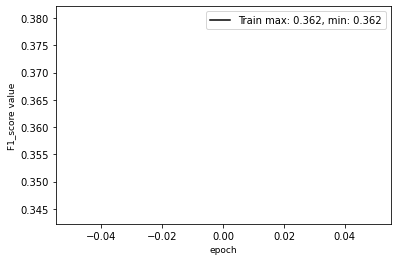

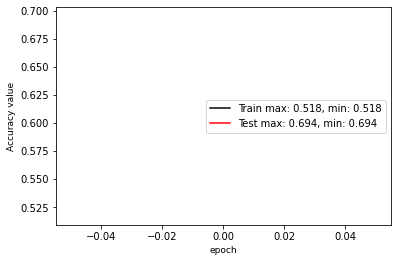

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_000.ckpt
Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 001 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.940939
accuracy: 0.617679
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：65.80  Average F1 score：40.49 
 0.00 82.43 87.15 75.40  0.00 81.34 36.06 26.85 37.11 
 0.00 55.69 91.78 15.37  0.00 61.47 34.93 25.99 81.84 
 0.00 66.47 89.40 25.54  0.00 70.02 35.48 26.41 51.06 

learn rate: 0.010000
eval mean loss: 0.876761
eval accuracy: 0.657984
eval avg class acc: 0.407841


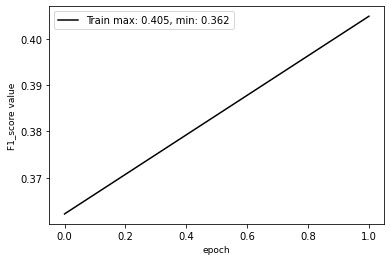

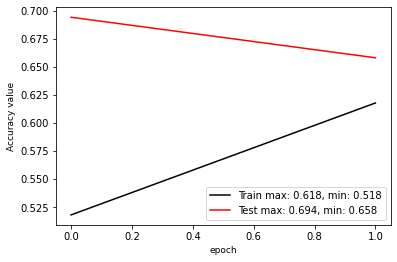

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_001.ckpt
**** EPOCH 002 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.683149
accuracy: 0.647481
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：71.55  Average F1 score：42.92 
 0.00 81.61 92.44 85.05  0.00 89.03 60.93 26.74 41.38 
 0.00 70.22 87.05 13.81  0.00 74.56 23.67 26.74 83.68 
 0.00 75.49 89.66 23.76  0.00 81.16 34.10 26.74 55.38 

learn rate: 0.010000
eval mean loss: 0.796210
eval accuracy: 0.715462
eval avg class acc: 0.421931


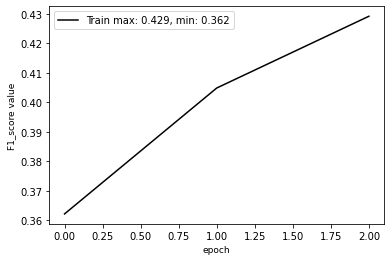

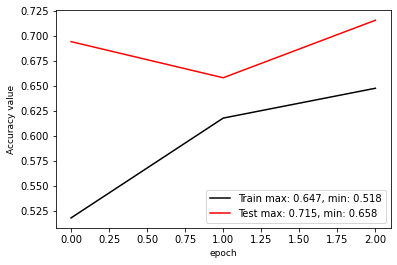

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_002.ckpt
**** EPOCH 003 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.688121
accuracy: 0.652901
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：73.20  Average F1 score：44.19 
 0.00 80.59 80.60 76.54  0.00 96.09 70.17 30.48 54.53 
 0.00 69.34 96.02 20.42  0.00 72.88 10.42 60.15 71.38 
 0.00 74.54 87.64 32.23  0.00 82.89 18.14 40.46 61.83 

learn rate: 0.010000
eval mean loss: 0.743922
eval accuracy: 0.732022
eval avg class acc: 0.445111


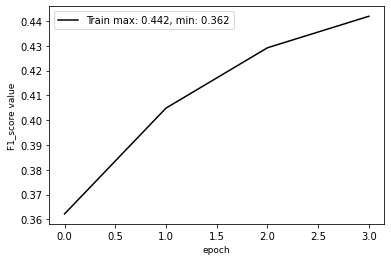

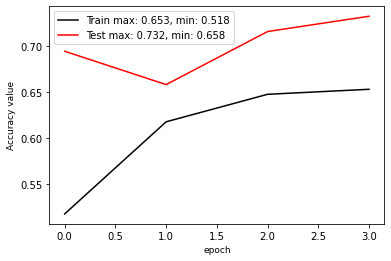

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_003.ckpt
**** EPOCH 004 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.531125
accuracy: 0.679796
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：72.72  Average F1 score：45.23 
 0.00 83.59 87.86 69.87  0.00 96.34 49.84 28.85 48.11 
 0.00 70.57 92.46 11.95  0.00 65.65 41.30 42.41 89.02 
 0.00 76.53 90.10 20.41  0.00 78.09 45.17 34.34 62.46 

learn rate: 0.010000
eval mean loss: 0.851267
eval accuracy: 0.727218
eval avg class acc: 0.459288


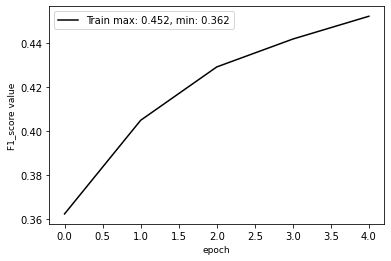

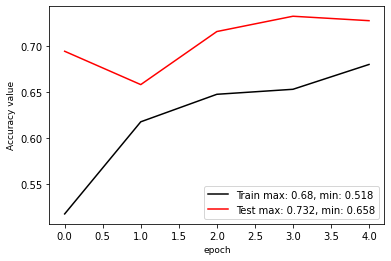

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_004.ckpt
**** EPOCH 005 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.433095
accuracy: 0.721802
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：75.18  Average F1 score：48.84 
 0.00 86.55 86.30 69.77  0.00 87.81 39.71 34.92 54.09 
 0.00 68.14 94.36 34.17  0.00 76.14 52.59 31.97 88.33 
 0.00 76.25 90.15 45.87  0.00 81.56 45.25 33.38 67.09 

learn rate: 0.010000
eval mean loss: 0.700701
eval accuracy: 0.751754
eval avg class acc: 0.495228


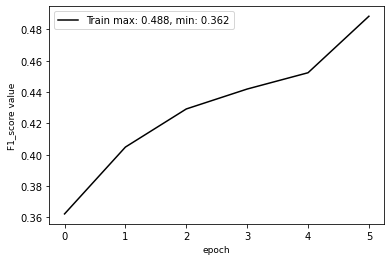

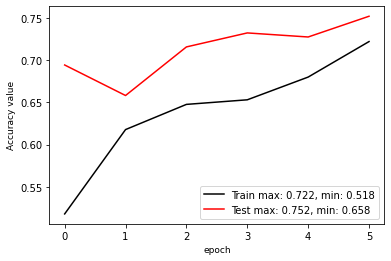

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_005.ckpt
**** EPOCH 006 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.361646
accuracy: 0.705078
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.12  Average F1 score：51.05 
 0.00 81.43 89.03 61.68  0.00 85.05 34.25 39.58 73.22 
 0.00 75.98 92.27 43.15  0.00 93.09 56.73 31.06 72.81 
 0.00 78.61 90.62 50.78  0.00 88.89 42.71 34.81 73.01 

learn rate: 0.010000
eval mean loss: 0.622370
eval accuracy: 0.791205
eval avg class acc: 0.516760


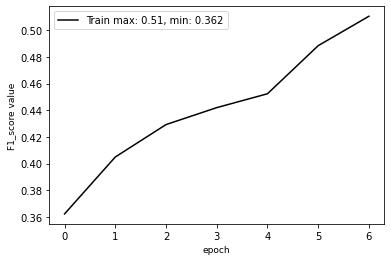

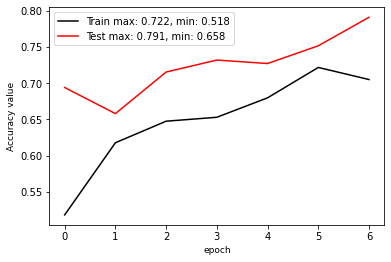

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_006.ckpt
**** EPOCH 007 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.269764
accuracy: 0.736287
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.09  Average F1 score：50.47 
 0.00 82.93 90.21 73.98  0.00 86.42 41.21 33.18 68.29 
 0.00 71.37 91.06 29.91  0.00 93.32 57.03 29.46 84.38 
 0.00 76.71 90.63 42.60  0.00 89.73 47.85 31.21 75.49 

learn rate: 0.010000
eval mean loss: 0.641681
eval accuracy: 0.790928
eval avg class acc: 0.507251


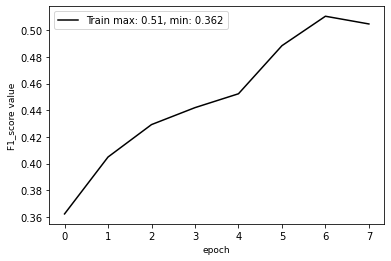

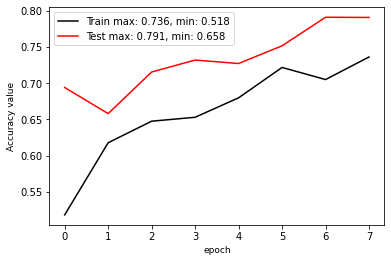

**** EPOCH 008 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.213241
accuracy: 0.738971
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：77.75  Average F1 score：52.09 
 0.00 84.41 86.80 62.65 21.16 91.29 49.97 36.54 59.71 
 0.00 73.12 94.21 44.82  1.87 80.75 51.84 37.95 86.28 
 0.00 78.36 90.35 52.26  3.44 85.70 50.89 37.23 70.57 

learn rate: 0.010000
eval mean loss: 0.652791
eval accuracy: 0.777528
eval avg class acc: 0.523156


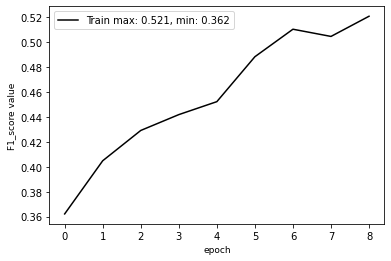

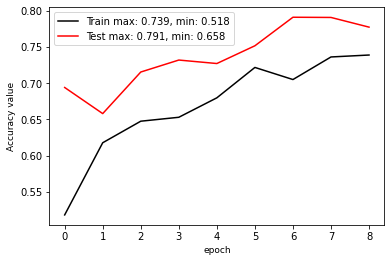

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_008.ckpt
**** EPOCH 009 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.188228
accuracy: 0.749830
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.07  Average F1 score：52.35 
 0.00 84.68 85.16 64.81 31.87 89.60 46.32 34.67 74.61 
 0.00 74.12 94.91 37.11  0.39 88.55 57.67 49.98 71.44 
 0.00 79.05 89.77 47.20  0.77 89.07 51.38 40.94 72.99 

learn rate: 0.010000
eval mean loss: 0.588620
eval accuracy: 0.790664
eval avg class acc: 0.526866


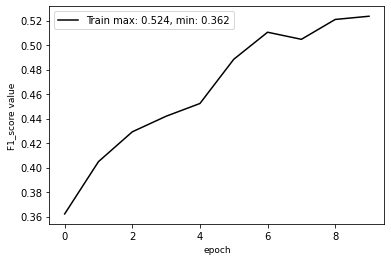

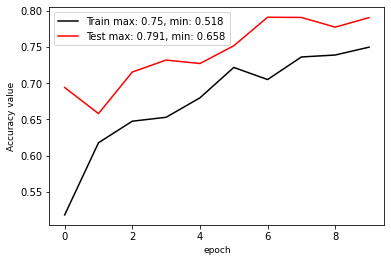

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_009.ckpt
**** EPOCH 010 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.157335
accuracy: 0.769720
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：74.06  Average F1 score：49.40 
 0.00 84.15 91.67 68.55  0.00 95.59 42.19 27.05 49.13 
 0.00 71.20 89.61 43.55  0.00 71.04 60.17 29.65 92.34 
 0.00 77.14 90.63 53.27  0.00 81.51 49.61 28.29 64.14 

learn rate: 0.010000
eval mean loss: 0.736231
eval accuracy: 0.740620
eval avg class acc: 0.508411


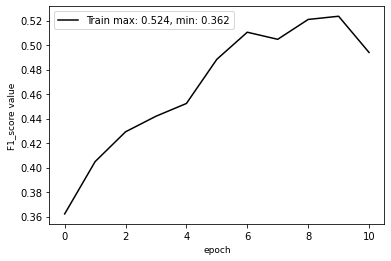

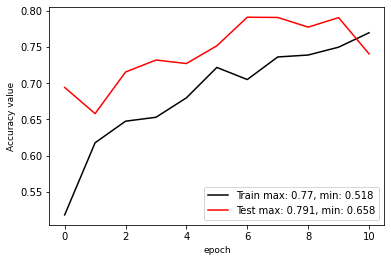

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 011 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.209415
accuracy: 0.743291
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.95  Average F1 score：52.54 
 0.00 88.36 85.37 57.24 17.14 93.39 35.50 33.93 70.78 
 0.00 68.27 95.47 52.24  0.08 87.21 67.02 42.63 83.27 
 0.00 77.03 90.14 54.62  0.16 90.19 46.41 37.78 76.52 

learn rate: 0.010000
eval mean loss: 0.598889
eval accuracy: 0.789454
eval avg class acc: 0.551307


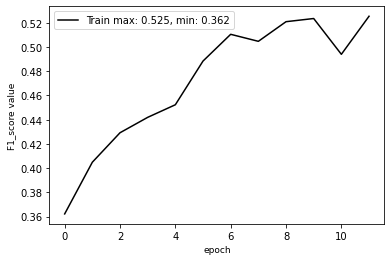

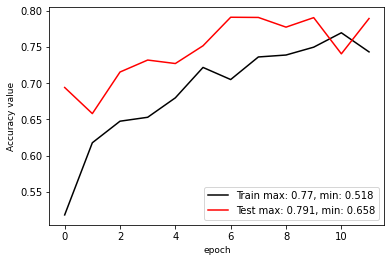

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_011.ckpt
**** EPOCH 012 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.123263
accuracy: 0.774205
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：75.69  Average F1 score：50.33 
50.00 73.07 94.68 87.57  0.00 93.36 51.26 32.19 61.57 
 0.33 78.30 77.03 27.75  0.00 82.72 50.81 50.21 85.56 
 0.66 75.59 84.95 42.15  0.00 87.72 51.03 39.23 71.61 

learn rate: 0.010000
eval mean loss: 0.696870
eval accuracy: 0.756881
eval avg class acc: 0.503009


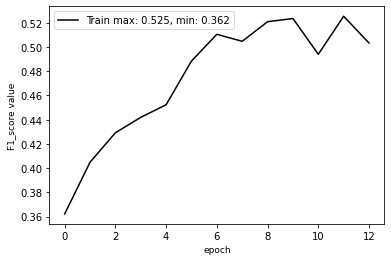

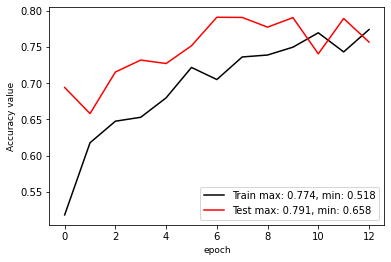

**** EPOCH 013 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.112406
accuracy: 0.757639
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：76.80  Average F1 score：50.54 
 0.00 89.98 87.34 65.43  0.00 83.45 26.29 31.64 83.02 
 0.00 63.43 92.59 44.36  0.00 93.87 66.14 47.61 66.22 
 0.00 74.41 89.89 52.88  0.00 88.36 37.63 38.02 73.67 

learn rate: 0.010000
eval mean loss: 0.649682
eval accuracy: 0.767954
eval avg class acc: 0.526917


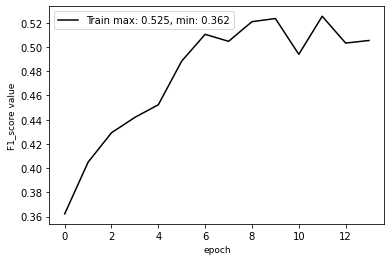

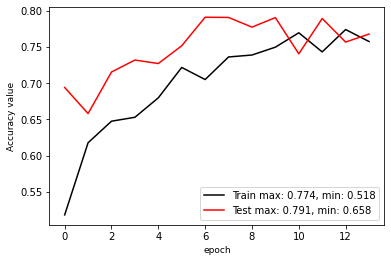

**** EPOCH 014 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.083036
accuracy: 0.744927
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：73.83  Average F1 score：50.80 
 0.00 86.84 87.63 65.04 24.71 95.36 46.49 32.51 50.46 
 0.00 69.17 93.94 48.41  0.57 66.05 58.49 49.02 87.25 
 0.00 77.01 90.67 55.50  1.11 78.05 51.81 39.10 63.94 

learn rate: 0.010000
eval mean loss: 0.798296
eval accuracy: 0.738320
eval avg class acc: 0.525452


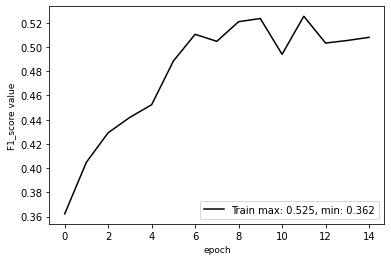

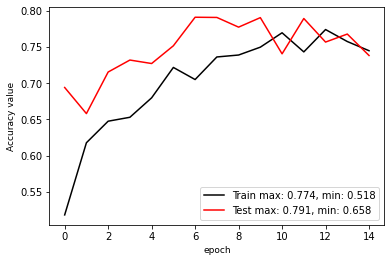

**** EPOCH 015 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.043657
accuracy: 0.761456
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.84  Average F1 score：55.52 
67.33 86.64 90.21 73.00  5.56 90.33 39.84 31.58 74.57 
11.33 69.97 92.05 45.36  0.03 92.93 62.63 46.44 81.41 
19.40 77.41 91.12 55.95  0.05 91.61 48.70 37.60 77.84 

learn rate: 0.010000
eval mean loss: 0.587812
eval accuracy: 0.798395
eval avg class acc: 0.557943


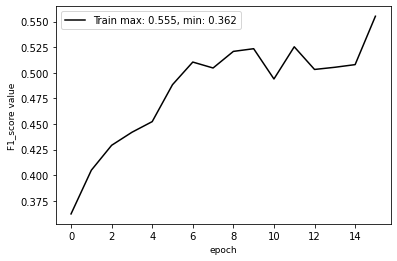

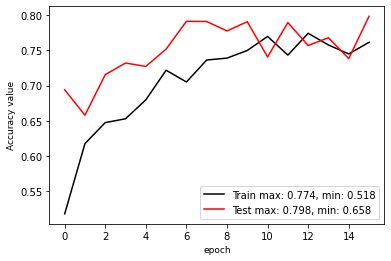

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_015.ckpt
**** EPOCH 016 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 0.980421
accuracy: 0.770581
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.85  Average F1 score：53.30 
84.38 87.21 91.76 66.54 25.45 92.31 37.71 30.75 64.42 
 4.50 72.10 92.58 45.90  0.38 86.37 67.52 38.27 84.96 
 8.54 78.94 92.17 54.32  0.74 89.24 48.39 34.10 73.28 

learn rate: 0.010000
eval mean loss: 0.610899
eval accuracy: 0.788548
eval avg class acc: 0.547306


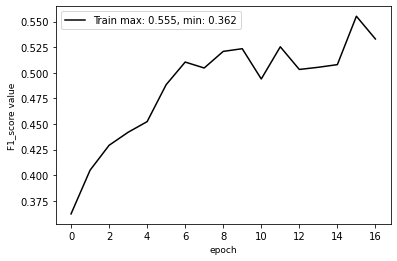

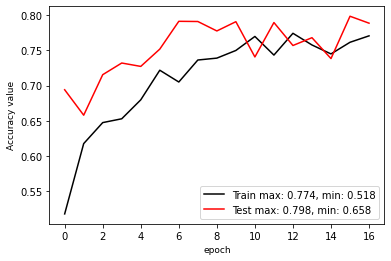

**** EPOCH 017 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 0.969797
accuracy: 0.773909
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.84  Average F1 score：56.55 
52.43 86.49 90.66 87.70 30.77 90.06 29.52 32.65 80.31 
36.00 71.09 92.13 32.69  1.02 92.34 72.41 51.31 68.99 
42.69 78.04 91.39 47.62  1.98 91.18 41.94 39.91 74.22 

learn rate: 0.010000
eval mean loss: 0.616815
eval accuracy: 0.788380
eval avg class acc: 0.575537


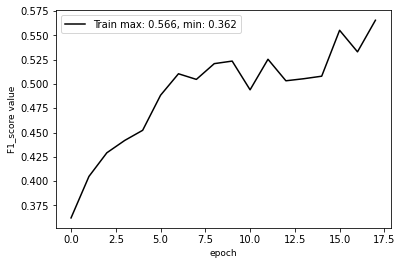

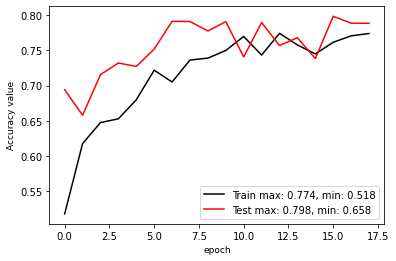

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_017.ckpt
**** EPOCH 018 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 0.976889
accuracy: 0.783385
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.83  Average F1 score：54.62 
 0.00 82.40 90.98 65.08 39.85 90.95 33.78 33.31 83.55 
 0.00 71.30 88.68 42.66 11.80 93.21 70.81 56.06 69.68 
 0.00 76.45 89.81 51.54 18.21 92.07 45.74 41.79 75.99 

learn rate: 0.010000
eval mean loss: 0.612294
eval accuracy: 0.788295
eval avg class acc: 0.560237


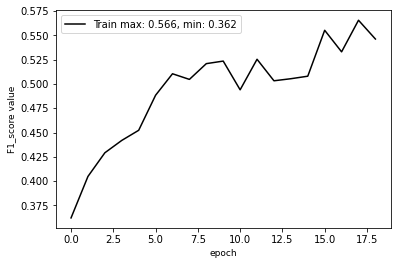

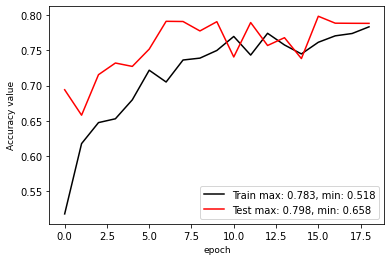

**** EPOCH 019 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.012121
accuracy: 0.788049
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.83  Average F1 score：58.30 
79.00 85.52 84.43 60.73 44.25 92.69 45.57 36.86 80.30 
13.17 72.38 95.93 65.53  3.00 91.75 62.40 48.04 77.09 
22.57 78.40 89.82 63.04  5.63 92.22 52.67 41.71 78.66 

learn rate: 0.010000
eval mean loss: 0.548320
eval accuracy: 0.808270
eval avg class acc: 0.588111


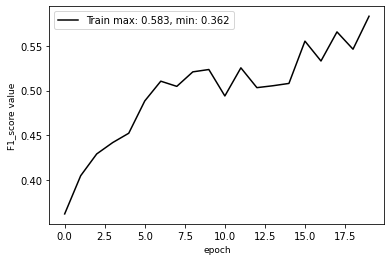

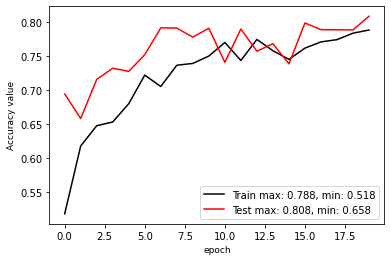

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_019.ckpt
**** EPOCH 020 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.927355
accuracy: 0.795927
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.80  Average F1 score：61.25 
59.86 84.70 89.78 75.68 18.09 91.89 42.53 36.70 76.37 
42.50 77.08 92.79 61.08  0.23 92.92 66.25 38.42 83.42 
49.71 80.71 91.26 67.60  0.45 92.40 51.81 37.54 79.74 

learn rate: 0.005000
eval mean loss: 0.533716
eval accuracy: 0.817983
eval avg class acc: 0.616341


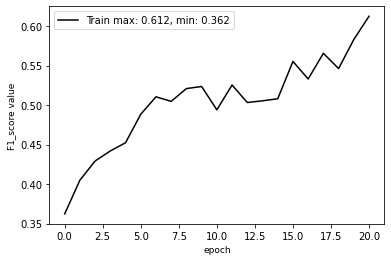

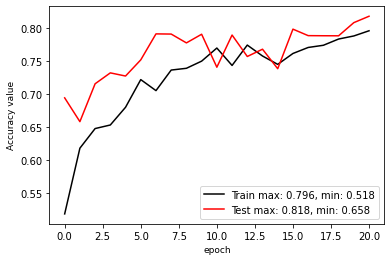

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_020.ckpt
Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 021 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.855797
accuracy: 0.802861
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.12  Average F1 score：61.34 
72.02 86.51 89.48 77.09 46.96 90.76 38.07 35.24 83.89 
26.17 75.43 93.31 63.89  7.28 94.54 67.05 51.65 69.83 
38.39 80.59 91.35 69.87 12.60 92.61 48.57 41.90 76.22 

learn rate: 0.005000
eval mean loss: 0.540284
eval accuracy: 0.811192
eval avg class acc: 0.610175


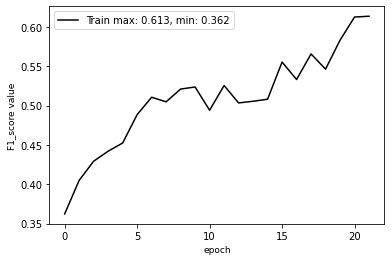

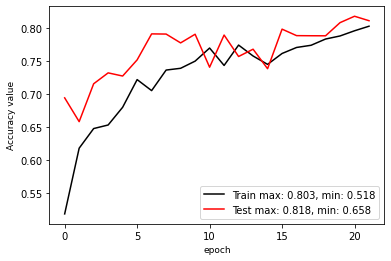

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_021.ckpt
**** EPOCH 022 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.853271
accuracy: 0.812263
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.58  Average F1 score：60.79 
61.26 80.90 92.27 88.59 34.88 93.86 39.39 36.04 79.43 
37.17 82.99 89.85 53.40  0.40 90.87 66.14 44.12 78.67 
46.27 81.93 91.04 66.63  0.80 92.34 49.38 39.67 79.05 

learn rate: 0.005000
eval mean loss: 0.536568
eval accuracy: 0.815797
eval avg class acc: 0.603996


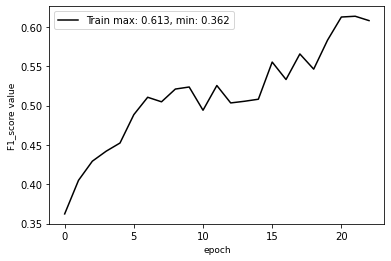

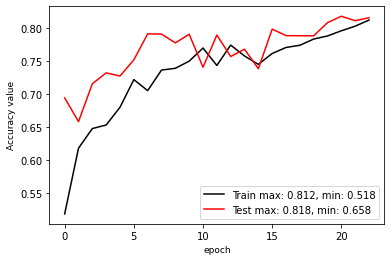

**** EPOCH 023 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.824631
accuracy: 0.814144
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.54  Average F1 score：60.08 
65.16 86.25 90.29 74.29  0.00 89.63 34.10 33.61 81.73 
38.33 75.14 92.96 64.13  0.00 94.37 68.93 44.19 70.87 
48.27 80.31 91.61 68.84  0.00 91.94 45.63 38.18 75.91 

learn rate: 0.005000
eval mean loss: 0.554947
eval accuracy: 0.805445
eval avg class acc: 0.609923


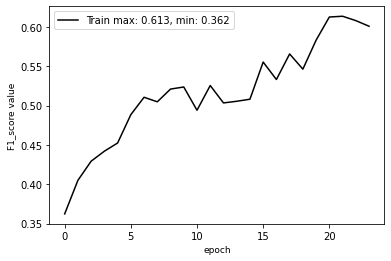

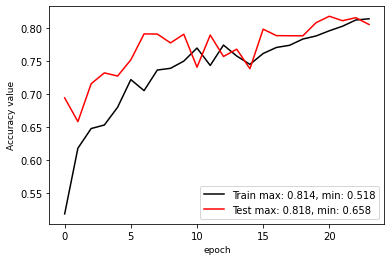

**** EPOCH 024 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.831369
accuracy: 0.822432
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.84  Average F1 score：60.84 
55.56 88.11 86.77 77.12  0.00 89.71 45.06 33.29 75.24 
45.00 67.00 94.05 64.46  0.00 92.70 63.94 47.72 80.98 
49.72 76.11 90.27 70.22  0.00 91.18 52.87 39.22 78.00 

learn rate: 0.005000
eval mean loss: 0.584713
eval accuracy: 0.798390
eval avg class acc: 0.617603


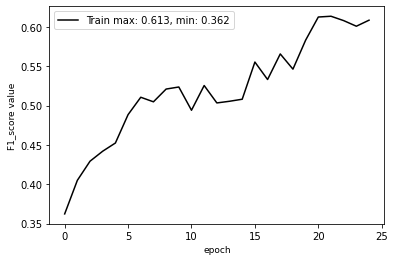

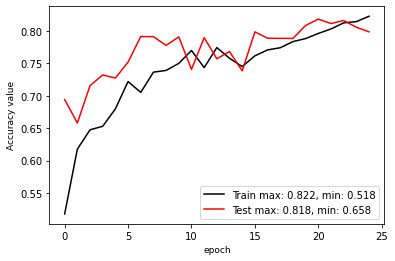

**** EPOCH 025 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.826260
accuracy: 0.826133
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.98  Average F1 score：61.20 
62.57 85.39 86.37 68.76 25.00 94.31 46.32 36.23 75.16 
37.33 76.07 94.11 70.17  0.01 89.62 65.26 46.76 79.09 
46.76 80.46 90.08 69.46  0.03 91.91 54.18 40.83 77.07 

learn rate: 0.005000
eval mean loss: 0.526203
eval accuracy: 0.809842
eval avg class acc: 0.620487


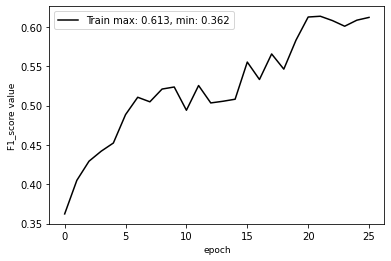

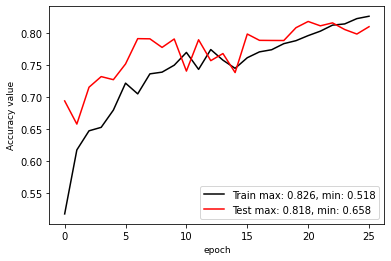

**** EPOCH 026 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.809602
accuracy: 0.825460
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.95  Average F1 score：58.99 
73.05 84.17 90.96 83.42 29.90 89.85 41.31 33.00 77.85 
20.33 73.24 90.16 57.96  1.60 93.28 65.54 50.56 75.46 
31.81 78.33 90.56 68.40  3.04 91.53 50.68 39.94 76.64 

learn rate: 0.005000
eval mean loss: 0.576365
eval accuracy: 0.799497
eval avg class acc: 0.586823


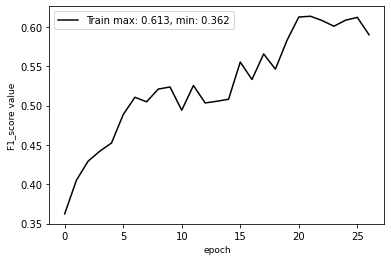

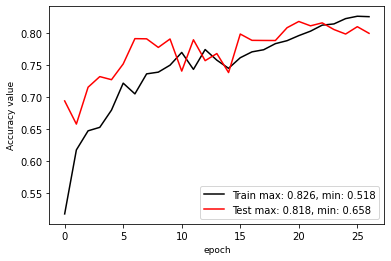

**** EPOCH 027 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.792637
accuracy: 0.828779
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.02  Average F1 score：62.94 
68.11 82.52 89.48 88.54 51.26 93.13 42.88 38.58 82.40 
42.00 81.10 91.87 56.69  3.30 92.42 65.68 49.17 75.60 
51.96 81.81 90.66 69.12  6.20 92.77 51.88 43.24 78.85 

learn rate: 0.005000
eval mean loss: 0.523073
eval accuracy: 0.820164
eval avg class acc: 0.619809


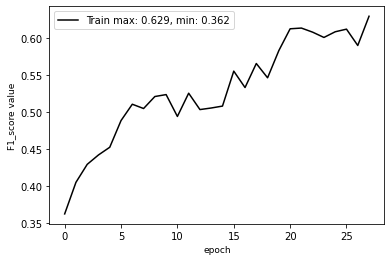

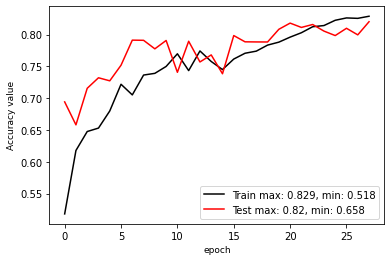

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_027.ckpt
**** EPOCH 028 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.780825
accuracy: 0.830201
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.60  Average F1 score：59.66 
72.61 86.43 85.00 81.26 66.40 93.72 41.87 35.79 77.70 
19.00 71.86 94.75 66.67  1.12 91.64 67.88 48.82 77.36 
30.12 78.48 89.61 73.24  2.20 92.67 51.80 41.30 77.53 

learn rate: 0.005000
eval mean loss: 0.553993
eval accuracy: 0.805982
eval avg class acc: 0.599000


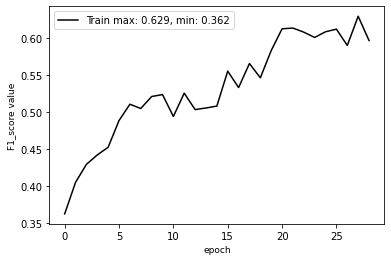

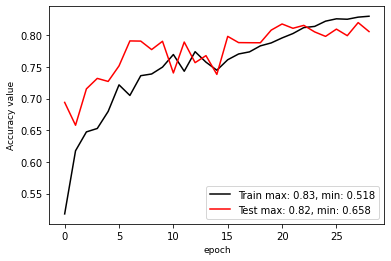

**** EPOCH 029 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.765840
accuracy: 0.841586
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.05  Average F1 score：62.11 
64.97 81.73 89.67 82.00 38.05 94.81 41.52 36.73 76.17 
40.50 79.70 89.77 62.54  2.68 90.15 68.35 44.69 80.47 
49.90 80.70 89.72 70.96  5.01 92.42 51.66 40.32 78.26 

learn rate: 0.005000
eval mean loss: 0.550265
eval accuracy: 0.810451
eval avg class acc: 0.620959


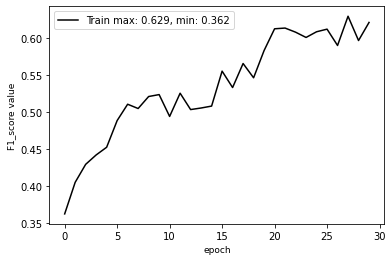

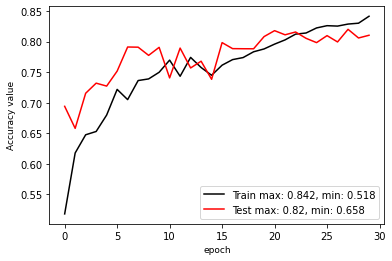

**** EPOCH 030 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.813218
accuracy: 0.824762
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.34  Average F1 score：60.32 
71.21 79.62 92.77 92.15 35.25 93.32 38.73 35.27 76.34 
30.50 80.60 85.97 55.72  1.16 91.32 69.16 45.45 78.58 
42.71 80.11 89.24 69.45  2.24 92.31 49.66 39.72 77.45 

learn rate: 0.005000
eval mean loss: 0.573635
eval accuracy: 0.803449
eval avg class acc: 0.598297


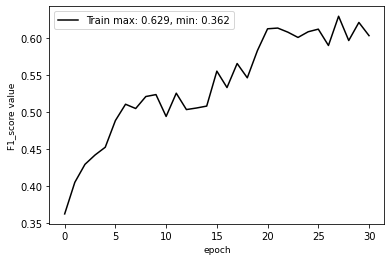

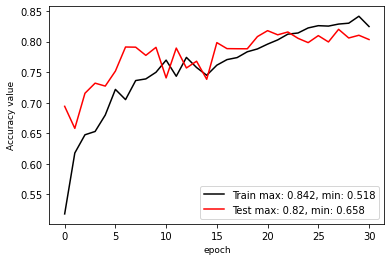

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 031 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.794628
accuracy: 0.835223
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.93  Average F1 score：64.52 
72.73 85.55 89.57 77.29 48.79 94.95 47.47 33.86 70.51 
38.67 74.12 92.62 67.64 17.88 89.90 63.75 42.67 84.38 
50.49 79.42 91.07 72.14 26.17 92.36 54.42 37.76 76.82 

learn rate: 0.005000
eval mean loss: 0.531968
eval accuracy: 0.809295
eval avg class acc: 0.635125


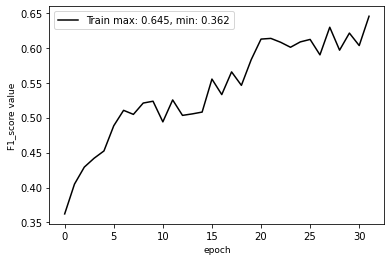

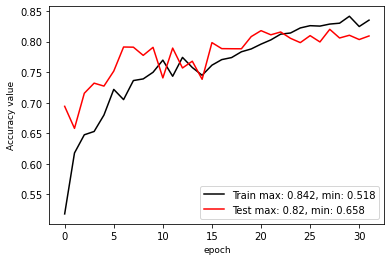

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_031.ckpt
**** EPOCH 032 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.754169
accuracy: 0.831060
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.74  Average F1 score：59.67 
71.01 88.36 85.01 79.75 39.41 92.61 43.67 34.62 88.73 
16.33 69.93 96.03 64.78  1.25 93.66 65.87 63.37 69.36 
26.56 78.07 90.18 71.49  2.43 93.13 52.52 44.78 77.86 

learn rate: 0.005000
eval mean loss: 0.556287
eval accuracy: 0.807359
eval avg class acc: 0.600646


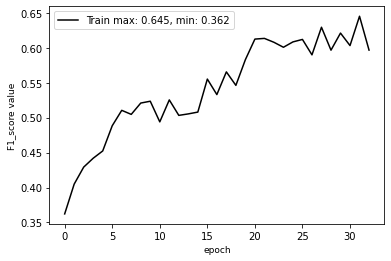

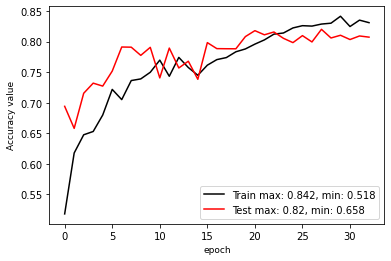

**** EPOCH 033 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.753585
accuracy: 0.833317
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.43  Average F1 score：60.19 
74.86 87.64 87.43 91.25 72.42 94.69 40.72 33.64 73.05 
21.83 70.10 93.99 48.09  8.70 86.05 72.34 56.24 80.27 
33.81 77.89 90.59 62.98 15.54 90.16 52.11 42.10 76.49 

learn rate: 0.005000
eval mean loss: 0.573949
eval accuracy: 0.794338
eval avg class acc: 0.597364


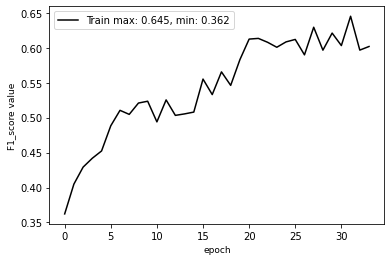

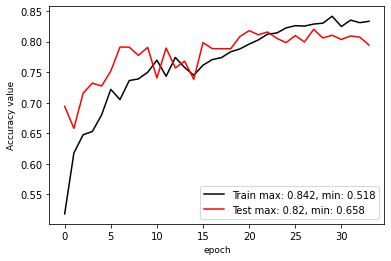

**** EPOCH 034 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.804760
accuracy: 0.809823
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.31  Average F1 score：62.38 
57.48 84.70 88.83 84.16 80.00 92.87 38.75 38.83 76.48 
52.50 77.91 92.95 61.60  1.35 90.20 70.69 43.57 79.84 
54.88 81.16 90.84 71.13  2.65 91.52 50.06 41.06 78.12 

learn rate: 0.005000
eval mean loss: 0.565809
eval accuracy: 0.813138
eval avg class acc: 0.633998


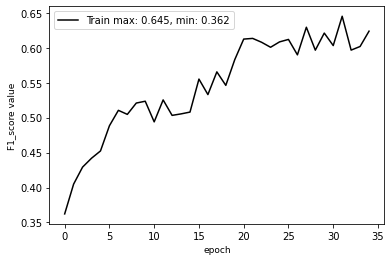

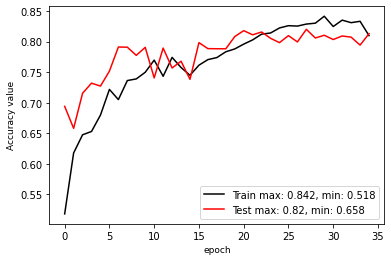

**** EPOCH 035 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.743120
accuracy: 0.854459
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.41  Average F1 score：60.45 
69.75 83.94 90.77 90.51 97.58 93.60 33.77 34.12 76.20 
41.50 78.16 91.30 50.43  1.63 90.54 71.73 43.35 75.67 
52.04 80.95 91.04 64.77  3.21 92.04 45.92 38.18 75.94 

learn rate: 0.005000
eval mean loss: 0.560020
eval accuracy: 0.804097
eval avg class acc: 0.604794


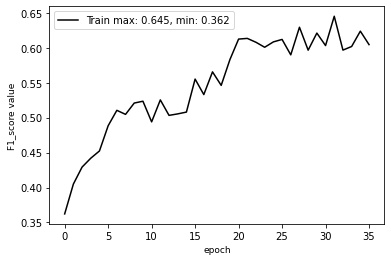

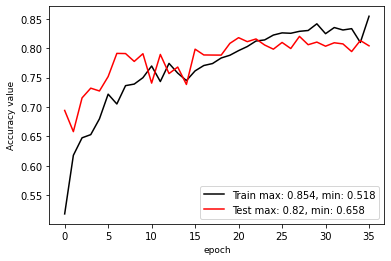

**** EPOCH 036 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.727989
accuracy: 0.856742
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.78  Average F1 score：60.53 
74.14 86.40 89.06 93.02 25.64 93.71 45.84 32.25 78.69 
28.67 70.51 92.96 51.05  0.54 93.17 67.10 55.26 79.74 
41.35 77.65 90.97 65.92  1.06 93.44 54.47 40.73 79.21 

learn rate: 0.005000
eval mean loss: 0.560000
eval accuracy: 0.807770
eval avg class acc: 0.598873


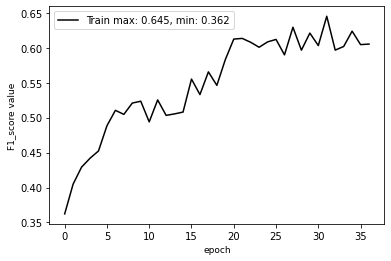

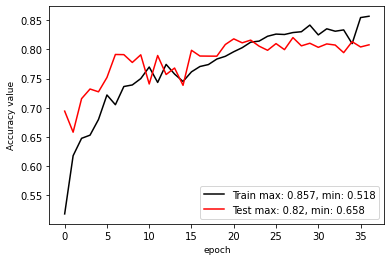

**** EPOCH 037 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.708762
accuracy: 0.853590
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.32  Average F1 score：62.13 
71.13 85.83 88.81 82.52 65.17 93.38 37.01 33.42 73.88 
34.50 70.28 92.14 66.72  8.60 88.99 70.40 52.04 77.56 
46.46 77.28 90.45 73.78 15.19 91.13 48.51 40.70 75.68 

learn rate: 0.005000
eval mean loss: 0.585219
eval accuracy: 0.793156
eval avg class acc: 0.623580


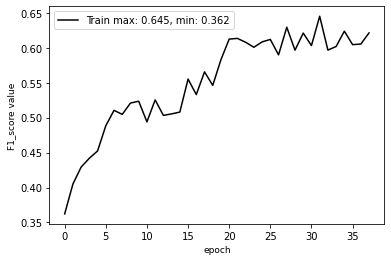

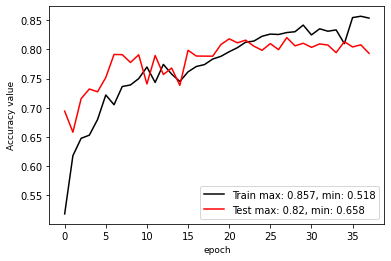

**** EPOCH 038 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.727685
accuracy: 0.853264
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.17  Average F1 score：61.59 
75.76 85.94 90.90 93.48 71.94 94.04 42.29 34.60 76.99 
29.17 75.74 92.08 49.14  5.39 89.65 69.58 54.43 81.24 
42.12 80.52 91.48 64.42 10.03 91.79 52.61 42.30 79.06 

learn rate: 0.005000
eval mean loss: 0.560423
eval accuracy: 0.811695
eval avg class acc: 0.607136


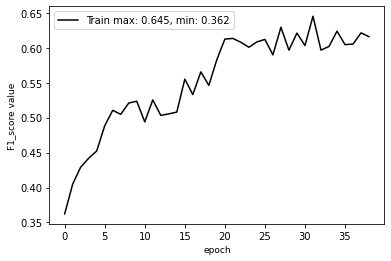

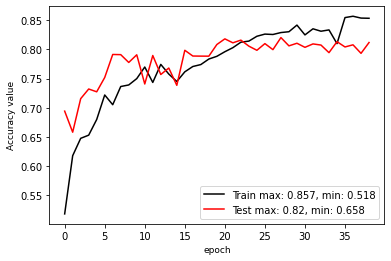

**** EPOCH 039 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.707452
accuracy: 0.860540
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.08  Average F1 score：54.79 
77.61 85.60 89.12 91.62 80.58 91.40 50.41 32.64 72.64 
 8.67 71.37 91.54 24.76  3.02 91.97 63.22 49.18 83.25 
15.59 77.84 90.32 38.98  5.82 91.68 56.09 39.24 77.58 

learn rate: 0.005000
eval mean loss: 0.602988
eval accuracy: 0.800831
eval avg class acc: 0.541079


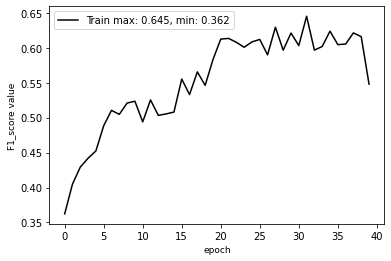

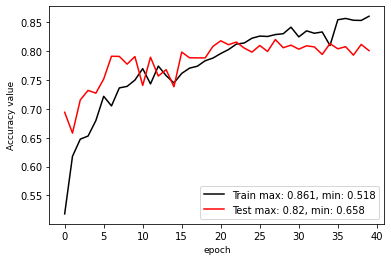

**** EPOCH 040 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.670453
accuracy: 0.860053
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.07  Average F1 score：62.81 
69.67 89.15 87.45 93.14 63.76 93.32 43.47 32.00 73.12 
49.00 69.57 95.14 52.72  6.12 89.94 68.19 50.04 79.56 
57.53 78.15 91.14 67.33 11.16 91.60 53.09 39.04 76.21 

learn rate: 0.002500
eval mean loss: 0.567460
eval accuracy: 0.800741
eval avg class acc: 0.622541


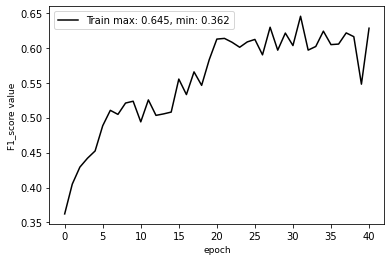

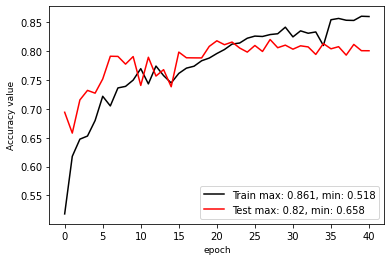

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 041 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.646778
accuracy: 0.857592
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.93  Average F1 score：63.91 
65.86 85.30 90.09 93.45 75.98 93.23 47.74 35.01 78.66 
50.17 74.62 92.16 45.77  8.39 93.91 66.52 50.33 82.40 
56.95 79.61 91.11 61.44 15.12 93.57 55.59 41.29 80.49 

learn rate: 0.002500
eval mean loss: 0.548790
eval accuracy: 0.819266
eval avg class acc: 0.626967


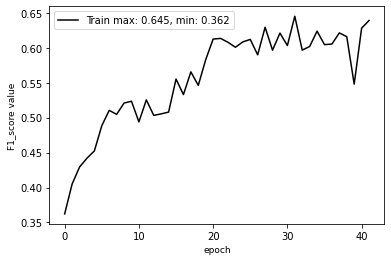

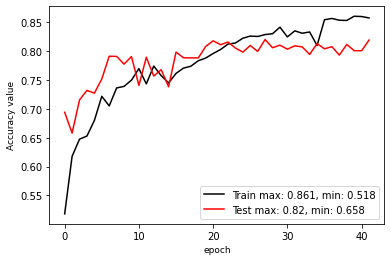

**** EPOCH 042 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.644320
accuracy: 0.860757
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.68  Average F1 score：63.76 
79.78 86.45 88.75 89.33 59.96 94.14 45.44 36.78 76.78 
36.17 75.95 93.97 48.33 12.45 89.98 68.92 51.41 81.10 
49.77 80.86 91.28 62.72 20.62 92.01 54.77 42.88 78.88 

learn rate: 0.002500
eval mean loss: 0.525508
eval accuracy: 0.816849
eval avg class acc: 0.620309


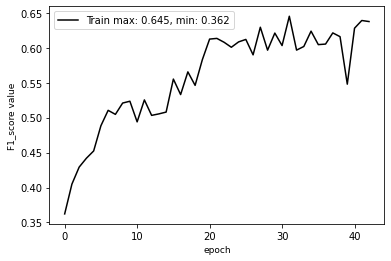

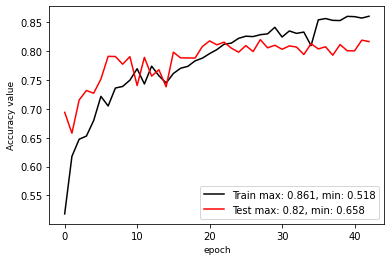

**** EPOCH 043 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.639142
accuracy: 0.872400
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.63  Average F1 score：63.56 
72.38 83.66 92.28 93.86 81.04 94.16 42.42 35.72 82.34 
43.67 79.62 90.69 41.61 10.25 91.04 71.17 59.27 74.67 
54.47 81.59 91.48 57.66 18.20 92.57 53.15 44.57 78.32 

learn rate: 0.002500
eval mean loss: 0.541520
eval accuracy: 0.816319
eval avg class acc: 0.624431


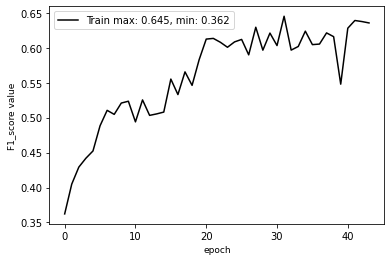

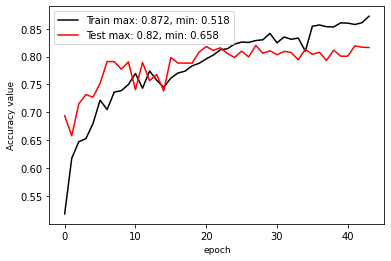

**** EPOCH 044 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.645163
accuracy: 0.861860
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.09  Average F1 score：62.65 
73.63 87.15 89.15 91.92 53.75 94.46 44.62 30.26 77.08 
44.67 66.76 93.42 53.72  3.96 91.57 70.19 54.46 82.62 
55.60 75.61 91.23 67.81  7.38 92.99 54.56 38.90 79.75 

learn rate: 0.002500
eval mean loss: 0.568673
eval accuracy: 0.800942
eval avg class acc: 0.623742


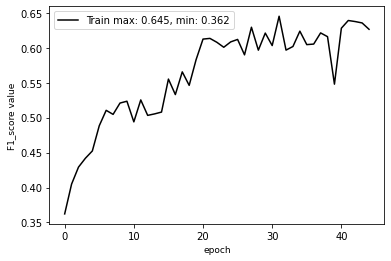

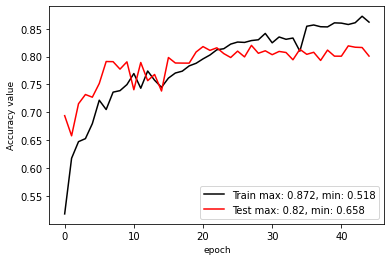

**** EPOCH 045 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.629907
accuracy: 0.869506
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.00  Average F1 score：62.46 
72.03 84.28 89.10 90.29 64.12 95.95 46.63 34.43 77.39 
34.33 77.61 92.56 51.43  7.92 84.79 63.93 68.47 72.04 
46.50 80.81 90.80 65.53 14.10 90.02 53.93 45.82 74.62 

learn rate: 0.002500
eval mean loss: 0.607924
eval accuracy: 0.800029
eval avg class acc: 0.614540


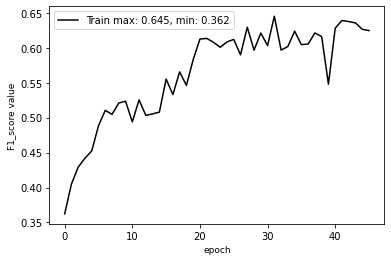

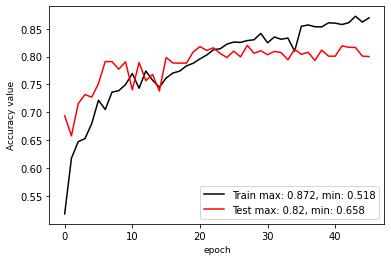

**** EPOCH 046 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.646270
accuracy: 0.853251
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.71  Average F1 score：65.66 
69.93 84.74 91.06 90.70 62.95 92.77 51.04 32.37 78.21 
51.17 73.45 90.46 52.89 16.87 92.47 66.00 57.28 76.66 
59.10 78.70 90.76 66.81 26.61 92.62 57.56 41.36 77.43 

learn rate: 0.002500
eval mean loss: 0.582105
eval accuracy: 0.807099
eval avg class acc: 0.641386


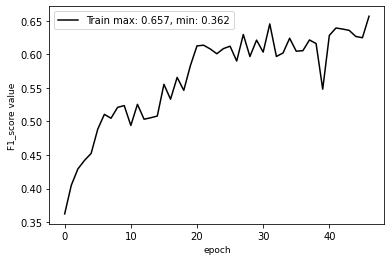

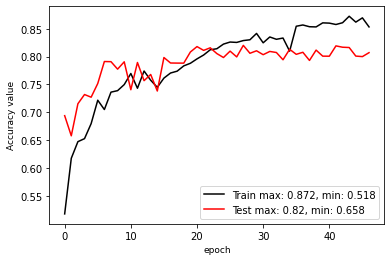

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_046.ckpt
**** EPOCH 047 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.640637
accuracy: 0.869456
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.88  Average F1 score：64.63 
69.91 87.57 87.67 90.32 58.94 93.84 55.06 34.75 74.61 
53.83 72.83 94.72 39.99 14.52 92.32 63.44 46.16 85.77 
60.83 79.52 91.06 55.44 23.31 93.07 58.96 39.65 79.80 

learn rate: 0.002500
eval mean loss: 0.523648
eval accuracy: 0.818814
eval avg class acc: 0.626224


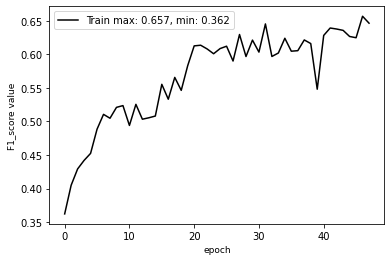

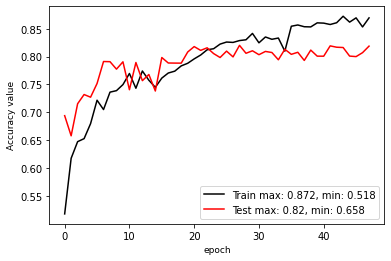

**** EPOCH 048 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.621678
accuracy: 0.875409
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.31  Average F1 score：66.10 
66.60 82.24 92.49 93.72 40.94 94.26 52.57 34.29 79.97 
55.17 73.87 88.13 53.53 14.36 93.58 67.03 58.78 81.95 
60.35 77.83 90.26 68.14 21.26 93.92 58.93 43.31 80.94 

learn rate: 0.002500
eval mean loss: 0.554497
eval accuracy: 0.813065
eval avg class acc: 0.651554


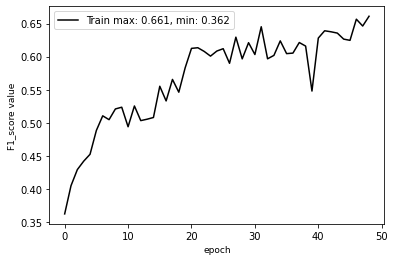

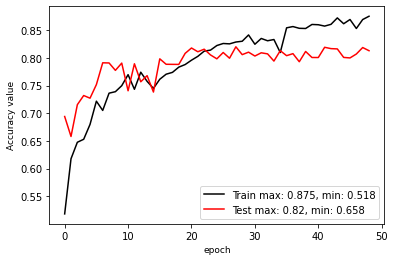

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_048.ckpt
**** EPOCH 049 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.612086
accuracy: 0.865782
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.68  Average F1 score：64.92 
75.78 86.98 89.38 86.30 68.32 93.94 41.38 35.61 76.66 
48.50 73.60 93.25 59.30 10.40 92.23 72.67 46.03 83.26 
59.15 79.73 91.27 70.30 18.05 93.07 52.73 40.16 79.83 

learn rate: 0.002500
eval mean loss: 0.560435
eval accuracy: 0.816808
eval avg class acc: 0.643608


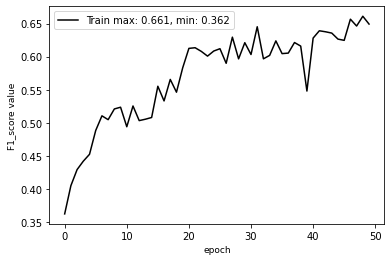

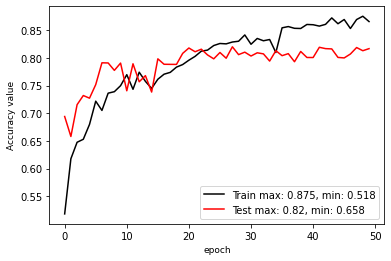

**** EPOCH 050 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.601085
accuracy: 0.865578
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.63  Average F1 score：62.67 
74.93 84.03 91.38 92.25 58.78 96.06 58.17 31.36 64.31 
41.83 74.44 90.79 53.94  6.99 81.67 58.66 57.65 82.93 
53.69 78.94 91.08 68.07 12.50 88.28 58.41 40.62 72.45 

learn rate: 0.002500
eval mean loss: 0.631026
eval accuracy: 0.786321
eval avg class acc: 0.609891


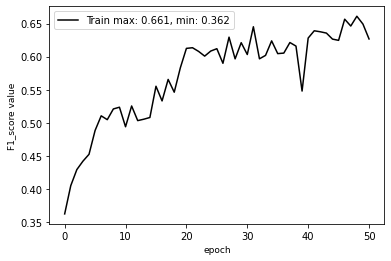

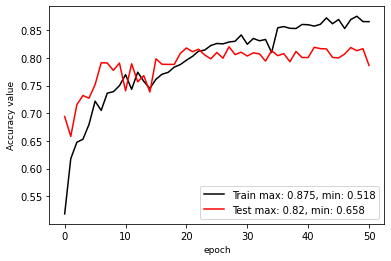

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 051 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.604144
accuracy: 0.867255
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.42  Average F1 score：64.79 
77.47 83.63 91.61 90.21 79.40 92.66 53.69 31.62 77.85 
47.00 69.45 89.18 57.15  8.93 93.21 62.22 58.45 83.76 
58.51 75.88 90.38 69.97 16.06 92.94 57.64 41.04 80.70 

learn rate: 0.002500
eval mean loss: 0.608989
eval accuracy: 0.804233
eval avg class acc: 0.632628


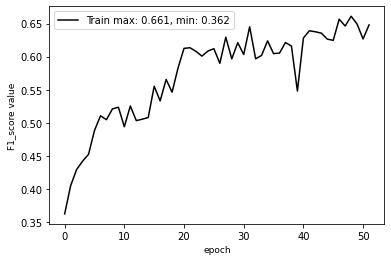

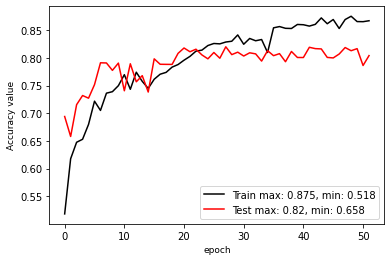

**** EPOCH 052 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.596028
accuracy: 0.865592
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.20  Average F1 score：64.69 
63.95 84.96 91.30 92.94 60.66 91.81 51.52 32.45 80.38 
70.67 73.51 90.63 45.06  7.40 94.37 66.13 55.06 78.75 
67.14 78.82 90.97 60.70 13.19 93.07 57.92 40.84 79.56 

learn rate: 0.002500
eval mean loss: 0.574085
eval accuracy: 0.812003
eval avg class acc: 0.646197


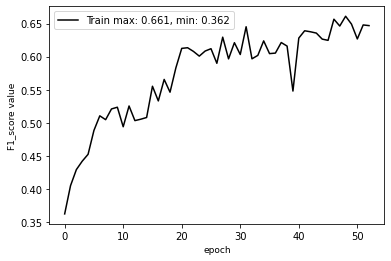

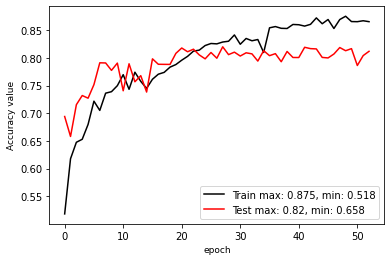

**** EPOCH 053 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.596345
accuracy: 0.866085
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.44  Average F1 score：65.45 
75.36 85.18 89.85 95.02 57.97 95.41 45.48 34.74 80.99 
52.50 74.74 92.74 45.79 14.07 90.39 70.66 59.40 78.66 
61.89 79.62 91.27 61.80 22.64 92.83 55.34 43.84 79.81 

learn rate: 0.002500
eval mean loss: 0.554749
eval accuracy: 0.814371
eval avg class acc: 0.643278


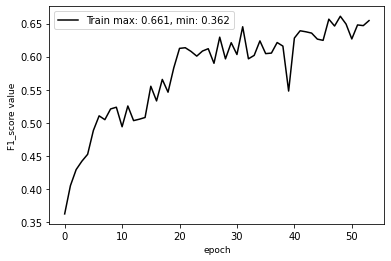

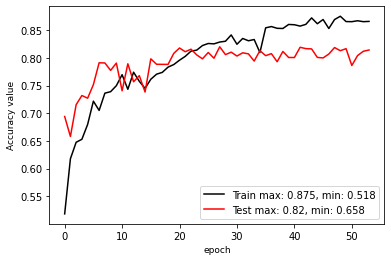

**** EPOCH 054 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.592406
accuracy: 0.863256
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：78.48  Average F1 score：61.48 
76.13 85.24 91.52 93.04 58.37 96.17 52.62 28.36 80.77 
39.33 67.59 91.55 27.02 16.34 87.68 65.15 76.22 71.47 
51.87 75.40 91.54 41.88 25.54 91.73 58.21 41.34 75.83 

learn rate: 0.002500
eval mean loss: 0.656768
eval accuracy: 0.784795
eval avg class acc: 0.602614


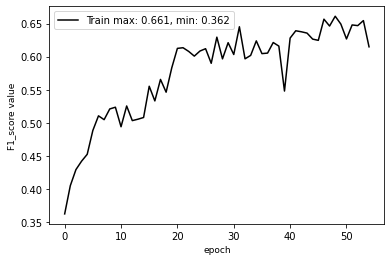

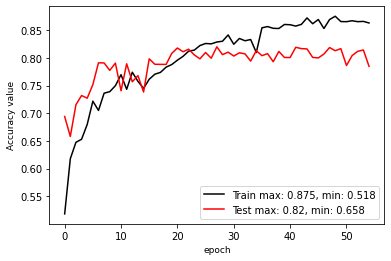

**** EPOCH 055 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.576864
accuracy: 0.861180
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.60  Average F1 score：63.03 
72.67 86.59 90.46 94.03 69.04 94.56 54.20 33.56 75.03 
54.50 73.72 93.26 30.15  8.11 90.93 65.87 54.39 84.86 
62.29 79.63 91.84 45.66 14.52 92.71 59.47 41.51 79.64 

learn rate: 0.002500
eval mean loss: 0.560395
eval accuracy: 0.816028
eval avg class acc: 0.617538


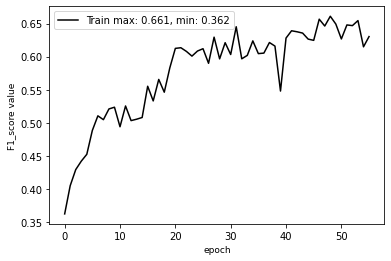

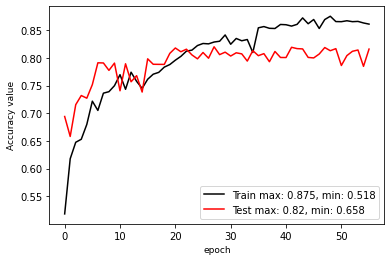

**** EPOCH 056 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.577303
accuracy: 0.870090
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.47  Average F1 score：64.00 
64.92 84.22 91.08 89.99 77.30 93.10 46.54 34.92 74.17 
70.33 77.05 91.43 46.33  5.78 91.73 66.83 44.69 82.91 
67.52 80.48 91.26 61.17 10.76 92.41 54.87 39.21 78.30 

learn rate: 0.002500
eval mean loss: 0.550756
eval accuracy: 0.814719
eval avg class acc: 0.641213


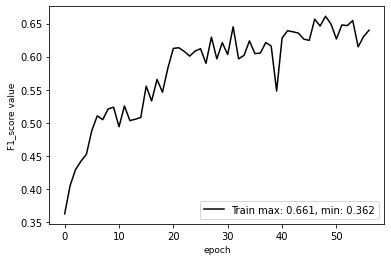

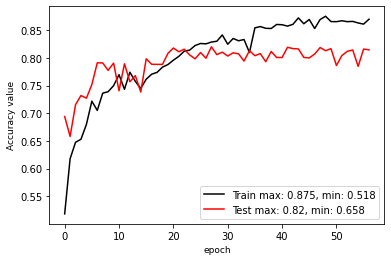

**** EPOCH 057 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.560730
accuracy: 0.875569
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.83  Average F1 score：67.73 
69.53 85.97 87.28 87.23 61.83 95.05 53.95 37.31 80.67 
66.17 78.01 95.25 61.33 12.96 91.94 64.73 50.57 79.67 
67.81 81.79 91.09 72.02 21.43 93.47 58.85 42.94 80.17 

learn rate: 0.002500
eval mean loss: 0.517466
eval accuracy: 0.828298
eval avg class acc: 0.667348


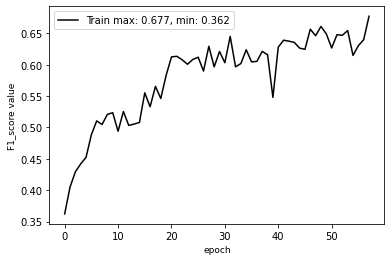

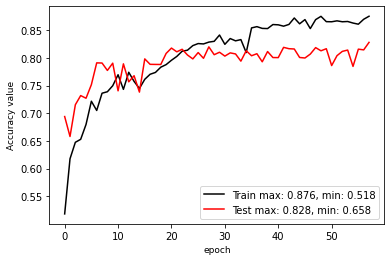

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_057.ckpt
**** EPOCH 058 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.563286
accuracy: 0.861913
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.85  Average F1 score：65.27 
74.61 81.99 91.90 92.98 72.53 95.68 52.19 35.16 79.72 
56.33 80.69 89.24 44.31  9.22 90.57 66.79 57.77 79.45 
64.20 81.33 90.55 60.02 16.35 93.05 58.59 43.72 79.59 

learn rate: 0.002500
eval mean loss: 0.589442
eval accuracy: 0.818483
eval avg class acc: 0.638184


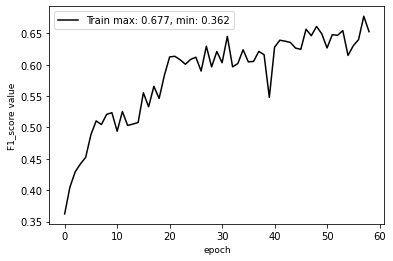

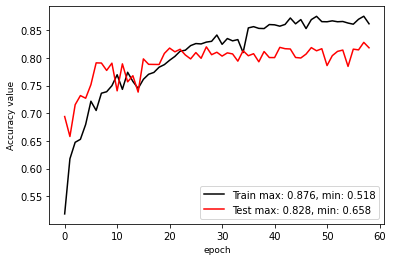

**** EPOCH 059 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.630951
accuracy: 0.863835
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.21  Average F1 score：65.54 
69.48 84.76 91.88 93.24 49.91 91.81 61.34 31.85 75.49 
64.50 73.70 90.66 51.67 10.71 93.62 54.04 51.69 83.14 
66.90 78.84 91.27 66.49 17.64 92.71 57.46 39.42 79.13 

learn rate: 0.002500
eval mean loss: 0.553611
eval accuracy: 0.812098
eval avg class acc: 0.637471


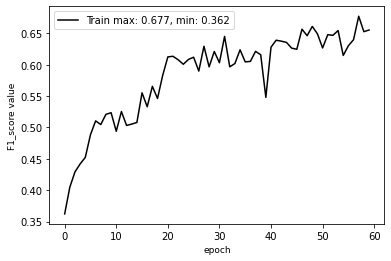

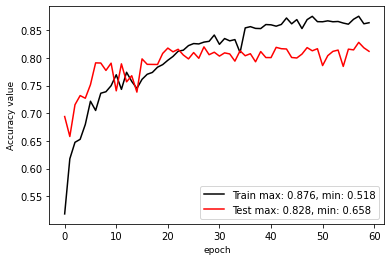

**** EPOCH 060 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.537212
accuracy: 0.876616
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.45  Average F1 score：66.92 
69.76 85.87 89.14 91.50 53.35 94.39 58.27 36.15 77.29 
62.67 76.48 93.46 45.85 18.54 92.38 61.44 51.65 82.51 
66.02 80.90 91.25 61.09 27.52 93.38 59.81 42.53 79.82 

learn rate: 0.001250
eval mean loss: 0.537460
eval accuracy: 0.824456
eval avg class acc: 0.649976


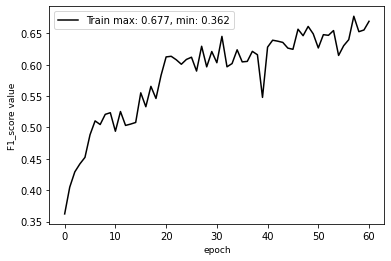

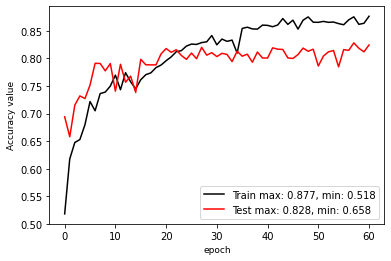

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 061 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.540091
accuracy: 0.878171
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.52  Average F1 score：66.93 
73.80 88.17 88.26 90.06 81.44 93.39 57.46 34.78 76.73 
66.67 73.61 94.68 52.27 11.41 94.22 63.11 48.40 83.94 
70.05 80.24 91.36 66.14 20.02 93.80 60.15 40.48 80.17 

learn rate: 0.001250
eval mean loss: 0.538737
eval accuracy: 0.825189
eval avg class acc: 0.653662


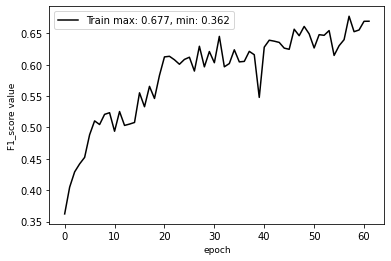

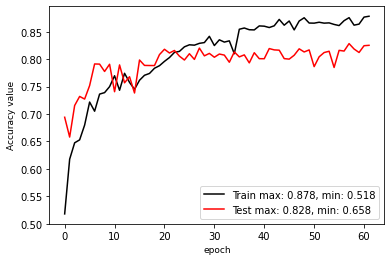

**** EPOCH 062 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.514632
accuracy: 0.873803
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.69  Average F1 score：66.89 
74.77 85.06 90.38 89.72 57.03 93.57 54.72 36.82 75.75 
67.17 78.62 92.30 43.55 17.60 92.92 65.21 43.60 84.75 
70.76 81.71 91.33 58.64 26.89 93.24 59.51 39.92 79.99 

learn rate: 0.001250
eval mean loss: 0.544531
eval accuracy: 0.826933
eval avg class acc: 0.650790


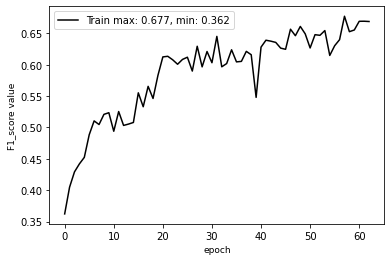

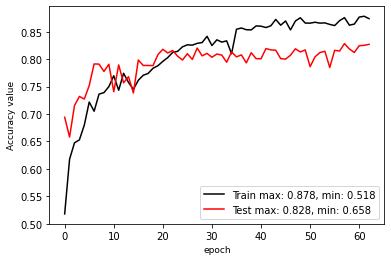

**** EPOCH 063 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.520448
accuracy: 0.879050
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.90  Average F1 score：63.78 
77.86 86.80 89.29 94.95 76.50 91.27 41.12 33.18 77.76 
54.50 71.92 93.20 41.05 12.54 94.05 71.56 45.04 78.39 
64.12 78.66 91.20 57.31 21.55 92.64 52.23 38.21 78.07 

learn rate: 0.001250
eval mean loss: 0.620484
eval accuracy: 0.808987
eval avg class acc: 0.624717


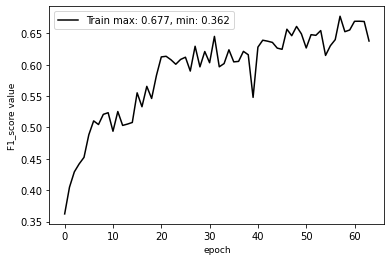

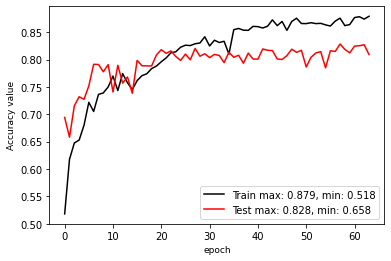

**** EPOCH 064 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.511069
accuracy: 0.875157
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.44  Average F1 score：63.85 
81.88 86.00 89.06 93.21 66.62 95.03 53.09 33.19 74.80 
39.17 74.50 93.74 42.18 13.07 90.90 68.13 50.59 81.27 
52.99 79.84 91.34 58.08 21.85 92.92 59.67 40.08 77.90 

learn rate: 0.001250
eval mean loss: 0.591034
eval accuracy: 0.814369
eval avg class acc: 0.615054


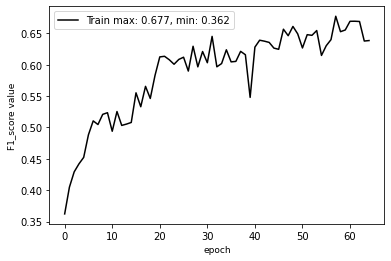

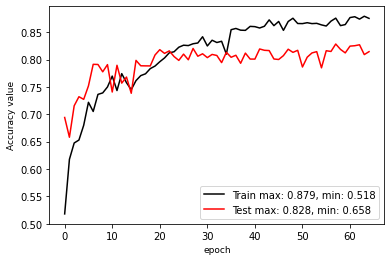

**** EPOCH 065 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.506176
accuracy: 0.879593
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.63  Average F1 score：68.85 
73.09 85.69 90.36 89.50 64.20 94.89 60.61 35.85 75.49 
67.00 77.96 92.85 56.77 20.25 91.56 63.32 51.33 82.72 
69.91 81.64 91.59 69.47 30.79 93.20 61.93 42.22 78.94 

learn rate: 0.001250
eval mean loss: 0.552158
eval accuracy: 0.826256
eval avg class acc: 0.670846


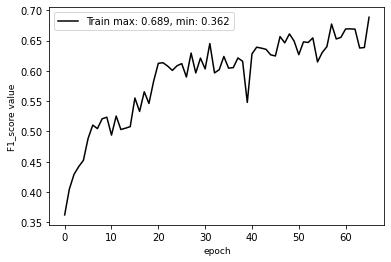

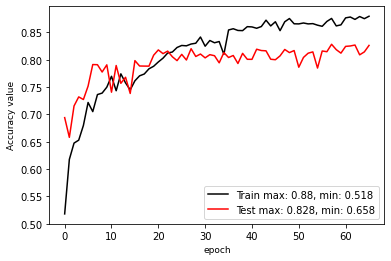

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_065.ckpt
**** EPOCH 066 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.491607
accuracy: 0.877708
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.57  Average F1 score：68.05 
75.79 84.65 91.25 92.39 56.62 94.39 60.84 35.68 72.57 
60.00 78.48 91.70 53.72 22.82 92.02 61.16 42.35 87.05 
66.98 81.45 91.47 67.94 32.53 93.19 61.00 38.73 79.15 

learn rate: 0.001250
eval mean loss: 0.561346
eval accuracy: 0.825692
eval avg class acc: 0.654804


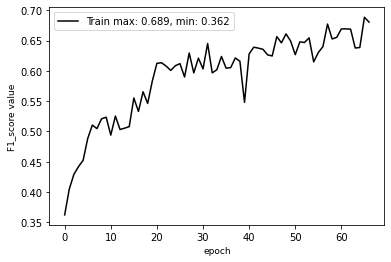

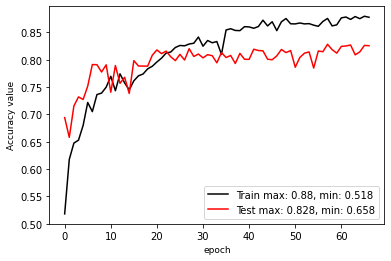

**** EPOCH 067 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.484142
accuracy: 0.893200
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.02  Average F1 score：67.60 
73.97 86.13 90.92 88.19 48.30 94.72 52.66 34.45 71.27 
68.67 76.11 92.47 59.41 18.35 91.32 65.01 41.28 86.99 
71.22 80.81 91.69 71.00 26.60 92.99 58.19 37.56 78.35 

learn rate: 0.001250
eval mean loss: 0.571977
eval accuracy: 0.820205
eval avg class acc: 0.666240


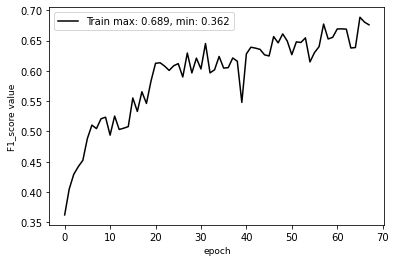

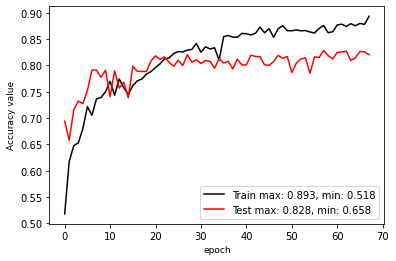

**** EPOCH 068 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.496738
accuracy: 0.883243
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：73.52  Average F1 score：56.81 
82.01 84.98 91.51 93.36 50.40 96.23 54.54 32.09 46.62 
25.83 76.65 91.89 33.39 16.92 61.04 49.36 46.74 86.67 
39.29 80.60 91.70 49.19 25.34 74.70 51.82 38.05 60.63 

learn rate: 0.001250
eval mean loss: 0.807166
eval accuracy: 0.735223
eval avg class acc: 0.542764


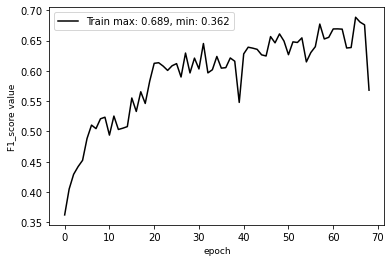

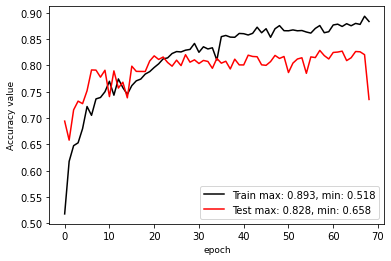

**** EPOCH 069 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.491858
accuracy: 0.889226
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.29  Average F1 score：64.51 
72.57 86.89 88.70 92.65 75.52 94.43 51.07 33.72 76.95 
71.00 74.29 93.64 35.68  8.27 90.44 67.74 55.79 80.12 
71.78 80.10 91.10 51.52 14.91 92.40 58.24 42.03 78.50 

learn rate: 0.001250
eval mean loss: 0.592959
eval accuracy: 0.812926
eval avg class acc: 0.641084


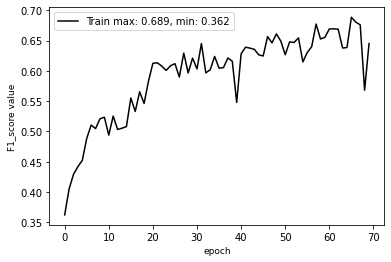

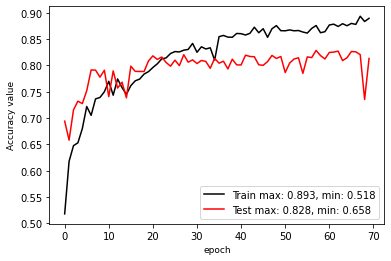

**** EPOCH 070 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.484047
accuracy: 0.882942
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.86  Average F1 score：66.56 
75.85 84.50 90.53 93.79 74.89 92.23 66.50 34.07 76.25 
67.00 76.20 92.17 43.15 14.03 92.91 56.53 51.98 81.58 
71.15 80.14 91.35 59.11 23.63 92.57 61.11 41.16 78.83 

learn rate: 0.001250
eval mean loss: 0.613022
eval accuracy: 0.818632
eval avg class acc: 0.639499


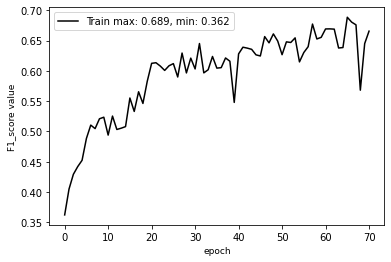

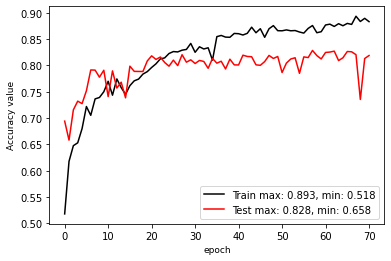

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 071 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.485732
accuracy: 0.894984
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.57  Average F1 score：64.54 
77.45 84.85 89.98 92.76 65.64 95.69 59.79 33.07 73.97 
60.67 76.30 92.27 30.04 13.77 90.21 62.80 51.70 84.28 
68.04 80.35 91.11 45.39 22.76 92.87 61.26 40.34 78.79 

learn rate: 0.001250
eval mean loss: 0.584978
eval accuracy: 0.815719
eval avg class acc: 0.624487


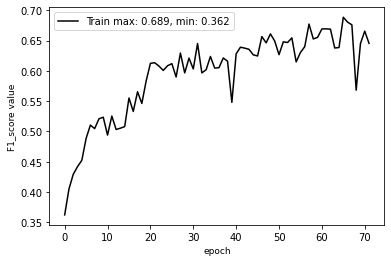

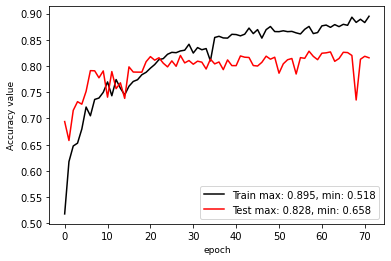

**** EPOCH 072 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.464277
accuracy: 0.885871
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.48  Average F1 score：65.58 
76.03 87.15 89.99 90.65 55.53 93.81 58.89 32.31 74.14 
64.50 71.42 92.98 33.71 19.68 93.10 61.53 50.54 85.01 
69.79 78.51 91.46 49.14 29.07 93.46 60.18 39.42 79.20 

learn rate: 0.001250
eval mean loss: 0.598614
eval accuracy: 0.814835
eval avg class acc: 0.636087


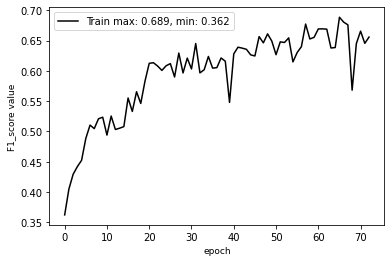

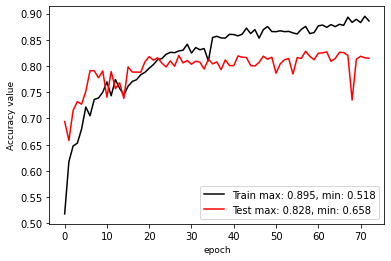

**** EPOCH 073 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.478252
accuracy: 0.894209
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.66  Average F1 score：66.44 
74.11 85.84 89.13 93.44 68.30 95.17 61.36 35.97 80.90 
65.83 75.79 93.61 34.57 15.06 92.56 60.12 60.56 82.20 
69.73 80.50 91.31 50.47 24.68 93.85 60.73 45.13 81.55 

learn rate: 0.001250
eval mean loss: 0.592187
eval accuracy: 0.826637
eval avg class acc: 0.644791


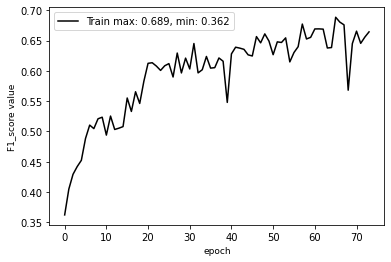

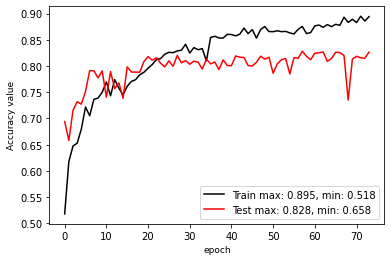

**** EPOCH 074 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.473659
accuracy: 0.885408
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.24  Average F1 score：66.18 
80.62 87.29 89.60 90.06 65.67 92.80 53.21 34.79 79.38 
60.33 74.41 94.05 38.83 16.83 93.68 64.11 53.30 80.46 
69.02 80.34 91.77 54.27 26.79 93.24 58.15 42.10 79.92 

learn rate: 0.001250
eval mean loss: 0.586635
eval accuracy: 0.822430
eval avg class acc: 0.640008


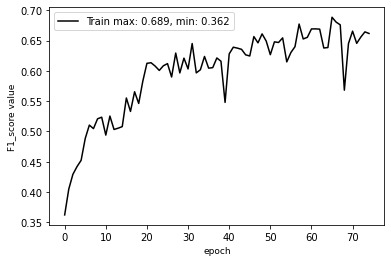

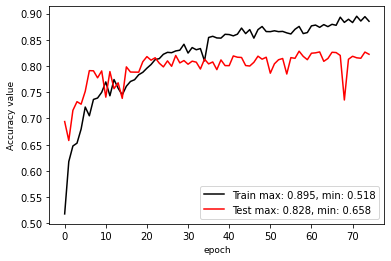

**** EPOCH 075 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.469691
accuracy: 0.881157
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：79.94  Average F1 score：62.02 
70.97 85.79 91.22 90.64 54.35 95.52 54.77 32.49 65.86 
55.00 75.56 92.49 26.89 12.96 84.53 61.48 50.63 85.36 
61.97 80.36 91.85 41.47 20.93 89.69 57.94 39.58 74.35 

learn rate: 0.001250
eval mean loss: 0.646446
eval accuracy: 0.799381
eval avg class acc: 0.605453


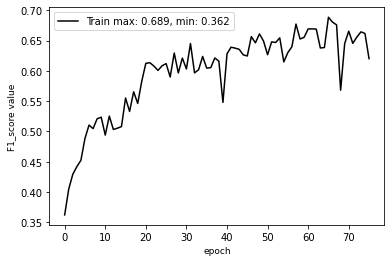

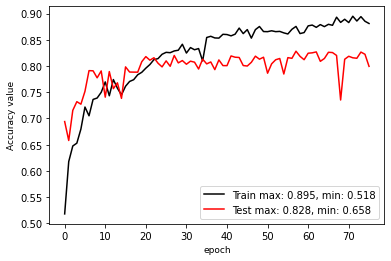

**** EPOCH 076 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.470634
accuracy: 0.880608
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.60  Average F1 score：66.38 
77.64 87.30 89.46 88.33 51.87 94.70 60.83 33.00 67.88 
63.67 73.87 93.92 54.50 14.59 91.30 59.01 39.87 87.98 
69.96 80.02 91.64 67.41 22.78 92.97 59.91 36.11 76.63 

learn rate: 0.001250
eval mean loss: 0.606737
eval accuracy: 0.815970
eval avg class acc: 0.643005


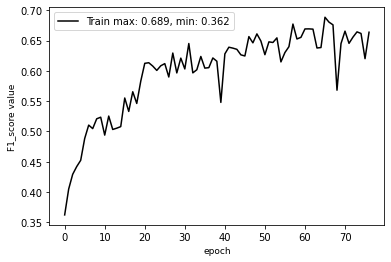

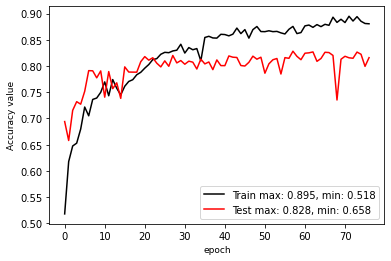

**** EPOCH 077 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.471425
accuracy: 0.888453
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.97  Average F1 score：68.25 
67.80 85.43 90.15 84.41 47.52 95.30 65.58 34.71 72.59 
80.00 76.15 92.23 55.64 22.22 90.84 54.04 49.27 86.16 
73.39 80.52 91.18 67.07 30.28 93.01 59.26 40.72 78.79 

learn rate: 0.001250
eval mean loss: 0.578418
eval accuracy: 0.819676
eval avg class acc: 0.673942


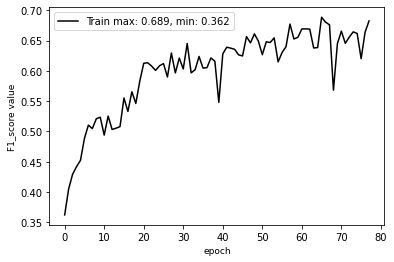

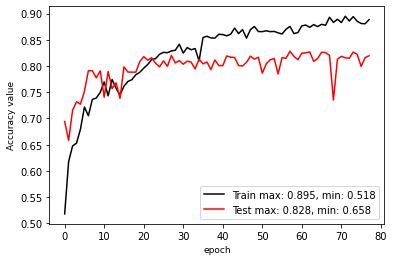

**** EPOCH 078 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.462557
accuracy: 0.873021
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.81  Average F1 score：66.79 
76.14 85.98 89.85 92.26 74.06 95.26 56.41 33.02 74.67 
69.67 73.34 92.80 46.63 13.23 92.32 64.42 50.71 85.15 
72.76 79.16 91.30 61.95 22.45 93.77 60.15 40.00 79.57 

learn rate: 0.001250
eval mean loss: 0.582146
eval accuracy: 0.818078
eval avg class acc: 0.653638


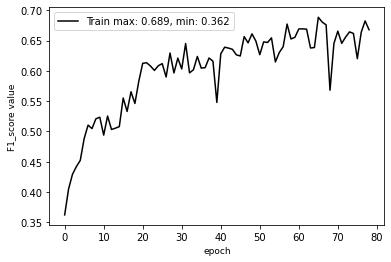

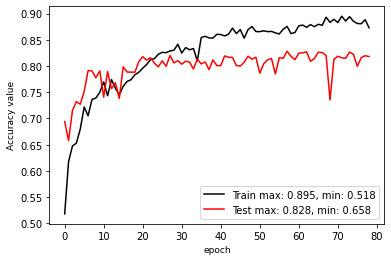

**** EPOCH 079 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.464077
accuracy: 0.894470
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.17  Average F1 score：66.57 
73.34 82.07 92.93 91.21 64.73 93.04 58.05 31.78 70.52 
79.33 76.04 88.24 50.94 12.88 93.52 62.83 39.56 86.63 
76.22 78.94 90.53 65.37 21.49 93.28 60.34 35.24 77.75 

learn rate: 0.001250
eval mean loss: 0.654207
eval accuracy: 0.811678
eval avg class acc: 0.655526


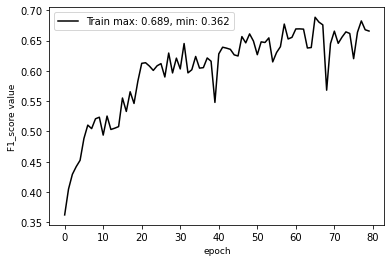

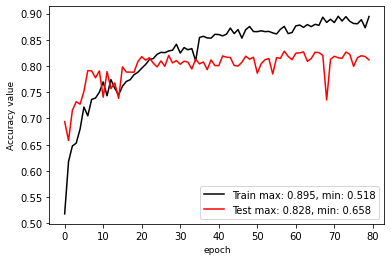

**** EPOCH 080 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.445964
accuracy: 0.894180
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.83  Average F1 score：65.02 
79.34 85.47 90.66 91.89 67.62 95.72 58.43 32.34 73.29 
67.83 76.13 92.66 28.43 14.97 90.79 63.60 48.40 85.82 
73.14 80.53 91.65 43.42 24.51 93.19 60.90 38.77 79.07 

learn rate: 0.000625
eval mean loss: 0.618204
eval accuracy: 0.818253
eval avg class acc: 0.631798


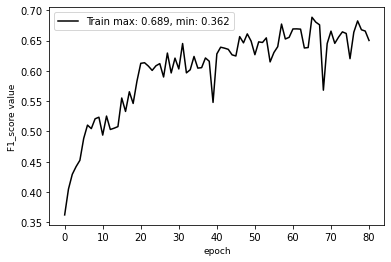

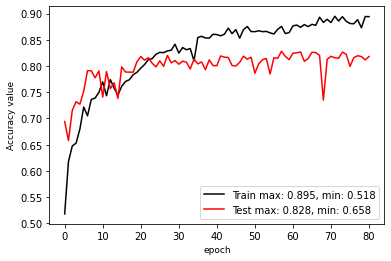

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 081 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.429422
accuracy: 0.892591
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.75  Average F1 score：65.77 
73.20 86.08 89.41 91.60 68.71 95.51 62.61 32.80 75.34 
77.83 73.63 93.46 33.82 12.40 91.62 59.85 54.50 84.45 
75.44 79.37 91.39 49.40 21.00 93.52 61.20 40.96 79.63 

learn rate: 0.000625
eval mean loss: 0.607303
eval accuracy: 0.817461
eval avg class acc: 0.646178


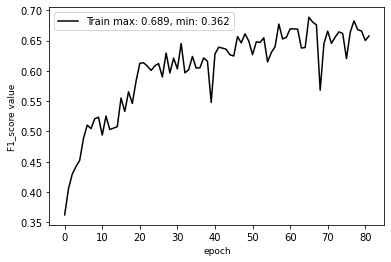

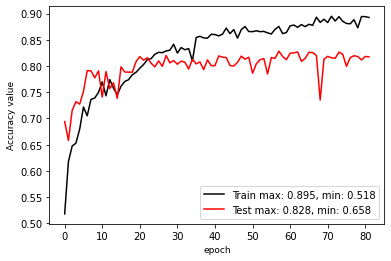

**** EPOCH 082 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.428138
accuracy: 0.890889
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.92  Average F1 score：65.69 
79.83 85.05 91.69 91.94 62.49 95.75 55.41 34.35 76.45 
64.00 76.42 91.66 31.98 15.20 90.48 65.54 58.23 83.35 
71.05 80.51 91.67 47.46 24.45 93.04 60.05 43.21 79.75 

learn rate: 0.000625
eval mean loss: 0.620847
eval accuracy: 0.819164
eval avg class acc: 0.640957


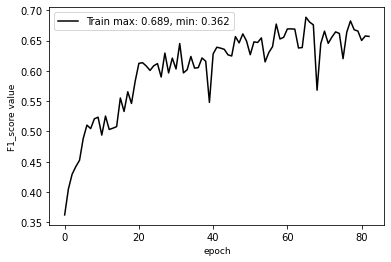

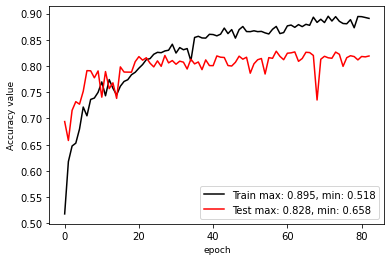

**** EPOCH 083 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.431359
accuracy: 0.882642
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.67  Average F1 score：66.34 
76.49 84.99 91.35 92.45 55.99 95.17 58.17 33.21 72.65 
72.67 76.20 91.98 37.32 17.19 90.58 62.21 49.40 85.09 
74.53 80.35 91.66 53.18 26.31 92.82 60.13 39.72 78.38 

learn rate: 0.000625
eval mean loss: 0.626991
eval accuracy: 0.816708
eval avg class acc: 0.647380


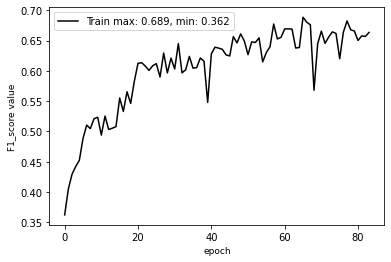

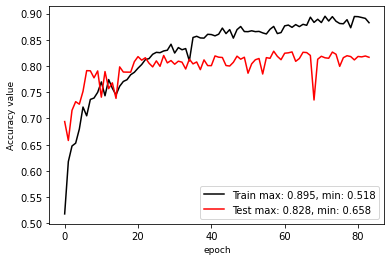

**** EPOCH 084 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.421321
accuracy: 0.890324
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.43  Average F1 score：66.30 
74.42 84.80 90.25 93.78 67.88 94.89 60.27 34.66 76.93 
75.17 78.28 92.85 34.14 14.04 91.80 62.12 51.53 82.63 
74.79 81.41 91.53 50.06 23.27 93.32 61.18 41.44 79.68 

learn rate: 0.000625
eval mean loss: 0.616728
eval accuracy: 0.824298
eval avg class acc: 0.647283


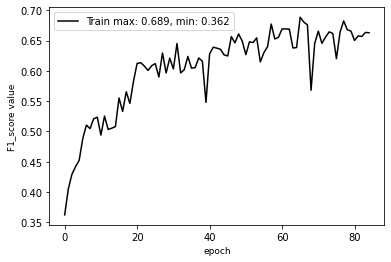

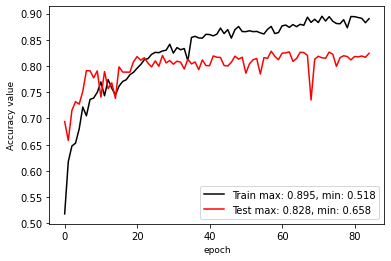

**** EPOCH 085 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.418657
accuracy: 0.896927
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：80.12  Average F1 score：64.03 
79.11 84.93 91.08 95.63 60.38 95.98 55.36 33.00 68.12 
62.50 74.04 91.44 32.50 13.41 86.08 59.67 55.04 86.22 
69.83 79.11 91.26 48.51 21.94 90.76 57.43 41.26 76.11 

learn rate: 0.000625
eval mean loss: 0.670550
eval accuracy: 0.801231
eval avg class acc: 0.623215


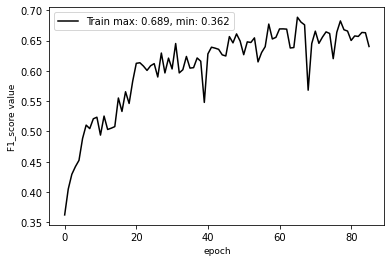

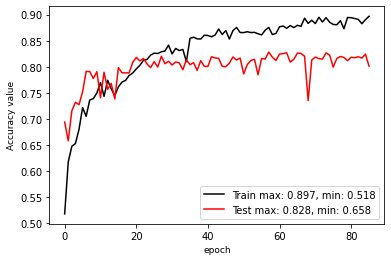

**** EPOCH 086 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.417360
accuracy: 0.893663
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.95  Average F1 score：66.34 
81.68 84.45 91.21 93.71 60.74 94.75 55.09 34.89 76.28 
61.67 77.27 91.62 37.38 18.05 91.36 63.25 54.15 82.01 
70.28 80.70 91.41 53.44 27.84 93.03 58.89 42.43 79.04 

learn rate: 0.000625
eval mean loss: 0.612148
eval accuracy: 0.819542
eval avg class acc: 0.640836


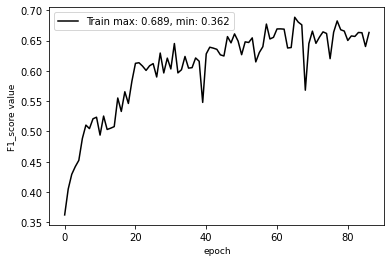

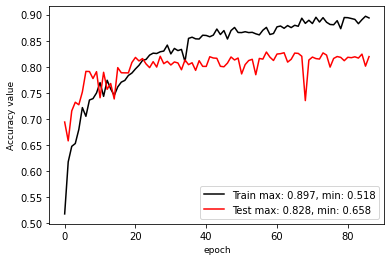

**** EPOCH 087 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.417687
accuracy: 0.894316
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.93  Average F1 score：66.78 
73.36 83.76 90.19 94.07 60.33 94.70 61.72 35.54 75.18 
72.50 77.34 91.24 41.53 15.06 91.65 59.55 53.08 83.06 
72.93 80.42 90.71 57.62 24.11 93.15 60.61 42.58 78.92 

learn rate: 0.000625
eval mean loss: 0.615202
eval accuracy: 0.819268
eval avg class acc: 0.650013


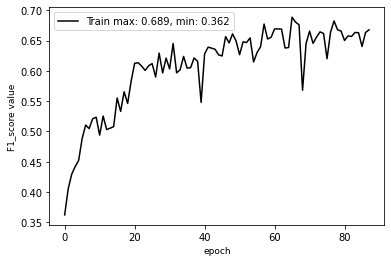

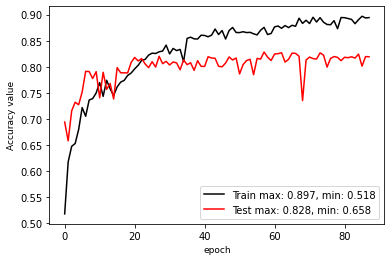

**** EPOCH 088 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.410422
accuracy: 0.884977
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.56  Average F1 score：66.08 
70.06 85.98 90.11 92.88 65.03 95.58 63.62 32.94 74.96 
78.00 74.37 92.97 35.54 14.63 90.75 57.61 58.16 82.73 
73.82 79.75 91.52 51.41 23.89 93.10 60.47 42.06 78.65 

learn rate: 0.000625
eval mean loss: 0.646710
eval accuracy: 0.815627
eval avg class acc: 0.649746


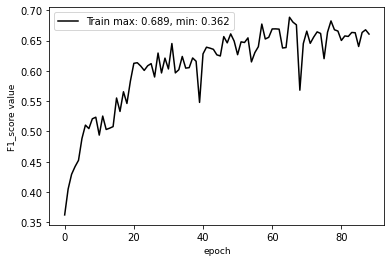

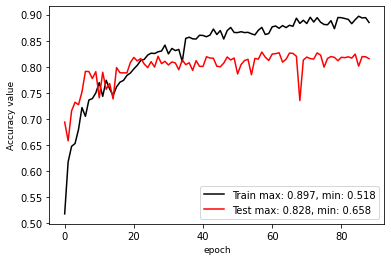

**** EPOCH 089 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.410425
accuracy: 0.895101
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.95  Average F1 score：66.39 
77.93 83.96 91.48 92.10 72.24 96.12 59.69 34.34 73.00 
55.33 78.21 91.51 44.66 16.41 89.48 61.93 51.40 85.55 
64.72 80.98 91.49 60.15 26.75 92.68 60.79 41.17 78.78 

learn rate: 0.000625
eval mean loss: 0.626201
eval accuracy: 0.819457
eval avg class acc: 0.638316


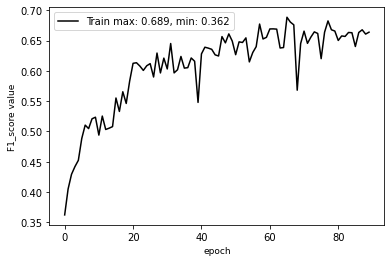

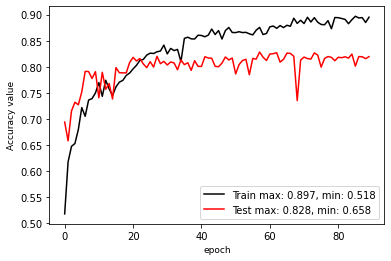

**** EPOCH 090 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.411997
accuracy: 0.898904
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.46  Average F1 score：66.17 
73.36 83.02 91.70 91.47 61.86 95.39 60.81 33.87 72.98 
74.33 77.73 89.59 43.39 10.86 90.31 61.17 52.18 85.12 
73.84 80.29 90.64 58.86 18.48 92.78 60.99 41.08 78.59 

learn rate: 0.000625
eval mean loss: 0.641396
eval accuracy: 0.814634
eval avg class acc: 0.649662


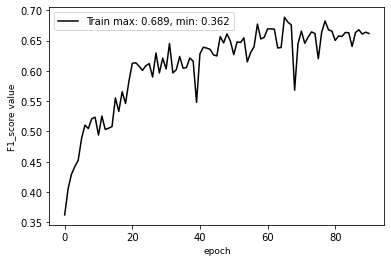

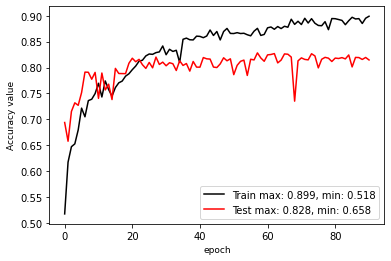

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 091 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.402656
accuracy: 0.893938
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.11  Average F1 score：67.16 
72.73 83.63 90.65 91.42 62.57 94.91 56.68 35.65 76.59 
70.67 76.98 90.84 44.82 15.86 91.98 64.67 52.02 84.33 
71.68 80.17 90.74 60.15 25.30 93.42 60.41 42.31 80.27 

learn rate: 0.000625
eval mean loss: 0.599472
eval accuracy: 0.821121
eval avg class acc: 0.657955


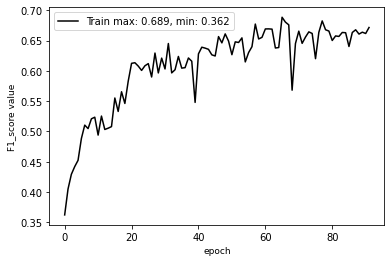

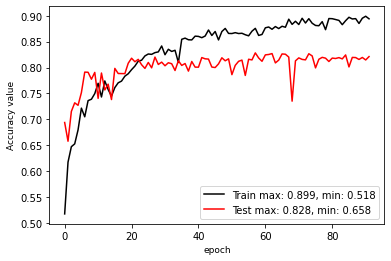

**** EPOCH 092 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.407624
accuracy: 0.880502
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.27  Average F1 score：65.71 
74.81 81.98 92.65 94.54 70.50 95.56 64.95 32.37 73.68 
66.83 76.87 88.24 40.64 12.56 91.31 55.03 54.03 86.25 
70.60 79.34 90.39 56.85 21.32 93.38 59.58 40.49 79.47 

learn rate: 0.000625
eval mean loss: 0.660886
eval accuracy: 0.812725
eval avg class acc: 0.635292


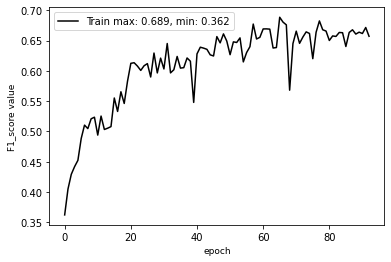

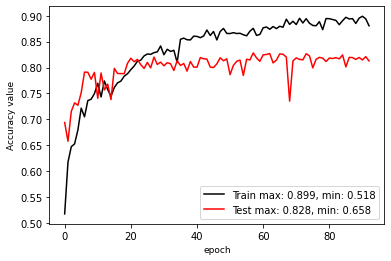

**** EPOCH 093 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.399142
accuracy: 0.903236
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.45  Average F1 score：66.53 
77.62 82.91 91.22 92.25 73.15 95.63 63.24 35.26 77.51 
64.17 78.33 90.54 35.63 16.26 92.43 59.53 54.86 84.49 
70.26 80.55 90.88 51.40 26.61 94.00 61.33 42.93 80.85 

learn rate: 0.000625
eval mean loss: 0.609623
eval accuracy: 0.824483
eval avg class acc: 0.640260


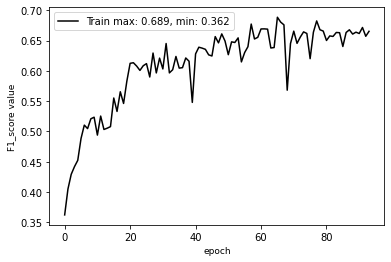

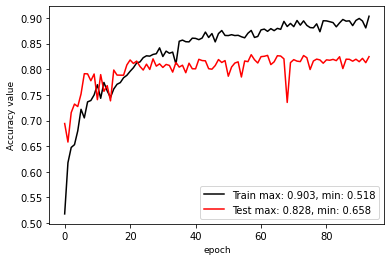

**** EPOCH 094 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.407238
accuracy: 0.899533
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.30  Average F1 score：66.30 
73.98 85.76 90.11 93.68 71.48 95.46 54.75 33.55 71.20 
69.67 74.39 92.58 47.98 12.40 89.54 64.09 49.62 85.95 
71.76 79.67 91.33 63.46 21.13 92.41 59.05 40.03 77.88 

learn rate: 0.000625
eval mean loss: 0.643082
eval accuracy: 0.812955
eval avg class acc: 0.651345


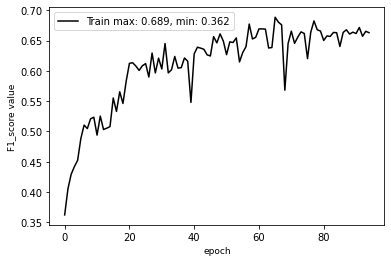

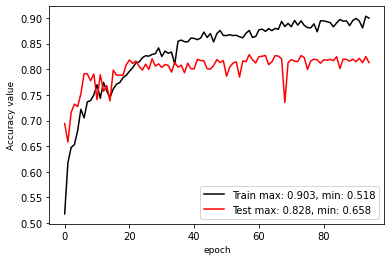

**** EPOCH 095 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.407746
accuracy: 0.888676
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.28  Average F1 score：67.10 
74.53 83.63 91.01 93.23 72.22 95.72 60.93 34.87 76.82 
72.17 78.21 91.26 49.06 10.58 91.80 58.11 55.71 83.03 
73.33 80.83 91.14 64.29 18.45 93.72 59.49 42.89 79.80 

learn rate: 0.000625
eval mean loss: 0.611489
eval accuracy: 0.822799
eval avg class acc: 0.655454


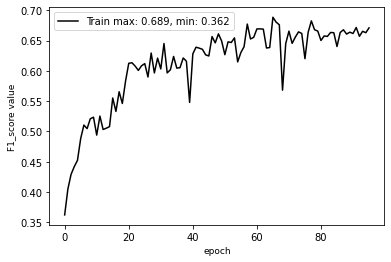

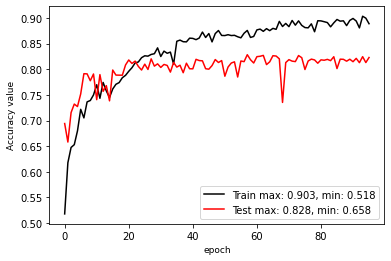

**** EPOCH 096 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.392052
accuracy: 0.897742
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.91  Average F1 score：67.51 
74.56 83.46 92.23 92.02 75.21 94.65 56.98 35.08 77.21 
71.33 76.14 89.82 49.78 13.33 92.21 61.83 58.75 83.28 
72.91 79.63 91.01 64.61 22.64 93.41 59.31 43.93 80.13 

learn rate: 0.000625
eval mean loss: 0.631656
eval accuracy: 0.819113
eval avg class acc: 0.662755


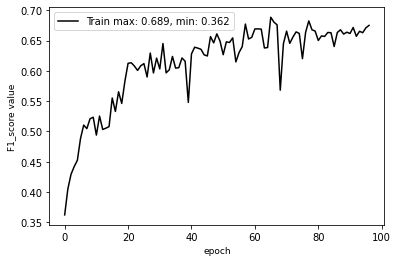

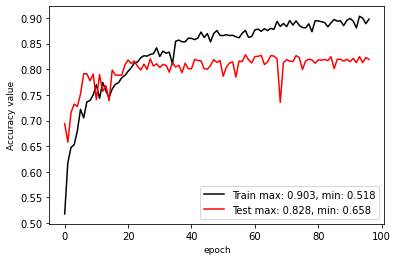

**** EPOCH 097 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.389542
accuracy: 0.890299
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.48  Average F1 score：68.15 
76.25 84.19 90.55 92.40 62.67 95.45 56.69 36.08 77.65 
63.67 77.39 91.88 50.81 18.23 91.57 66.88 53.18 83.59 
69.39 80.65 91.21 65.56 28.24 93.47 61.36 42.99 80.51 

learn rate: 0.000625
eval mean loss: 0.593647
eval accuracy: 0.824789
eval avg class acc: 0.663553


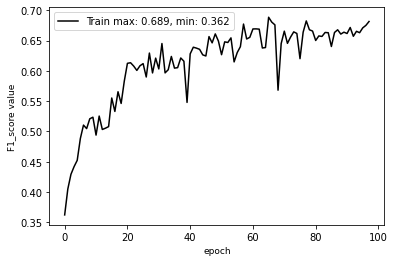

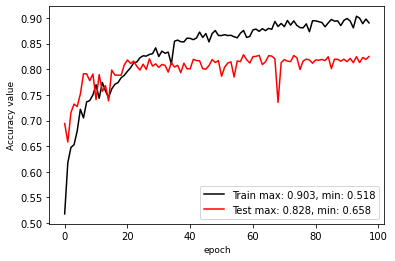

**** EPOCH 098 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.398639
accuracy: 0.900419
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.81  Average F1 score：64.40 
75.92 86.75 88.77 90.46 73.85 93.86 54.68 34.21 77.12 
72.00 73.39 93.56 25.84 12.33 93.28 63.99 53.18 82.17 
73.91 79.51 91.10 40.19 21.13 93.57 58.97 41.63 79.56 

learn rate: 0.000625
eval mean loss: 0.611297
eval accuracy: 0.818051
eval avg class acc: 0.633032


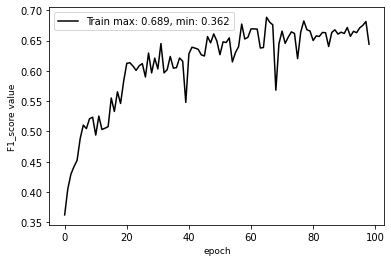

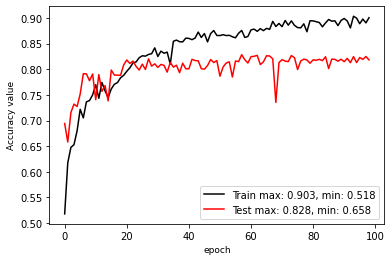

**** EPOCH 099 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.396575
accuracy: 0.893021
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.24  Average F1 score：67.80 
76.02 85.83 88.91 91.64 38.67 95.57 64.97 36.13 76.60 
65.00 75.38 93.42 48.76 20.34 91.27 58.02 55.31 83.81 
70.08 80.27 91.11 63.65 26.66 93.37 61.30 43.71 80.04 

learn rate: 0.000625
eval mean loss: 0.603593
eval accuracy: 0.822384
eval avg class acc: 0.657020


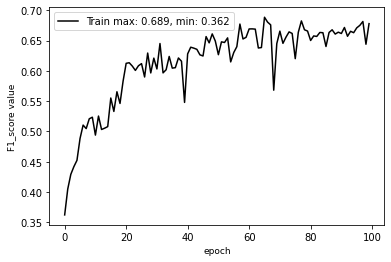

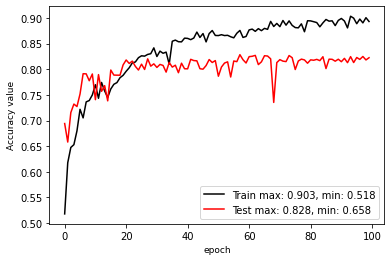

**** EPOCH 100 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.383921
accuracy: 0.886306
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.37  Average F1 score：67.55 
76.41 84.08 90.93 90.54 61.96 94.88 62.78 35.06 76.45 
63.17 76.42 90.92 47.73 16.48 92.84 62.55 52.38 85.52 
69.16 80.07 90.93 62.51 26.03 93.85 62.67 42.01 80.73 

learn rate: 0.000312
eval mean loss: 0.604770
eval accuracy: 0.823739
eval avg class acc: 0.653347


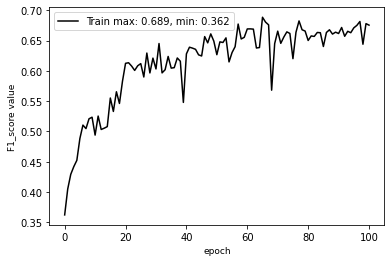

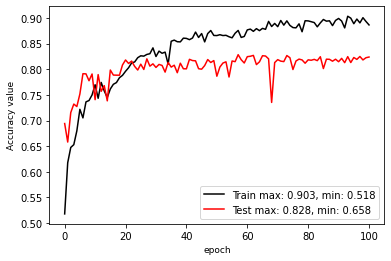

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 101 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.389025
accuracy: 0.894411
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.73  Average F1 score：65.66 
71.96 82.58 91.89 84.34 62.15 95.39 60.98 34.54 73.92 
68.00 76.98 89.07 36.17 15.33 91.87 60.80 51.59 86.70 
69.92 79.68 90.46 50.62 24.60 93.60 60.89 41.37 79.80 

learn rate: 0.000312
eval mean loss: 0.638935
eval accuracy: 0.817332
eval avg class acc: 0.640553


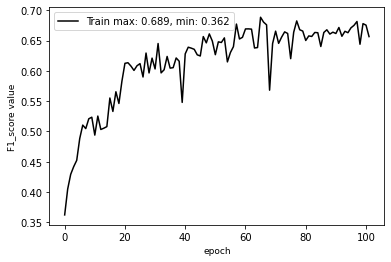

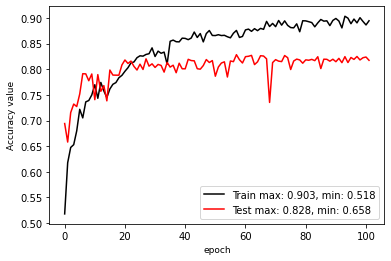

**** EPOCH 102 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.367007
accuracy: 0.903869
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.12  Average F1 score：66.52 
72.28 83.89 90.86 89.72 58.37 95.80 61.73 35.32 74.08 
70.83 78.02 91.29 41.91 14.34 90.76 58.97 52.08 85.68 
71.55 80.85 91.08 57.13 23.02 93.21 60.32 42.10 79.46 

learn rate: 0.000312
eval mean loss: 0.622123
eval accuracy: 0.821223
eval avg class acc: 0.648751


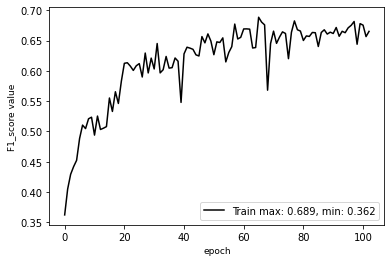

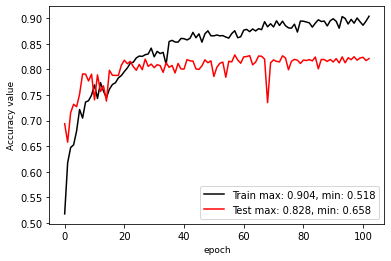

**** EPOCH 103 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.381575
accuracy: 0.889146
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.90  Average F1 score：64.78 
72.63 83.70 91.97 90.78 63.33 95.10 58.28 33.99 75.53 
65.00 77.27 90.28 30.02 13.54 91.73 63.46 53.15 84.89 
68.60 80.35 91.11 45.12 22.31 93.38 60.76 41.47 79.93 

learn rate: 0.000312
eval mean loss: 0.638262
eval accuracy: 0.819006
eval avg class acc: 0.632582


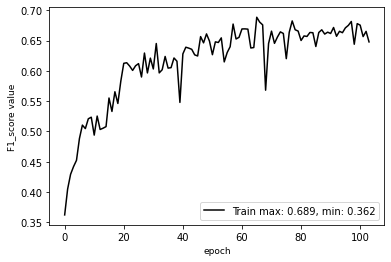

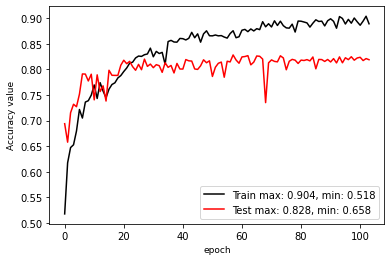

**** EPOCH 104 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.369399
accuracy: 0.897403
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.31  Average F1 score：65.91 
73.21 86.08 89.60 91.35 71.85 94.49 60.13 34.31 76.95 
64.67 74.65 93.03 38.43 13.14 93.30 62.00 52.53 84.52 
68.67 79.96 91.28 54.10 22.21 93.89 61.05 41.51 80.56 

learn rate: 0.000312
eval mean loss: 0.623773
eval accuracy: 0.823142
eval avg class acc: 0.640288


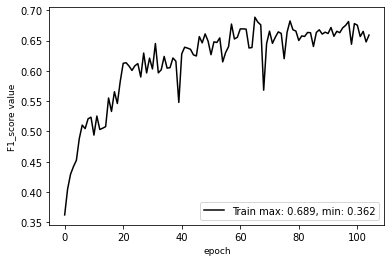

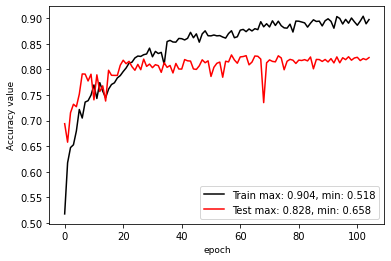

**** EPOCH 105 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.366880
accuracy: 0.904205
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.61  Average F1 score：65.41 
72.63 83.76 91.27 90.53 62.04 95.75 58.02 35.32 71.23 
66.33 77.77 90.66 35.84 15.59 89.32 60.62 49.72 87.36 
69.34 80.65 90.97 51.35 24.92 92.42 59.29 41.30 78.48 

learn rate: 0.000312
eval mean loss: 0.627461
eval accuracy: 0.816135
eval avg class acc: 0.636914


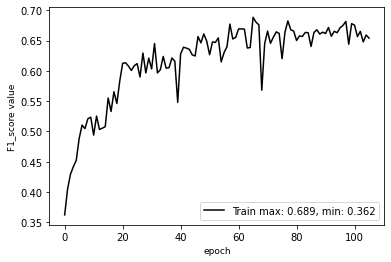

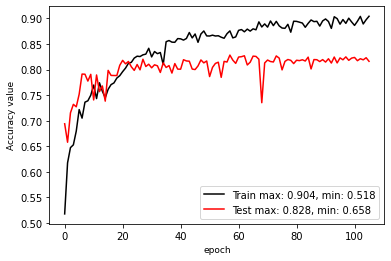

**** EPOCH 106 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.376032
accuracy: 0.887453
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.70  Average F1 score：65.14 
69.50 84.99 89.89 90.32 62.91 94.92 63.35 34.07 75.89 
73.67 75.11 91.88 28.43 15.40 91.65 58.36 56.64 83.63 
71.52 79.75 90.88 43.24 24.74 93.26 60.75 42.55 79.57 

learn rate: 0.000312
eval mean loss: 0.631966
eval accuracy: 0.816995
eval avg class acc: 0.638628


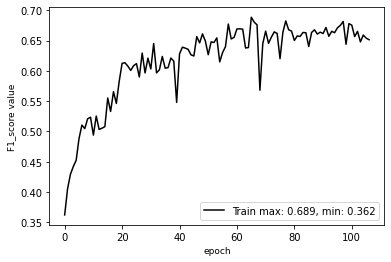

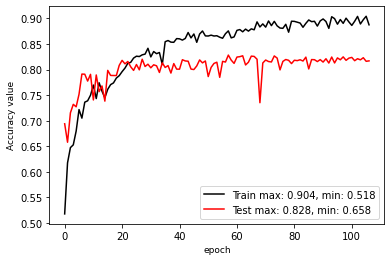

**** EPOCH 107 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.372211
accuracy: 0.900525
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.08  Average F1 score：67.66 
72.92 85.53 89.84 88.47 62.51 94.66 63.78 34.01 75.97 
70.00 74.28 92.31 49.46 17.54 92.96 58.05 53.24 84.53 
71.43 79.51 91.06 63.45 27.40 93.80 60.78 41.51 80.02 

learn rate: 0.000312
eval mean loss: 0.621956
eval accuracy: 0.820805
eval avg class acc: 0.658189


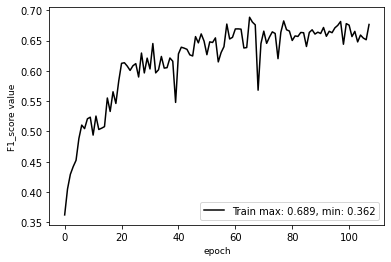

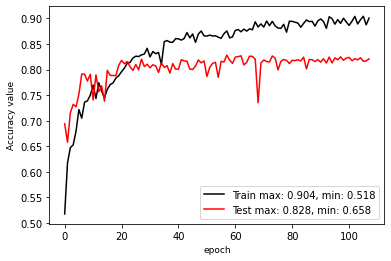

**** EPOCH 108 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.370964
accuracy: 0.894019
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.59  Average F1 score：65.04 
74.95 86.04 90.62 84.10 71.80 95.76 54.68 33.85 73.53 
64.83 75.22 92.68 36.95 12.00 89.95 64.01 54.63 84.24 
69.53 80.26 91.63 51.34 20.57 92.77 58.97 41.80 78.52 

learn rate: 0.000312
eval mean loss: 0.654562
eval accuracy: 0.815868
eval avg class acc: 0.638338


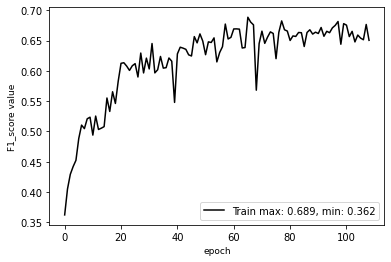

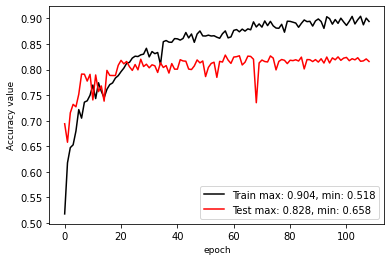

**** EPOCH 109 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.376905
accuracy: 0.897466
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.56  Average F1 score：67.45 
68.71 84.44 91.27 91.46 72.01 95.09 62.43 37.21 72.12 
74.67 77.85 91.59 50.81 13.14 91.80 59.25 48.71 87.66 
71.57 81.01 91.43 65.33 22.22 93.41 60.80 42.19 79.14 

learn rate: 0.000312
eval mean loss: 0.641671
eval accuracy: 0.825614
eval avg class acc: 0.661633


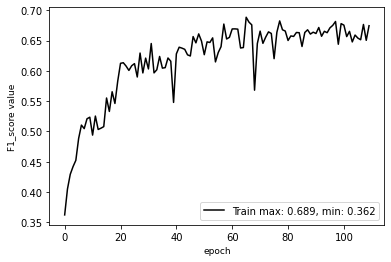

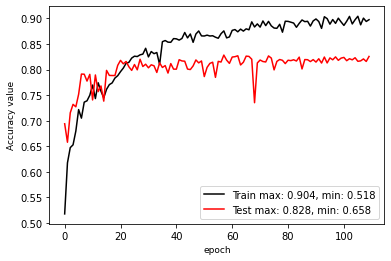

**** EPOCH 110 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.371953
accuracy: 0.902731
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.18  Average F1 score：66.53 
69.38 85.03 90.66 90.58 61.90 94.94 68.30 35.05 73.91 
71.00 75.91 91.99 38.92 16.86 92.09 54.64 53.87 85.88 
70.18 80.21 91.32 54.44 26.50 93.50 60.71 42.47 79.44 

learn rate: 0.000312
eval mean loss: 0.637829
eval accuracy: 0.821789
eval avg class acc: 0.645727


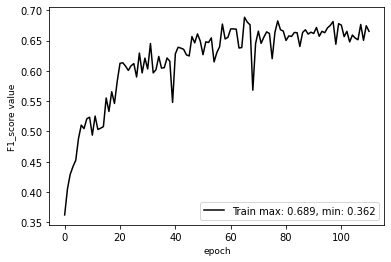

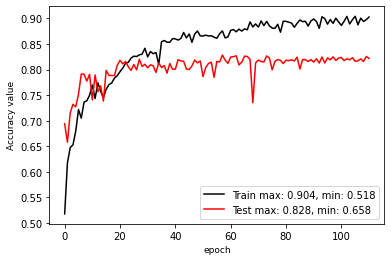

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 111 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.361334
accuracy: 0.900883
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.96  Average F1 score：65.26 
71.85 83.65 91.10 91.99 70.18 95.46 60.30 35.30 74.78 
64.67 77.19 90.76 34.98 12.30 91.35 60.85 54.66 85.04 
68.07 80.29 90.93 50.68 20.93 93.36 60.57 42.89 79.58 

learn rate: 0.000312
eval mean loss: 0.637302
eval accuracy: 0.819637
eval avg class acc: 0.635334


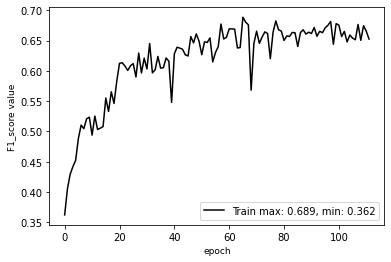

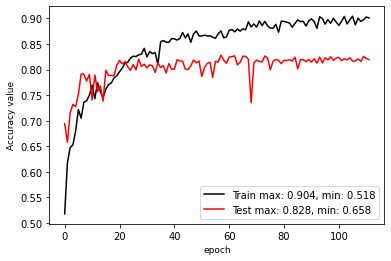

**** EPOCH 112 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.361920
accuracy: 0.896662
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.54  Average F1 score：66.17 
72.73 84.08 90.51 92.03 75.93 95.52 60.61 34.65 71.32 
72.00 76.89 91.05 43.93 12.07 90.07 59.48 50.44 85.95 
72.36 80.32 90.78 59.47 20.83 92.71 60.04 41.08 77.95 

learn rate: 0.000312
eval mean loss: 0.641691
eval accuracy: 0.815411
eval avg class acc: 0.646544


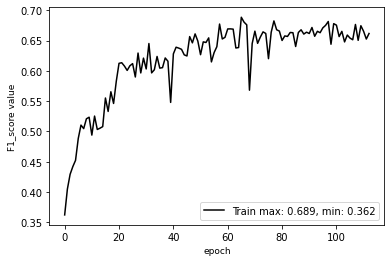

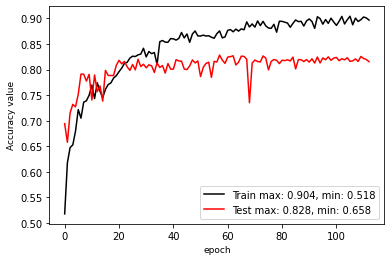

**** EPOCH 113 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.372616
accuracy: 0.889766
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.85  Average F1 score：65.79 
69.57 85.35 89.87 90.81 69.69 95.16 62.27 33.86 76.30 
70.50 74.13 92.19 35.71 13.23 92.06 62.10 56.26 84.41 
70.03 79.35 91.01 51.26 22.24 93.58 62.18 42.28 80.15 

learn rate: 0.000312
eval mean loss: 0.636766
eval accuracy: 0.818510
eval avg class acc: 0.645093


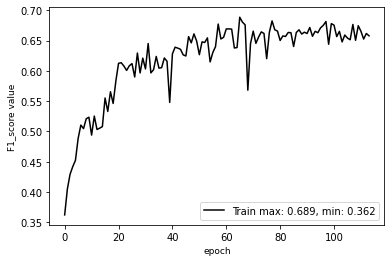

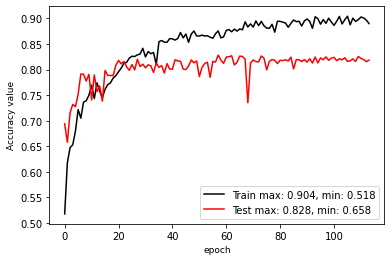

**** EPOCH 114 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.375715
accuracy: 0.904654
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.75  Average F1 score：67.79 
69.08 85.59 88.58 91.01 72.81 93.24 59.38 37.39 76.30 
79.67 75.74 93.39 51.86 13.20 94.26 63.29 45.10 85.23 
73.99 80.36 90.92 66.07 22.35 93.75 61.28 40.89 80.52 

learn rate: 0.000312
eval mean loss: 0.604727
eval accuracy: 0.827458
eval avg class acc: 0.668614


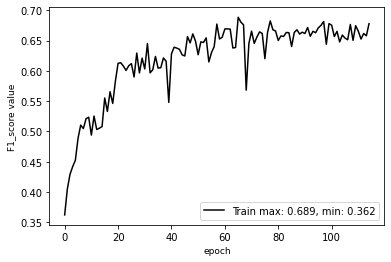

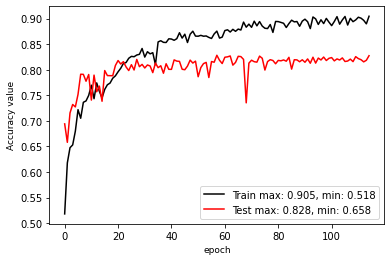

**** EPOCH 115 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.364421
accuracy: 0.895134
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.70  Average F1 score：67.12 
72.53 84.66 90.43 86.31 63.25 95.22 59.10 34.29 75.33 
70.83 74.74 91.43 47.11 16.24 91.33 61.22 55.05 84.59 
71.67 79.39 90.92 60.96 25.84 93.24 60.14 42.26 79.69 

learn rate: 0.000312
eval mean loss: 0.627757
eval accuracy: 0.817012
eval avg class acc: 0.658381


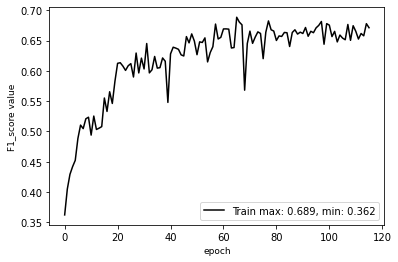

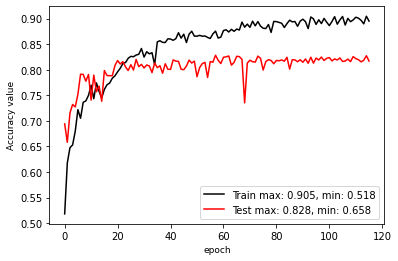

**** EPOCH 116 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.351927
accuracy: 0.899605
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.17  Average F1 score：67.34 
70.85 85.22 90.45 85.30 54.64 95.13 61.56 35.60 72.93 
70.50 75.41 92.13 46.47 19.77 92.03 60.09 49.25 86.63 
70.68 80.02 91.28 60.16 29.03 93.55 60.82 41.32 79.19 

learn rate: 0.000312
eval mean loss: 0.637003
eval accuracy: 0.821672
eval avg class acc: 0.658090


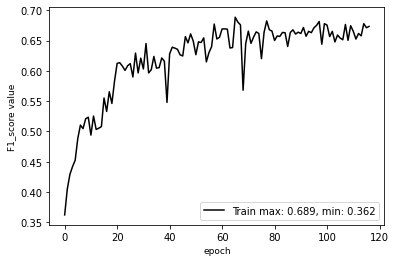

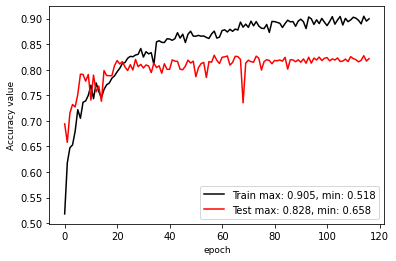

**** EPOCH 117 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.359512
accuracy: 0.900184
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.45  Average F1 score：65.92 
71.21 86.02 89.31 85.12 59.65 94.64 66.14 33.76 69.36 
69.67 73.64 92.77 45.20 15.87 91.69 53.23 45.74 87.57 
70.43 79.35 91.01 59.05 25.07 93.14 58.99 38.85 77.41 

learn rate: 0.000312
eval mean loss: 0.655263
eval accuracy: 0.814537
eval avg class acc: 0.639319


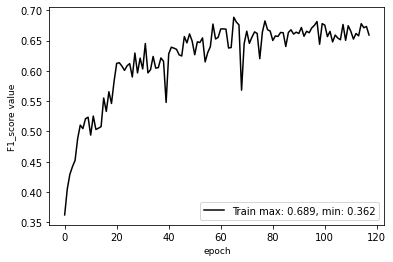

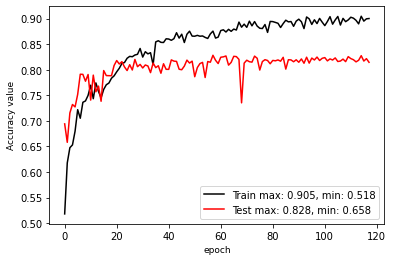

**** EPOCH 118 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.365881
accuracy: 0.882281
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.10  Average F1 score：66.92 
69.63 84.62 89.55 92.07 55.02 94.16 60.20 35.80 73.79 
69.17 75.67 92.07 50.76 14.40 93.08 61.33 46.51 85.12 
69.40 79.90 90.79 65.44 22.83 93.62 60.76 40.46 79.05 

learn rate: 0.000312
eval mean loss: 0.616799
eval accuracy: 0.821026
eval avg class acc: 0.653462


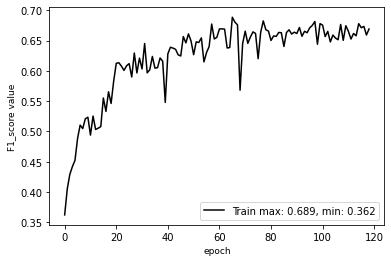

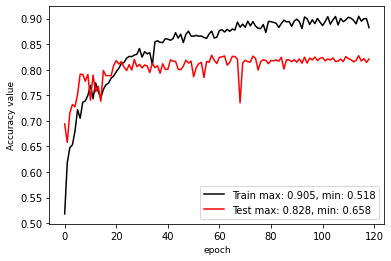

**** EPOCH 119 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.355228
accuracy: 0.904453
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.66  Average F1 score：66.50 
72.09 84.26 90.56 90.58 59.42 94.56 62.29 34.06 74.11 
67.17 75.35 91.17 48.25 13.69 91.86 57.46 52.38 84.86 
69.54 79.56 90.86 62.96 22.25 93.19 59.77 41.28 79.12 

learn rate: 0.000312
eval mean loss: 0.643199
eval accuracy: 0.816555
eval avg class acc: 0.646872


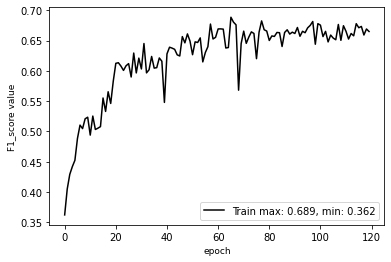

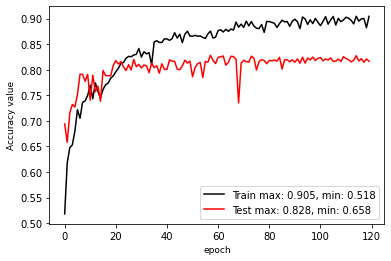

**** EPOCH 120 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.369152
accuracy: 0.893877
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.91  Average F1 score：67.45 
68.82 83.67 90.76 92.25 66.38 94.15 62.57 34.58 76.50 
74.67 76.19 90.54 50.76 14.39 92.59 58.31 54.07 83.67 
71.62 79.76 90.65 65.48 23.65 93.37 60.37 42.18 79.93 

learn rate: 0.000156
eval mean loss: 0.630739
eval accuracy: 0.819091
eval avg class acc: 0.661328


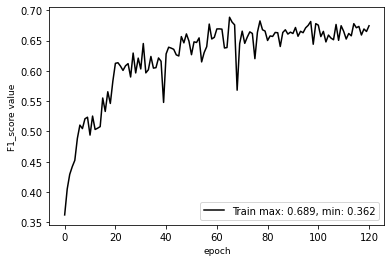

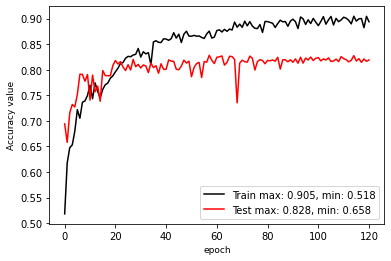

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 121 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.352773
accuracy: 0.893287
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.23  Average F1 score：66.80 
75.64 84.61 90.40 89.48 65.01 94.48 59.57 35.79 75.12 
59.50 76.52 91.77 53.24 12.34 92.15 61.25 51.37 84.95 
66.60 80.36 91.08 66.76 20.75 93.30 60.40 42.18 79.73 

learn rate: 0.000156
eval mean loss: 0.633600
eval accuracy: 0.822253
eval avg class acc: 0.647883


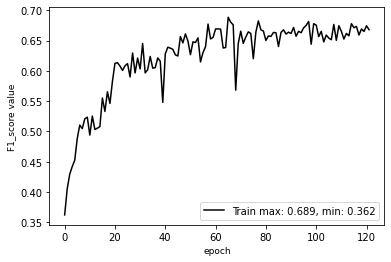

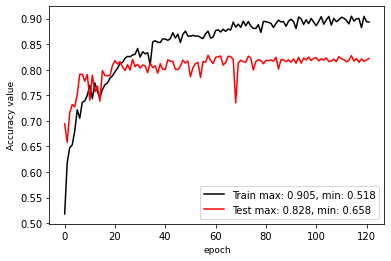

**** EPOCH 122 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.348895
accuracy: 0.905584
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.23  Average F1 score：66.77 
73.16 83.09 91.35 92.64 63.87 94.75 58.48 35.79 75.96 
64.50 77.64 90.03 48.87 12.19 92.67 63.30 51.33 85.05 
68.56 80.27 90.69 63.98 20.48 93.70 60.80 42.17 80.25 

learn rate: 0.000156
eval mean loss: 0.621604
eval accuracy: 0.822287
eval avg class acc: 0.650633


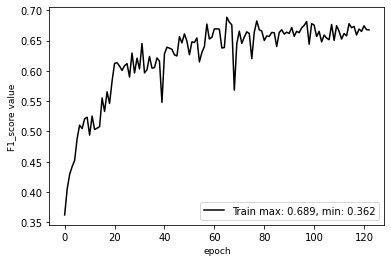

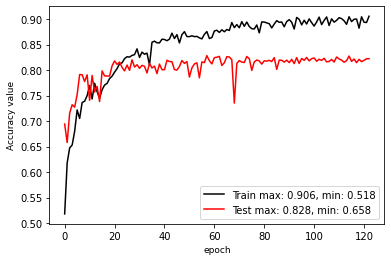

**** EPOCH 123 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.361730
accuracy: 0.888042
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.73  Average F1 score：66.96 
73.45 83.15 91.18 91.61 60.52 95.57 59.24 34.95 73.90 
67.33 77.36 90.15 50.08 13.80 90.75 61.29 52.62 84.90 
70.26 80.15 90.66 64.76 22.47 93.10 60.24 42.00 79.02 

learn rate: 0.000156
eval mean loss: 0.639825
eval accuracy: 0.817291
eval avg class acc: 0.653625


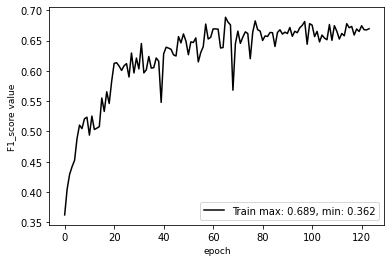

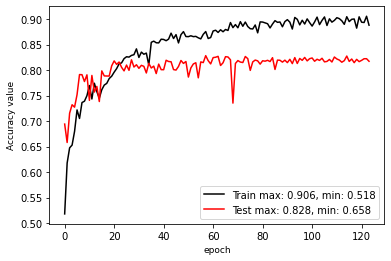

**** EPOCH 124 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.349459
accuracy: 0.903145
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.92  Average F1 score：66.75 
73.59 83.65 90.73 92.22 69.17 94.76 60.36 34.97 75.06 
63.17 75.94 90.44 50.49 12.54 92.44 61.02 52.46 85.29 
67.98 79.61 90.59 65.25 21.24 93.58 60.69 41.96 79.85 

learn rate: 0.000156
eval mean loss: 0.637008
eval accuracy: 0.819202
eval avg class acc: 0.648651


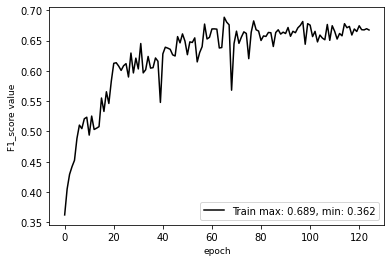

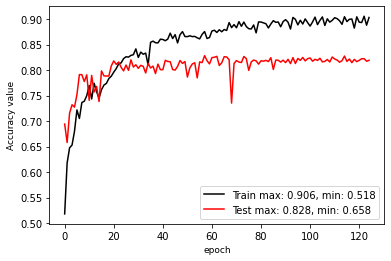

**** EPOCH 125 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.344891
accuracy: 0.902460
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：67.69 
70.83 84.78 90.68 92.01 60.21 95.07 62.54 35.16 73.82 
70.00 76.24 91.76 53.45 15.21 91.96 59.44 51.05 85.69 
70.41 80.28 91.22 67.62 24.29 93.49 60.95 41.64 79.31 

learn rate: 0.000156
eval mean loss: 0.626513
eval accuracy: 0.822042
eval avg class acc: 0.660903


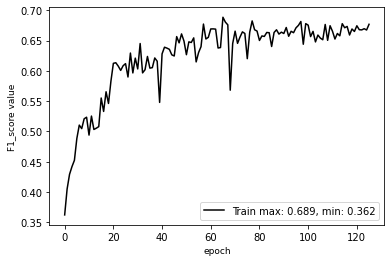

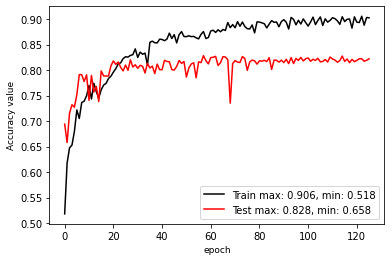

**** EPOCH 126 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.348442
accuracy: 0.908930
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.94  Average F1 score：66.51 
72.24 84.40 90.87 92.48 62.48 95.29 59.28 34.89 73.23 
67.67 75.94 91.39 47.11 13.02 91.66 59.96 50.91 86.30 
69.88 79.95 91.13 62.43 21.54 93.44 59.62 41.41 79.23 

learn rate: 0.000156
eval mean loss: 0.646585
eval accuracy: 0.819443
eval avg class acc: 0.648841


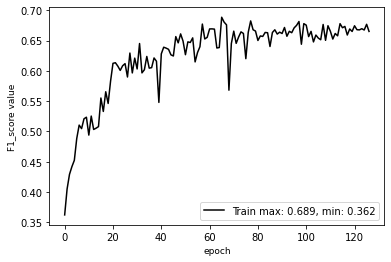

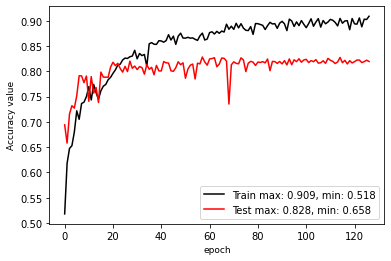

**** EPOCH 127 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.344094
accuracy: 0.902862
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.78  Average F1 score：66.20 
72.51 82.34 91.66 93.62 68.68 95.68 60.43 34.83 73.62 
65.50 78.26 89.46 43.53 13.47 90.90 59.87 51.37 86.00 
68.83 80.25 90.55 59.43 22.53 93.23 60.15 41.51 79.33 

learn rate: 0.000156
eval mean loss: 0.647058
eval accuracy: 0.817806
eval avg class acc: 0.642622


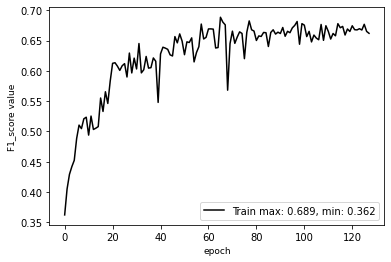

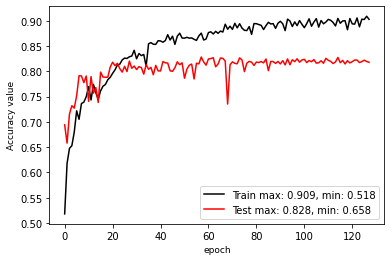

**** EPOCH 128 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.351988
accuracy: 0.895345
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.93  Average F1 score：66.99 
72.01 84.04 90.71 90.28 70.01 95.06 60.86 34.59 74.08 
62.17 75.87 90.93 53.34 14.19 92.03 60.52 51.19 85.69 
66.73 79.75 90.82 67.06 23.59 93.52 60.69 41.28 79.46 

learn rate: 0.000156
eval mean loss: 0.639324
eval accuracy: 0.819326
eval avg class acc: 0.651029


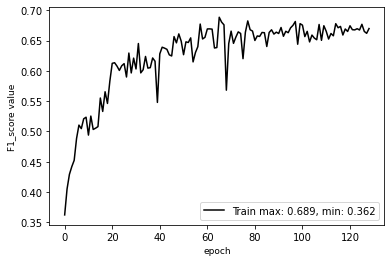

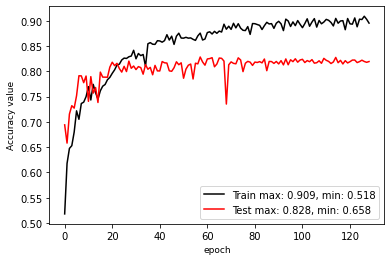

**** EPOCH 129 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.356187
accuracy: 0.907657
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.16  Average F1 score：67.15 
70.65 84.89 90.51 90.95 60.51 94.88 62.55 35.01 73.79 
69.00 75.80 91.94 51.48 13.50 92.13 59.69 50.55 86.05 
69.81 80.09 91.22 65.75 22.08 93.48 61.09 41.37 79.45 

learn rate: 0.000156
eval mean loss: 0.638789
eval accuracy: 0.821590
eval avg class acc: 0.655718


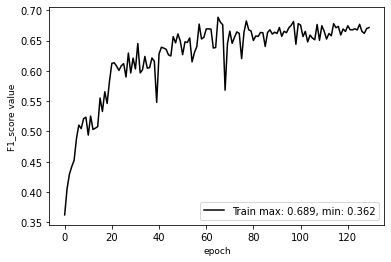

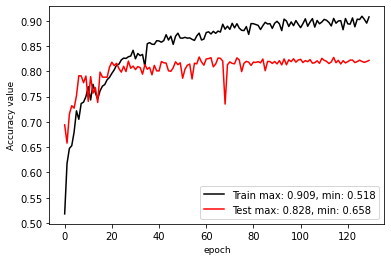

**** EPOCH 130 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.349202
accuracy: 0.903818
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.89  Average F1 score：66.09 
69.23 85.69 89.82 92.24 56.21 94.87 62.96 34.17 75.52 
72.00 74.29 92.54 41.99 11.90 91.99 58.46 55.23 84.87 
70.59 79.59 91.16 57.71 19.64 93.41 60.62 42.22 79.92 

learn rate: 0.000156
eval mean loss: 0.651469
eval accuracy: 0.818925
eval avg class acc: 0.648067


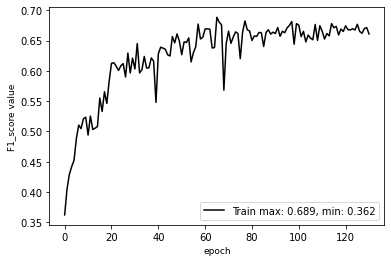

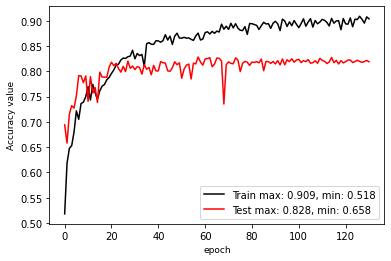

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 131 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.347515
accuracy: 0.903384
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.24  Average F1 score：67.31 
71.55 84.64 90.47 91.32 59.32 94.48 63.87 34.94 74.10 
67.50 75.81 91.69 52.51 14.44 92.85 58.57 48.86 86.49 
69.47 79.98 91.08 66.68 23.23 93.66 61.11 40.75 79.82 

learn rate: 0.000156
eval mean loss: 0.633983
eval accuracy: 0.822423
eval avg class acc: 0.654144


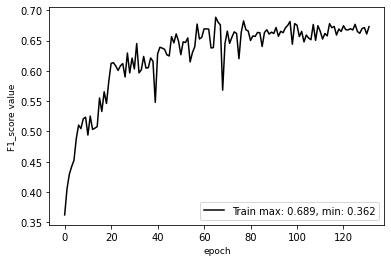

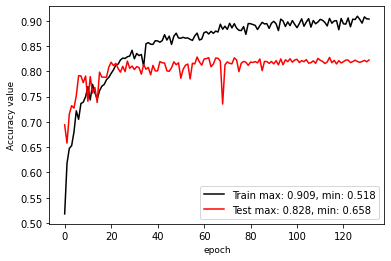

**** EPOCH 132 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.343453
accuracy: 0.901143
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.95  Average F1 score：66.02 
67.62 84.81 90.40 87.96 54.82 94.95 64.37 35.85 72.31 
71.00 76.35 91.86 42.15 14.56 91.10 55.00 51.49 86.68 
69.27 80.36 91.12 56.99 23.01 92.99 59.32 42.27 78.85 

learn rate: 0.000156
eval mean loss: 0.644432
eval accuracy: 0.819489
eval avg class acc: 0.644663


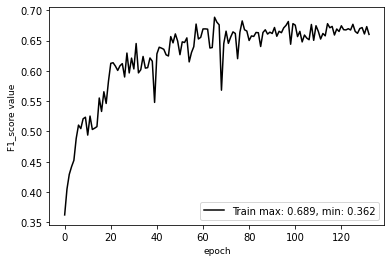

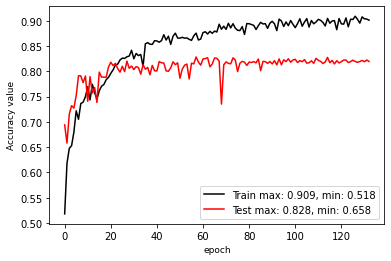

**** EPOCH 133 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.351037
accuracy: 0.903537
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.06  Average F1 score：67.18 
67.65 84.61 90.52 89.76 59.93 95.33 60.91 35.95 72.80 
72.50 76.32 91.69 50.84 15.09 90.95 58.70 50.86 87.02 
69.99 80.25 91.10 64.91 24.11 93.09 59.79 42.12 79.28 

learn rate: 0.000156
eval mean loss: 0.644499
eval accuracy: 0.820567
eval avg class acc: 0.659965


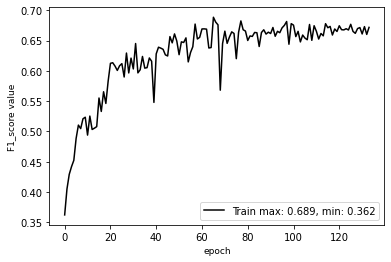

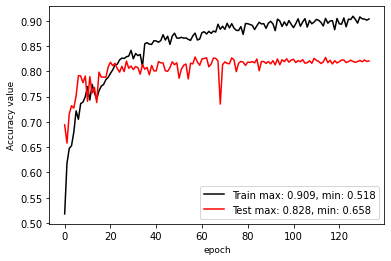

**** EPOCH 134 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.349726
accuracy: 0.905231
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.95  Average F1 score：66.83 
69.60 84.87 90.24 90.24 67.05 95.49 60.03 35.01 75.51 
72.50 75.94 91.83 46.90 13.33 91.02 58.28 56.63 84.42 
71.02 80.16 91.03 61.72 22.23 93.20 59.14 43.27 79.72 

learn rate: 0.000156
eval mean loss: 0.637780
eval accuracy: 0.819467
eval avg class acc: 0.656495


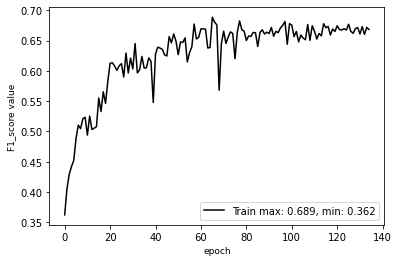

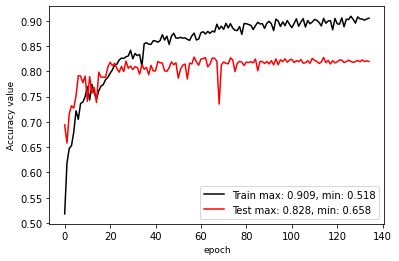

**** EPOCH 135 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.347394
accuracy: 0.897696
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.46  Average F1 score：67.44 
70.97 84.80 90.17 91.91 69.03 95.20 60.42 36.36 75.32 
66.00 77.04 92.30 52.37 13.76 91.58 60.69 52.68 85.25 
68.39 80.74 91.22 66.72 22.94 93.36 60.56 43.02 79.98 

learn rate: 0.000156
eval mean loss: 0.624679
eval accuracy: 0.824619
eval avg class acc: 0.657426


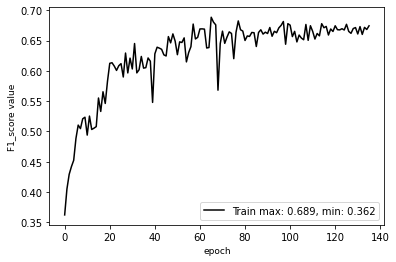

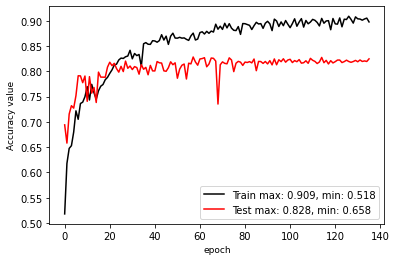

**** EPOCH 136 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.342009
accuracy: 0.895577
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.10  Average F1 score：67.61 
70.34 83.80 90.97 93.25 56.98 95.51 62.40 35.59 75.02 
66.00 77.37 91.02 54.77 14.96 91.07 58.48 54.95 84.46 
68.10 80.46 91.00 69.01 23.69 93.24 60.38 43.20 79.46 

learn rate: 0.000156
eval mean loss: 0.631997
eval accuracy: 0.821034
eval avg class acc: 0.658986


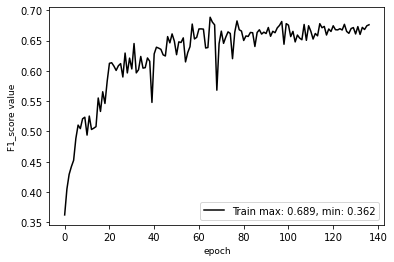

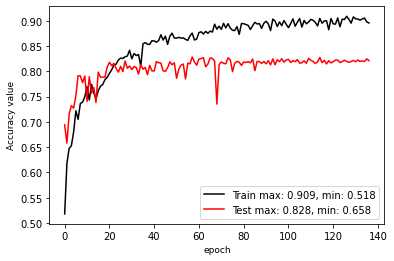

**** EPOCH 137 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.346793
accuracy: 0.900761
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.59  Average F1 score：67.20 
68.25 83.83 90.65 93.11 54.99 94.49 60.56 37.42 76.79 
72.00 78.44 91.11 47.01 13.96 92.60 60.29 52.80 84.14 
70.07 81.05 90.88 62.47 22.27 93.53 60.42 43.80 80.30 

learn rate: 0.000156
eval mean loss: 0.616555
eval accuracy: 0.825862
eval avg class acc: 0.658170


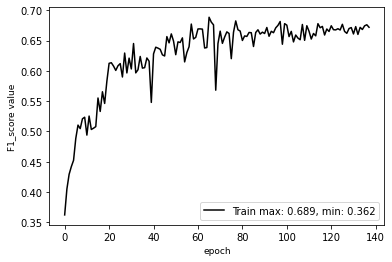

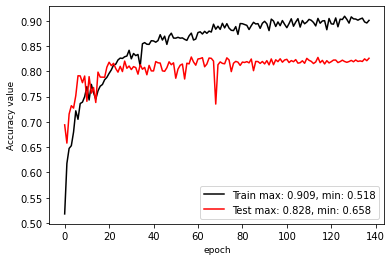

**** EPOCH 138 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.339370
accuracy: 0.901138
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.85  Average F1 score：64.88 
70.09 83.98 90.36 93.11 67.43 95.04 59.46 34.71 75.39 
66.00 76.21 91.04 33.87 11.55 91.88 61.75 53.09 85.07 
67.98 79.90 90.70 49.67 19.72 93.43 60.58 41.98 79.94 

learn rate: 0.000156
eval mean loss: 0.638019
eval accuracy: 0.818503
eval avg class acc: 0.633838


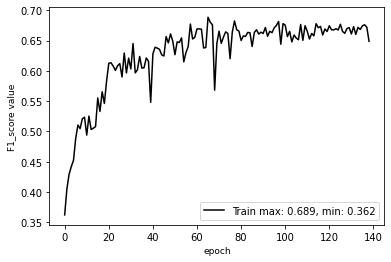

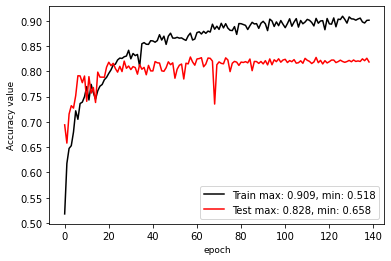

**** EPOCH 139 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.346446
accuracy: 0.889112
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.81  Average F1 score：66.41 
68.71 84.51 90.55 93.78 63.84 95.11 62.00 34.16 73.79 
72.83 75.57 91.35 46.33 11.65 91.66 59.04 52.22 85.79 
70.71 79.79 90.95 62.02 19.71 93.35 60.49 41.30 79.34 

learn rate: 0.000156
eval mean loss: 0.649114
eval accuracy: 0.818100
eval avg class acc: 0.651618


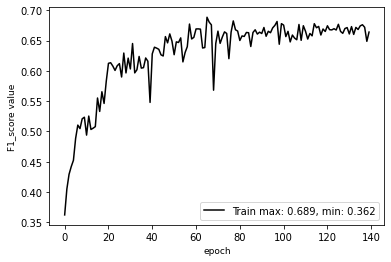

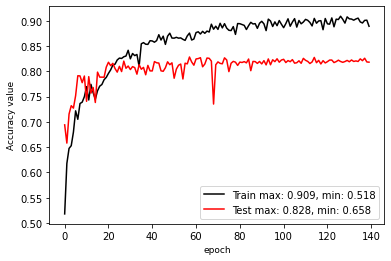

**** EPOCH 140 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.339518
accuracy: 0.900093
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.93  Average F1 score：66.48 
68.48 84.54 90.24 93.07 62.05 95.20 61.71 35.32 74.13 
67.00 75.72 91.49 48.57 12.21 91.27 58.59 53.57 86.25 
67.73 79.88 90.86 63.83 20.40 93.19 60.11 42.57 79.73 

learn rate: 0.000078
eval mean loss: 0.644750
eval accuracy: 0.819268
eval avg class acc: 0.649623


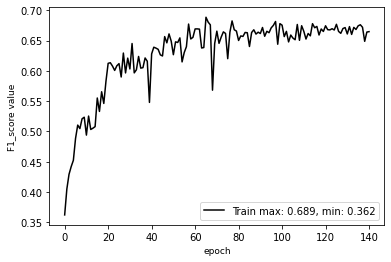

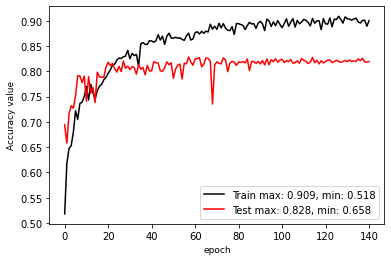

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 141 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.343319
accuracy: 0.898316
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.02  Average F1 score：66.64 
69.44 84.61 90.03 92.91 59.35 95.18 59.36 35.04 76.05 
66.67 75.46 91.60 48.03 12.49 91.88 62.63 53.93 84.96 
68.03 79.77 90.81 63.32 20.64 93.50 60.96 42.48 80.26 

learn rate: 0.000078
eval mean loss: 0.643690
eval accuracy: 0.820159
eval avg class acc: 0.652944


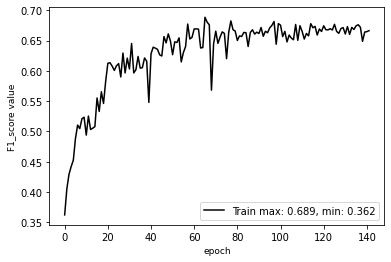

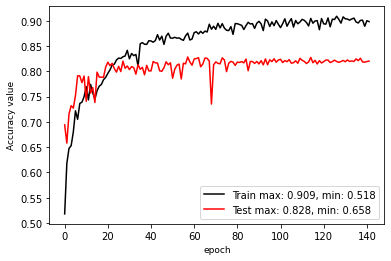

**** EPOCH 142 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.333417
accuracy: 0.905549
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.13  Average F1 score：66.69 
68.70 84.25 90.75 93.46 64.97 95.32 62.08 35.44 74.52 
69.50 76.91 91.39 48.54 11.55 91.33 58.90 53.79 85.57 
69.10 80.41 91.07 63.90 19.61 93.28 60.45 42.73 79.66 

learn rate: 0.000078
eval mean loss: 0.645800
eval accuracy: 0.821277
eval avg class acc: 0.652757


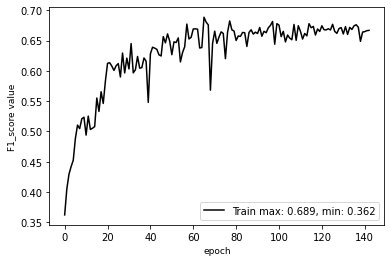

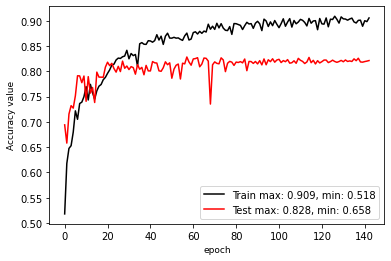

**** EPOCH 143 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.332200
accuracy: 0.896709
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.92  Average F1 score：66.11 
68.71 84.17 90.65 93.76 59.36 95.26 60.65 35.23 73.25 
69.17 76.42 91.14 44.61 12.00 91.37 60.10 51.02 86.54 
68.94 80.11 90.89 60.45 19.97 93.27 60.37 41.68 79.34 

learn rate: 0.000078
eval mean loss: 0.647077
eval accuracy: 0.819232
eval avg class acc: 0.647070


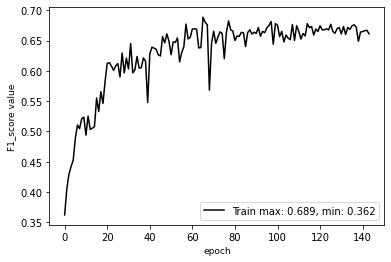

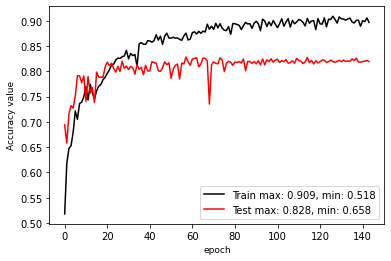

**** EPOCH 144 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.340777
accuracy: 0.899046
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.99  Average F1 score：67.78 
68.65 83.76 90.93 93.47 54.40 95.57 61.14 35.91 73.95 
69.33 76.95 90.65 56.72 15.00 90.80 59.55 53.54 85.84 
68.99 80.21 90.79 70.59 23.51 93.12 60.33 42.98 79.45 

learn rate: 0.000078
eval mean loss: 0.637615
eval accuracy: 0.819868
eval avg class acc: 0.664859


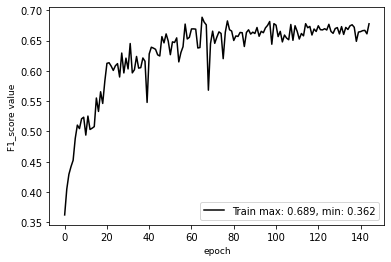

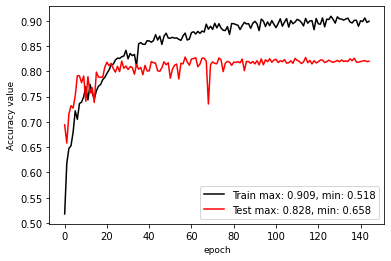

**** EPOCH 145 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.329699
accuracy: 0.910936
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.12  Average F1 score：67.16 
67.62 84.33 90.39 93.76 63.57 95.02 61.85 35.74 74.64 
70.67 76.64 91.52 53.05 12.27 91.54 58.52 53.36 85.18 
69.11 80.30 90.95 67.76 20.58 93.25 60.14 42.81 79.56 

learn rate: 0.000078
eval mean loss: 0.638614
eval accuracy: 0.821167
eval avg class acc: 0.658603


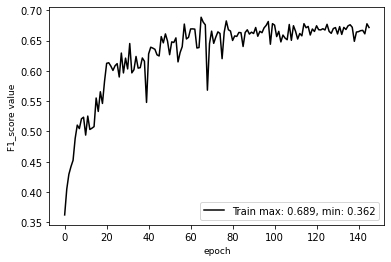

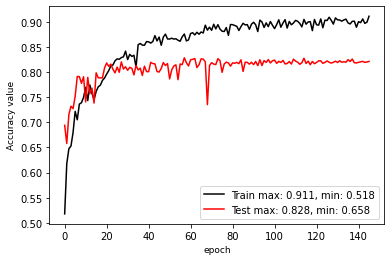

**** EPOCH 146 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.338903
accuracy: 0.900654
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.14  Average F1 score：67.32 
68.41 84.23 90.85 93.57 63.59 95.21 62.35 35.41 74.01 
69.67 76.84 91.26 52.16 14.21 91.36 57.97 52.21 86.32 
69.03 80.36 91.05 66.98 23.24 93.25 60.08 42.20 79.69 

learn rate: 0.000078
eval mean loss: 0.638124
eval accuracy: 0.821447
eval avg class acc: 0.657771


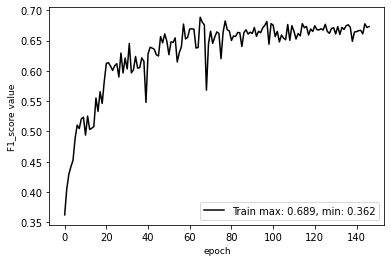

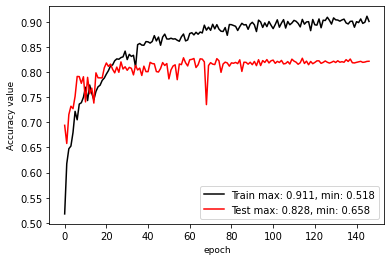

**** EPOCH 147 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.341795
accuracy: 0.890226
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.08  Average F1 score：67.23 
68.85 84.57 90.72 92.52 62.14 95.18 62.15 34.97 75.08 
66.67 76.15 91.41 53.40 13.55 91.55 58.77 54.53 85.23 
67.74 80.14 91.07 67.72 22.25 93.33 60.41 42.61 79.83 

learn rate: 0.000078
eval mean loss: 0.639239
eval accuracy: 0.820798
eval avg class acc: 0.656945


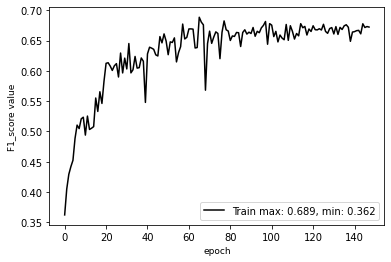

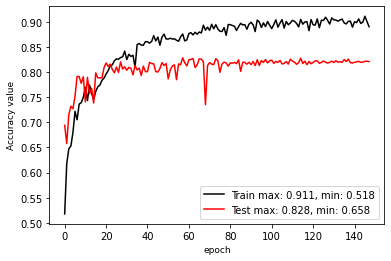

**** EPOCH 148 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.340293
accuracy: 0.901832
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.18  Average F1 score：67.02 
69.09 84.30 90.76 93.88 60.55 95.26 62.03 35.42 74.69 
68.17 77.12 91.35 49.19 13.77 91.42 58.94 53.05 85.49 
68.62 80.55 91.05 64.55 22.44 93.30 60.44 42.48 79.73 

learn rate: 0.000078
eval mean loss: 0.640095
eval accuracy: 0.821818
eval avg class acc: 0.653883


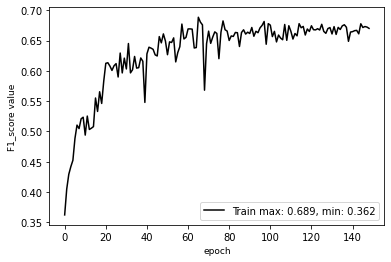

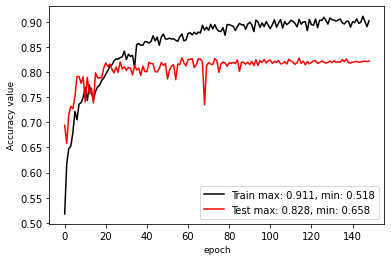

**** EPOCH 149 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.336498
accuracy: 0.904602
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.06  Average F1 score：66.52 
69.66 84.34 90.74 93.48 64.12 95.26 62.13 34.93 73.85 
65.83 76.73 91.44 48.71 12.11 91.40 59.31 51.91 85.86 
67.69 80.36 91.09 64.04 20.38 93.29 60.69 41.76 79.40 

learn rate: 0.000078
eval mean loss: 0.639344
eval accuracy: 0.820575
eval avg class acc: 0.648109


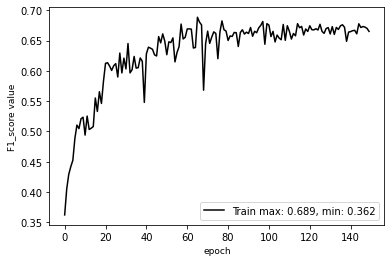

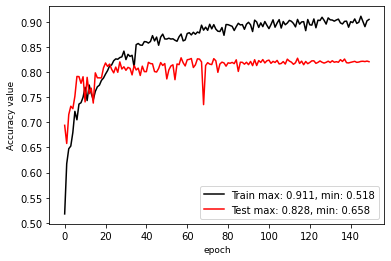

**** EPOCH 150 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.347864
accuracy: 0.889919
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.36  Average F1 score：67.22 
69.12 84.08 90.72 93.57 68.46 94.87 60.95 36.10 75.62 
69.00 77.08 91.16 52.56 11.64 92.27 60.34 53.07 85.32 
69.06 80.43 90.94 67.31 19.90 93.55 60.64 42.97 80.18 

learn rate: 0.000078
eval mean loss: 0.637604
eval accuracy: 0.823596
eval avg class acc: 0.658268


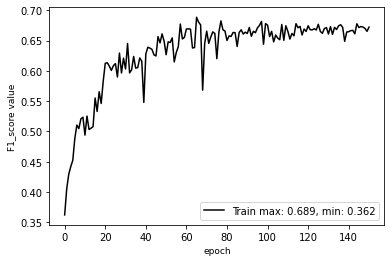

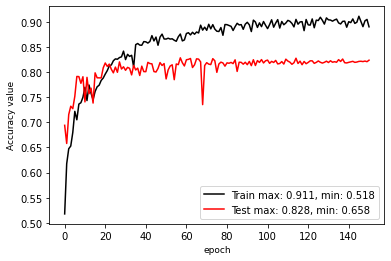

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 151 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.338150
accuracy: 0.893721
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.04  Average F1 score：65.93 
68.42 84.83 90.30 90.84 59.26 95.23 61.00 35.67 73.83 
67.17 76.28 91.97 41.99 13.15 91.22 59.13 52.83 85.85 
67.79 80.33 91.13 57.43 21.52 93.18 60.05 42.59 79.39 

learn rate: 0.000078
eval mean loss: 0.644304
eval accuracy: 0.820446
eval avg class acc: 0.644000


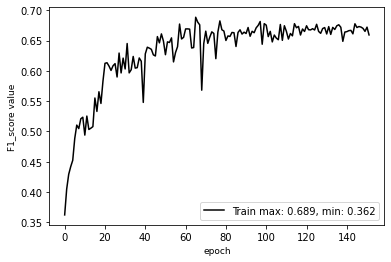

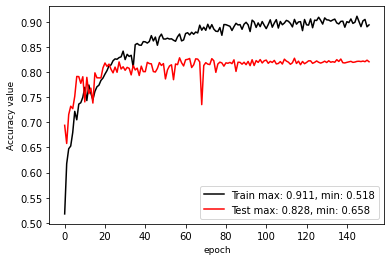

**** EPOCH 152 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.337387
accuracy: 0.906082
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.25  Average F1 score：66.28 
69.31 84.72 90.61 88.91 65.98 94.78 61.73 35.42 75.52 
67.00 76.30 91.75 44.77 12.13 92.26 59.52 53.69 85.21 
68.14 80.29 91.18 59.55 20.49 93.50 60.61 42.68 80.07 

learn rate: 0.000078
eval mean loss: 0.640839
eval accuracy: 0.822515
eval avg class acc: 0.647360


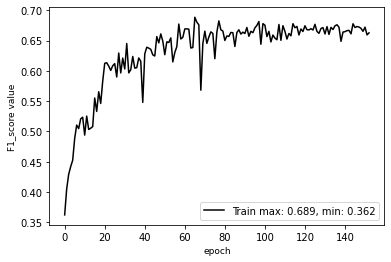

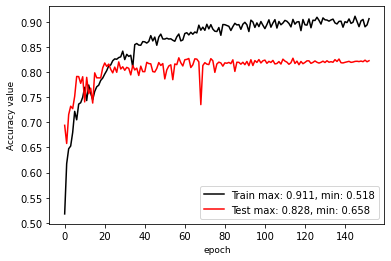

**** EPOCH 153 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.345995
accuracy: 0.915870
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.32  Average F1 score：66.37 
69.10 84.22 90.87 91.89 64.59 94.87 61.31 35.43 76.76 
69.33 76.85 91.22 42.80 12.02 92.52 60.24 54.82 84.65 
69.22 80.36 91.04 58.40 20.27 93.68 60.77 43.04 80.51 

learn rate: 0.000078
eval mean loss: 0.636244
eval accuracy: 0.823186
eval avg class acc: 0.649385


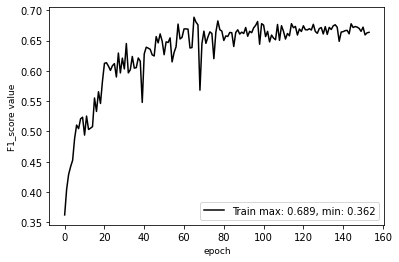

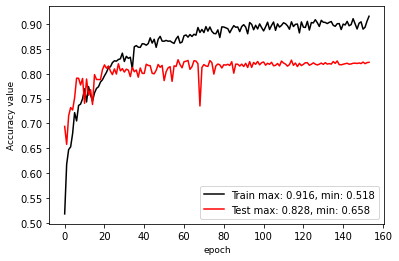

**** EPOCH 154 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.333313
accuracy: 0.900904
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.42  Average F1 score：66.70 
69.49 84.69 90.54 92.46 64.15 95.08 62.52 35.55 75.90 
69.83 77.03 92.03 45.66 11.88 92.05 59.49 53.74 84.98 
69.66 80.67 91.28 61.13 20.05 93.54 60.97 42.79 80.18 

learn rate: 0.000078
eval mean loss: 0.633649
eval accuracy: 0.824215
eval avg class acc: 0.651879


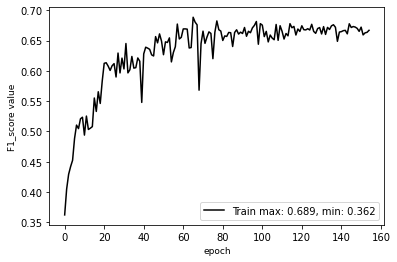

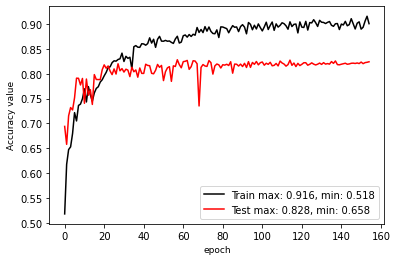

**** EPOCH 155 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.334803
accuracy: 0.893598
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.25  Average F1 score：66.92 
67.64 85.07 90.46 90.83 58.16 95.29 62.41 35.36 75.15 
69.67 76.21 92.15 47.01 14.36 91.72 59.41 54.21 85.02 
68.64 80.39 91.30 61.95 23.04 93.47 60.87 42.80 79.78 

learn rate: 0.000078
eval mean loss: 0.633661
eval accuracy: 0.822544
eval avg class acc: 0.655281


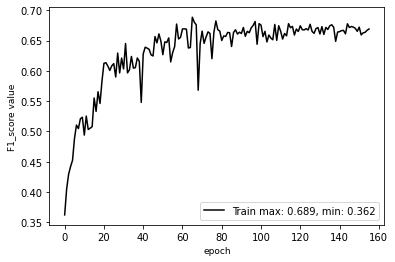

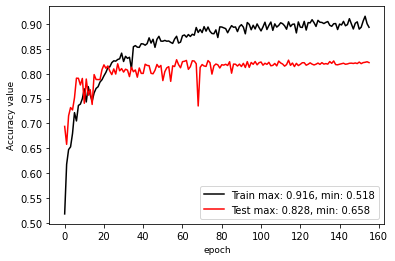

**** EPOCH 156 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.329395
accuracy: 0.902958
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.22  Average F1 score：66.50 
69.40 85.20 90.29 92.21 56.03 95.19 60.91 35.45 74.52 
67.67 76.05 92.28 45.04 13.46 91.64 60.45 52.20 85.94 
68.52 80.36 91.27 60.52 21.71 93.38 60.68 42.23 79.82 

learn rate: 0.000078
eval mean loss: 0.639427
eval accuracy: 0.822207
eval avg class acc: 0.649704


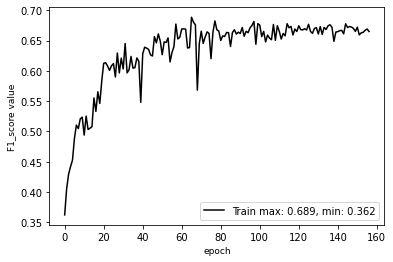

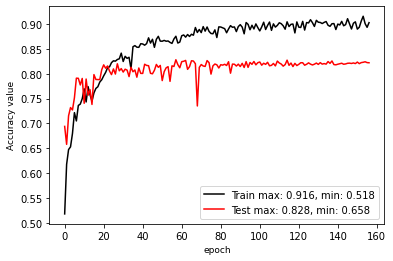

**** EPOCH 157 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.333619
accuracy: 0.910396
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.10  Average F1 score：65.86 
68.30 85.01 90.07 93.79 61.17 94.93 60.97 34.61 76.78 
67.50 75.60 92.02 41.13 11.40 92.43 61.08 55.11 83.84 
67.90 80.03 91.03 57.18 19.22 93.67 61.03 42.51 80.15 

learn rate: 0.000078
eval mean loss: 0.641657
eval accuracy: 0.821002
eval avg class acc: 0.644566


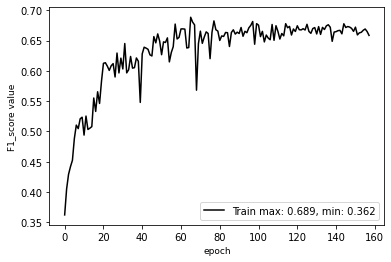

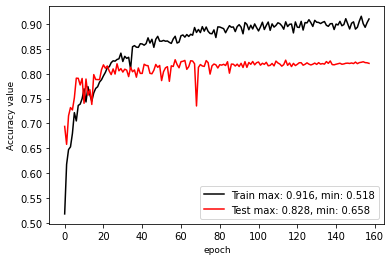

**** EPOCH 158 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.336254
accuracy: 0.901201
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.91  Average F1 score：66.49 
67.62 84.61 90.47 91.57 64.96 95.42 60.81 34.82 73.89 
71.00 76.37 91.63 46.01 13.14 91.00 59.92 53.02 85.15 
69.27 80.28 91.04 61.25 21.85 93.16 60.36 42.04 79.12 

learn rate: 0.000078
eval mean loss: 0.648895
eval accuracy: 0.819064
eval avg class acc: 0.652492


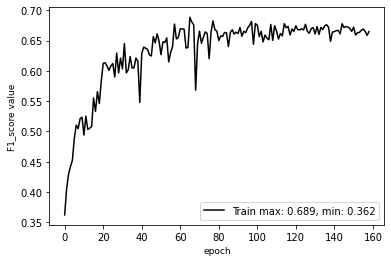

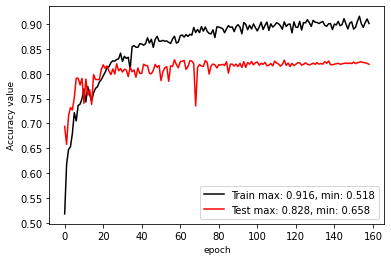

**** EPOCH 159 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.334423
accuracy: 0.894685
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.09  Average F1 score：66.55 
68.93 84.54 90.57 90.24 60.42 95.21 60.37 35.45 74.45 
69.50 76.43 91.54 46.90 12.89 91.60 59.78 52.90 85.46 
69.21 80.28 91.05 61.72 21.25 93.37 60.07 42.45 79.58 

learn rate: 0.000078
eval mean loss: 0.642469
eval accuracy: 0.820852
eval avg class acc: 0.652217


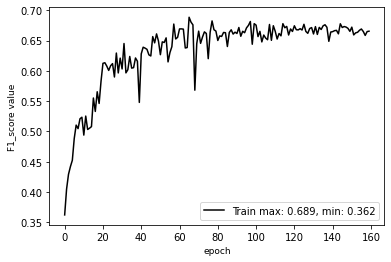

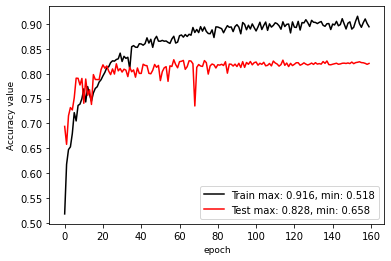

**** EPOCH 160 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.335451
accuracy: 0.901266
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.15  Average F1 score：67.08 
67.94 84.98 90.37 88.63 59.48 95.21 62.03 35.83 73.47 
71.00 76.37 91.94 52.16 13.65 91.40 57.81 52.32 85.87 
69.44 80.44 91.15 65.67 22.20 93.27 59.85 42.54 79.18 

learn rate: 0.000039
eval mean loss: 0.643937
eval accuracy: 0.821466
eval avg class acc: 0.658357


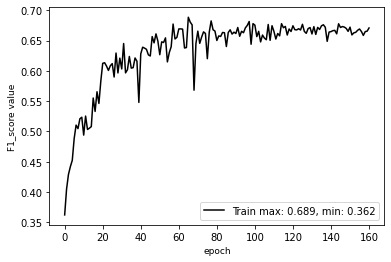

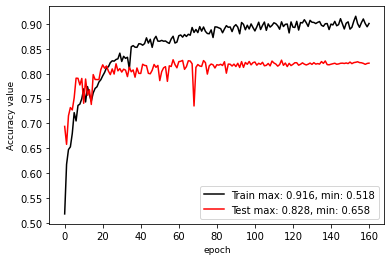

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 161 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.333939
accuracy: 0.903049
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.19  Average F1 score：66.66 
69.03 84.63 90.53 86.92 60.13 95.28 62.34 35.55 74.74 
69.83 76.67 91.65 48.41 12.27 91.61 58.66 53.67 85.48 
69.43 80.45 91.09 62.19 20.39 93.41 60.45 42.77 79.75 

learn rate: 0.000039
eval mean loss: 0.648658
eval accuracy: 0.821930
eval avg class acc: 0.653604


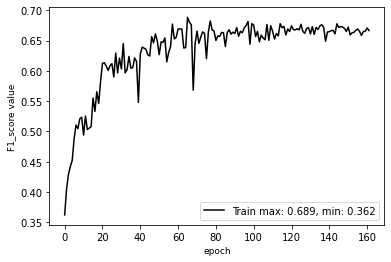

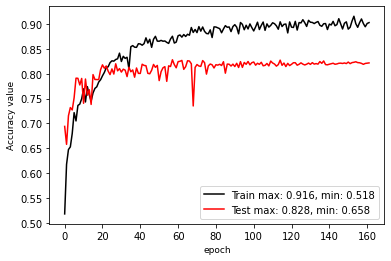

**** EPOCH 162 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.331336
accuracy: 0.902731
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.02  Average F1 score：66.25 
69.06 84.91 90.30 87.81 57.19 95.25 61.12 35.15 73.53 
67.33 76.04 91.93 47.20 12.92 91.50 58.76 51.44 85.98 
68.19 80.23 91.11 61.39 21.08 93.34 59.91 41.77 79.27 

learn rate: 0.000039
eval mean loss: 0.647147
eval accuracy: 0.820157
eval avg class acc: 0.647884


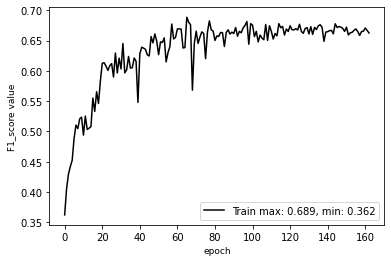

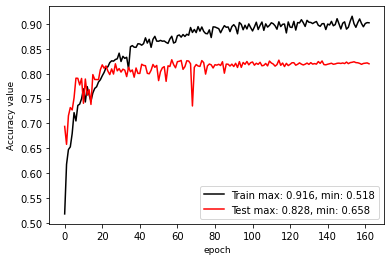

**** EPOCH 163 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.333696
accuracy: 0.903191
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.14  Average F1 score：66.64 
69.18 84.97 90.53 88.67 56.17 95.17 60.66 35.24 74.07 
68.83 76.10 91.85 48.35 13.61 91.88 59.21 51.62 85.85 
69.01 80.29 91.18 62.58 21.91 93.49 59.93 41.88 79.53 

learn rate: 0.000039
eval mean loss: 0.644454
eval accuracy: 0.821415
eval avg class acc: 0.652559


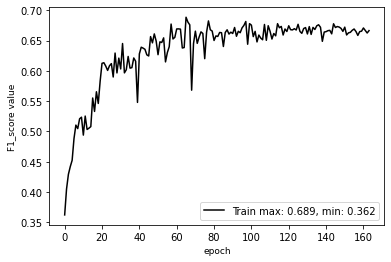

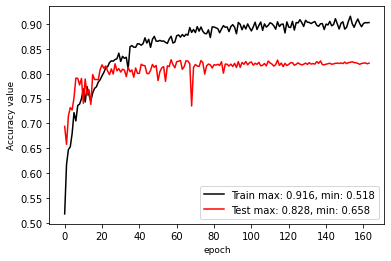

**** EPOCH 164 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.329172
accuracy: 0.914566
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.01  Average F1 score：66.52 
67.26 84.68 90.70 91.99 55.54 95.33 61.24 35.18 73.19 
69.83 76.40 91.62 48.30 13.45 91.31 57.73 51.66 86.15 
68.52 80.33 91.15 63.34 21.65 93.28 59.44 41.86 79.15 

learn rate: 0.000039
eval mean loss: 0.648550
eval accuracy: 0.820050
eval avg class acc: 0.651617


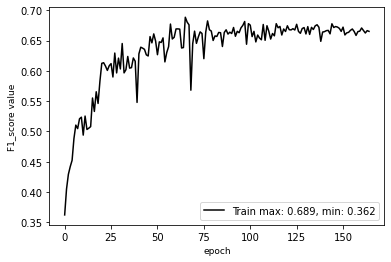

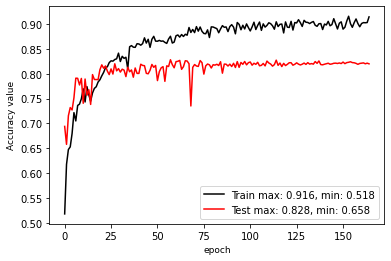

**** EPOCH 165 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.327180
accuracy: 0.909367
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.07  Average F1 score：66.52 
68.76 84.64 90.50 92.46 59.63 95.31 61.75 35.24 73.75 
67.50 76.44 91.71 47.92 13.10 91.44 57.84 52.23 85.91 
68.12 80.33 91.10 63.13 21.48 93.33 59.73 42.08 79.37 

learn rate: 0.000039
eval mean loss: 0.643417
eval accuracy: 0.820660
eval avg class acc: 0.649000


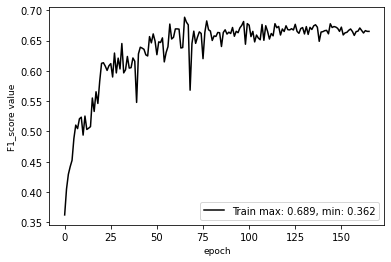

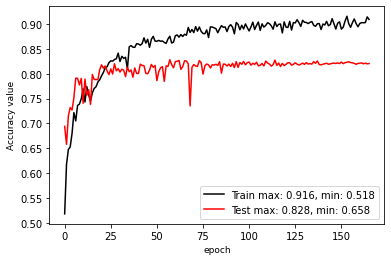

**** EPOCH 166 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332280
accuracy: 0.907736
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.66 
68.15 84.29 90.63 92.75 59.08 95.37 62.56 35.65 73.63 
68.83 77.08 91.55 49.00 12.58 91.63 57.77 51.43 86.05 
68.49 80.52 91.09 64.13 20.75 93.46 60.07 42.11 79.36 

learn rate: 0.000039
eval mean loss: 0.642577
eval accuracy: 0.821974
eval avg class acc: 0.651022


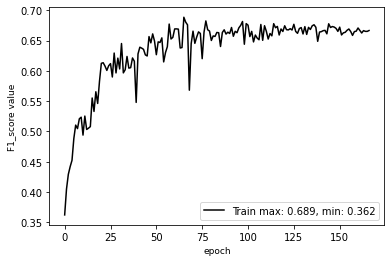

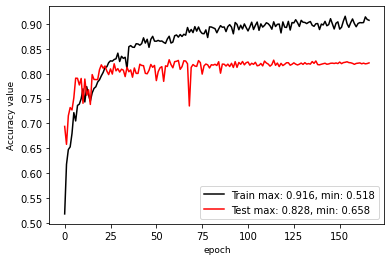

**** EPOCH 167 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332747
accuracy: 0.903066
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.10  Average F1 score：66.07 
67.97 84.88 90.26 92.14 56.43 95.16 60.42 35.23 73.96 
69.67 76.09 91.91 43.02 12.95 91.90 59.68 50.88 86.09 
68.81 80.24 91.08 58.65 21.06 93.50 60.05 41.63 79.56 

learn rate: 0.000039
eval mean loss: 0.645596
eval accuracy: 0.820992
eval avg class acc: 0.646866


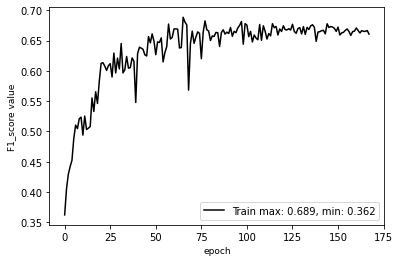

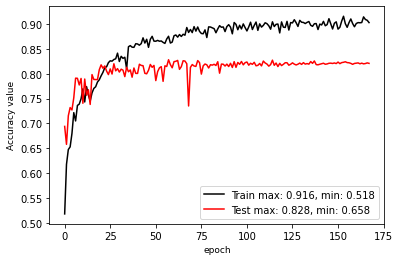

**** EPOCH 168 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332022
accuracy: 0.891300
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.14  Average F1 score：65.84 
69.55 84.62 90.39 92.68 58.02 95.28 60.25 35.21 74.34 
67.00 76.42 91.80 41.64 12.18 91.86 60.33 51.19 86.06 
68.25 80.31 91.09 57.46 20.13 93.54 60.29 41.73 79.77 

learn rate: 0.000039
eval mean loss: 0.645040
eval accuracy: 0.821425
eval avg class acc: 0.642745


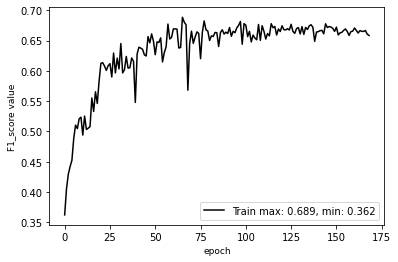

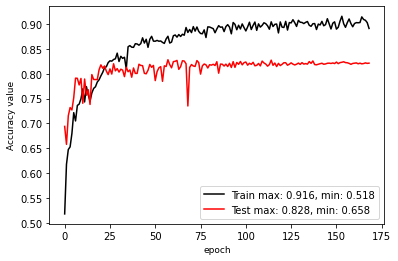

**** EPOCH 169 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332971
accuracy: 0.899081
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.03  Average F1 score：66.02 
66.72 84.52 90.42 92.15 56.52 95.41 62.47 35.39 73.69 
70.17 76.69 91.69 43.04 12.67 91.26 57.89 52.60 85.79 
68.40 80.42 91.05 58.68 20.69 93.29 60.10 42.31 79.28 

learn rate: 0.000039
eval mean loss: 0.652381
eval accuracy: 0.820327
eval avg class acc: 0.646450


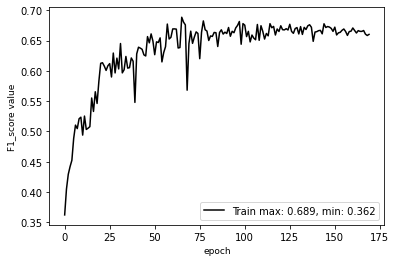

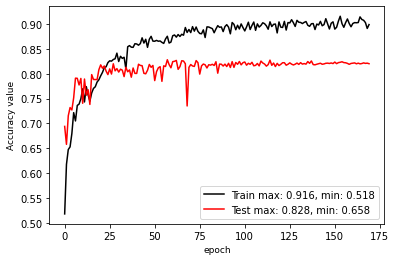

**** EPOCH 170 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.326060
accuracy: 0.909488
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.23  Average F1 score：66.13 
68.29 84.60 90.39 91.49 58.10 95.05 61.10 35.64 75.04 
67.83 76.52 91.79 42.61 12.85 92.03 60.15 52.41 85.53 
68.06 80.36 91.09 58.14 21.05 93.51 60.62 42.43 79.94 

learn rate: 0.000039
eval mean loss: 0.646491
eval accuracy: 0.822314
eval avg class acc: 0.646361


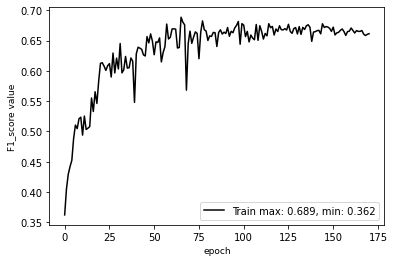

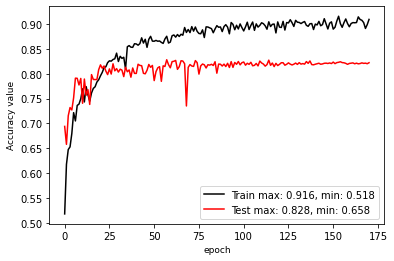

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 171 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332801
accuracy: 0.906922
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.09  Average F1 score：66.57 
68.02 84.44 90.35 93.21 63.41 95.13 61.36 35.50 74.65 
67.00 76.30 91.49 49.24 11.98 91.74 59.19 53.30 85.46 
67.51 80.16 90.92 64.44 20.15 93.40 60.25 42.61 79.69 

learn rate: 0.000039
eval mean loss: 0.650727
eval accuracy: 0.820886
eval avg class acc: 0.650769


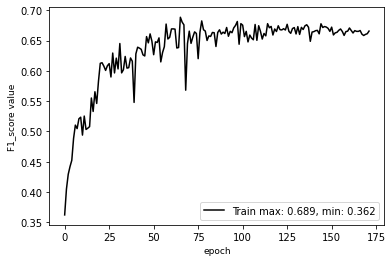

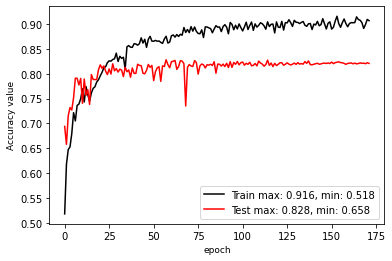

**** EPOCH 172 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.333329
accuracy: 0.902264
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.24  Average F1 score：66.85 
68.25 84.45 90.48 92.58 62.35 95.09 61.14 35.48 75.63 
67.00 76.39 91.52 51.13 12.07 92.15 59.48 53.60 85.27 
67.62 80.21 91.00 65.88 20.23 93.60 60.30 42.70 80.16 

learn rate: 0.000039
eval mean loss: 0.638407
eval accuracy: 0.822430
eval avg class acc: 0.653998


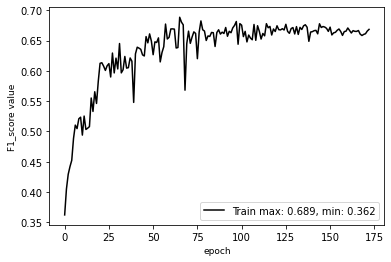

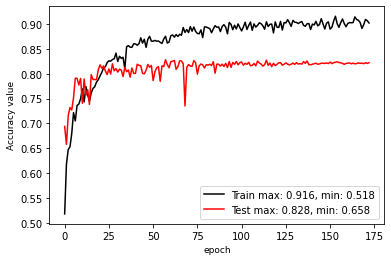

**** EPOCH 173 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.326658
accuracy: 0.905383
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.12  Average F1 score：66.21 
68.50 84.78 90.09 91.82 59.79 95.05 61.04 35.34 74.75 
68.50 76.02 91.86 45.12 12.14 92.04 59.07 52.37 85.57 
68.50 80.16 90.97 60.51 20.18 93.52 60.04 42.20 79.79 

learn rate: 0.000039
eval mean loss: 0.640859
eval accuracy: 0.821160
eval avg class acc: 0.647428


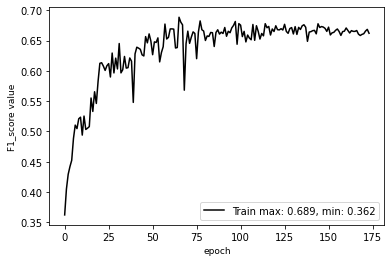

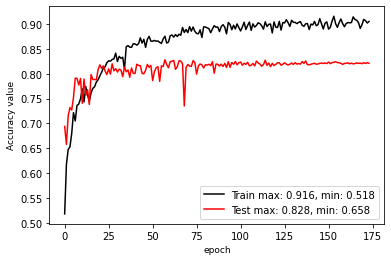

**** EPOCH 174 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.330382
accuracy: 0.906016
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.42 
67.76 84.46 90.53 92.47 63.29 95.33 62.54 35.43 74.02 
68.67 76.98 91.61 46.68 12.36 91.62 57.85 52.03 86.01 
68.21 80.55 91.07 62.04 20.67 93.44 60.10 42.16 79.57 

learn rate: 0.000039
eval mean loss: 0.643321
eval accuracy: 0.821957
eval avg class acc: 0.648678


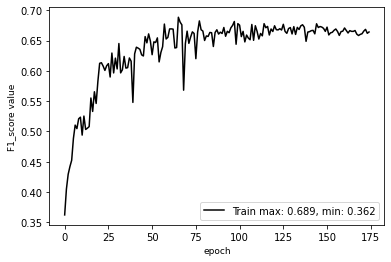

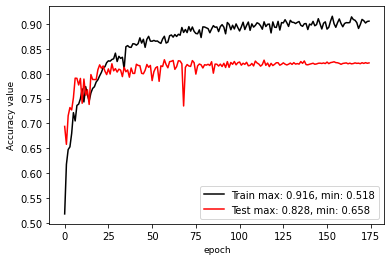

**** EPOCH 175 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.330029
accuracy: 0.905153
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：81.91  Average F1 score：66.05 
68.34 84.79 90.45 91.13 64.13 95.45 61.99 35.17 72.64 
68.00 76.46 91.85 45.42 12.50 90.75 56.74 52.27 86.32 
68.17 80.41 91.14 60.62 20.93 93.04 59.25 42.05 78.89 

learn rate: 0.000039
eval mean loss: 0.658266
eval accuracy: 0.819134
eval avg class acc: 0.644780


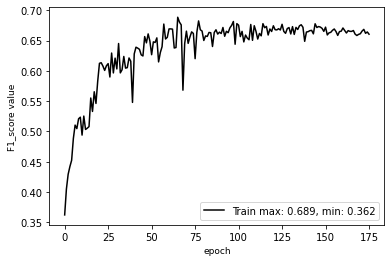

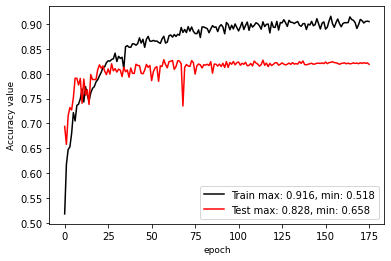

**** EPOCH 176 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.320550
accuracy: 0.900975
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.33  Average F1 score：66.83 
68.36 84.55 90.41 89.93 63.78 95.03 62.26 35.96 74.54 
69.50 77.12 91.67 49.35 12.81 91.88 58.06 51.77 85.96 
68.93 80.66 91.04 63.73 21.34 93.43 60.09 42.44 79.84 

learn rate: 0.000039
eval mean loss: 0.642569
eval accuracy: 0.823290
eval avg class acc: 0.653471


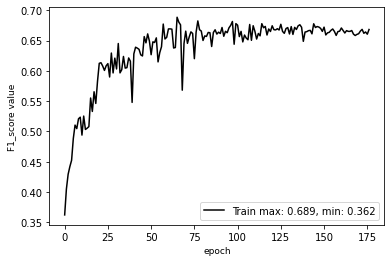

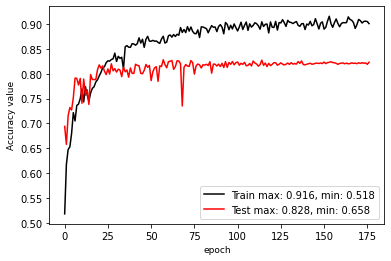

**** EPOCH 177 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.325188
accuracy: 0.904116
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.84 
67.75 84.14 90.48 92.69 62.42 95.08 62.46 35.51 75.11 
69.33 76.82 91.27 49.27 12.60 92.06 58.93 52.80 85.31 
68.53 80.31 90.87 64.34 20.96 93.55 60.64 42.47 79.89 

learn rate: 0.000039
eval mean loss: 0.639943
eval accuracy: 0.822013
eval avg class acc: 0.653771


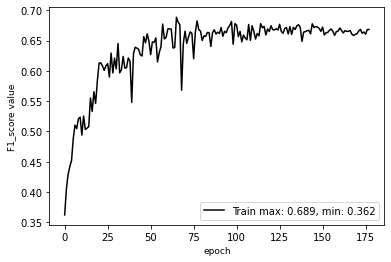

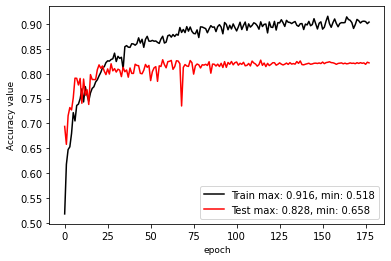

**** EPOCH 178 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.330141
accuracy: 0.912850
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.18  Average F1 score：66.33 
68.65 84.05 90.77 92.29 56.84 95.21 62.21 35.40 74.20 
67.17 77.30 91.24 45.20 13.43 91.82 58.25 51.07 85.94 
67.90 80.54 91.00 60.68 21.73 93.49 60.16 41.81 79.64 

learn rate: 0.000039
eval mean loss: 0.640275
eval accuracy: 0.821821
eval avg class acc: 0.646029


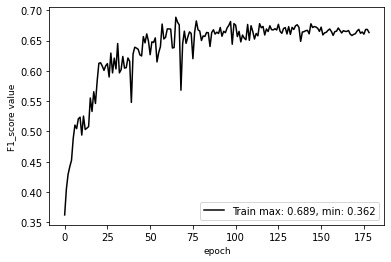

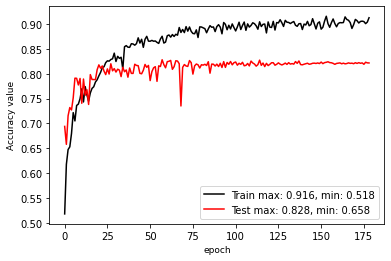

**** EPOCH 179 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.332848
accuracy: 0.905511
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.11  Average F1 score：66.81 
67.30 84.37 90.75 92.28 59.53 95.14 62.51 35.22 73.31 
70.67 76.76 91.45 50.92 13.08 91.66 56.94 50.51 86.49 
68.94 80.38 91.10 65.62 21.45 93.37 59.60 41.50 79.35 

learn rate: 0.000039
eval mean loss: 0.644840
eval accuracy: 0.821128
eval avg class acc: 0.653852


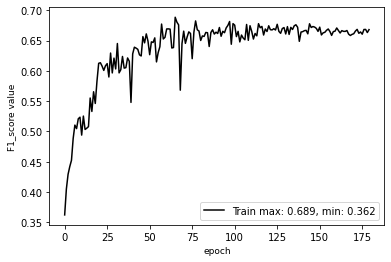

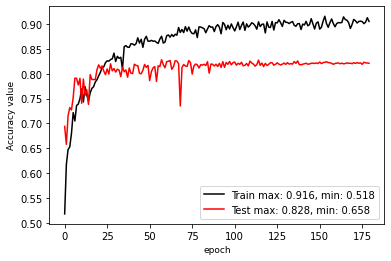

**** EPOCH 180 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.319588
accuracy: 0.900163
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.27  Average F1 score：67.23 
68.71 84.28 90.50 91.82 59.86 95.09 62.01 35.76 74.88 
69.17 76.80 91.46 52.64 13.12 91.91 58.94 52.11 85.81 
68.94 80.37 90.98 66.92 21.53 93.47 60.43 42.41 79.98 

learn rate: 0.000020
eval mean loss: 0.638257
eval accuracy: 0.822690
eval avg class acc: 0.657734


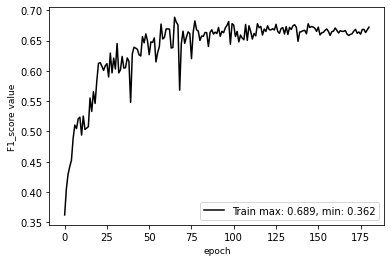

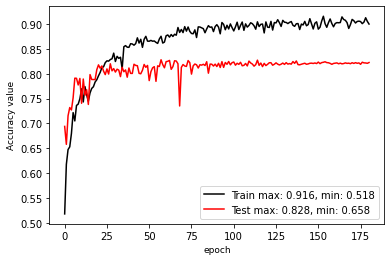

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 181 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.335378
accuracy: 0.899273
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.14  Average F1 score：66.88 
67.53 84.34 90.54 92.07 59.68 95.33 62.15 35.59 74.22 
69.67 76.69 91.55 50.43 12.92 91.42 58.11 52.71 85.92 
68.58 80.33 91.04 65.17 21.24 93.33 60.06 42.49 79.65 

learn rate: 0.000020
eval mean loss: 0.646279
eval accuracy: 0.821410
eval avg class acc: 0.654918


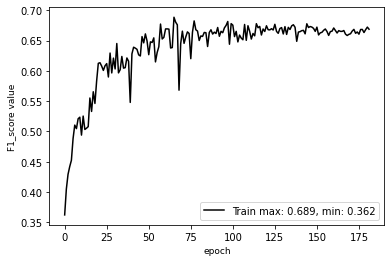

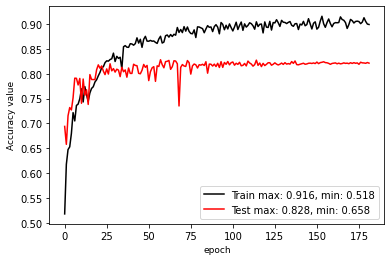

**** EPOCH 182 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.326454
accuracy: 0.894813
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.22  Average F1 score：66.63 
68.20 84.26 90.70 92.46 61.12 95.26 61.91 35.64 74.38 
69.33 77.07 91.39 47.63 12.67 91.70 58.12 52.35 85.96 
68.76 80.50 91.04 62.87 20.98 93.44 59.95 42.41 79.75 

learn rate: 0.000020
eval mean loss: 0.646575
eval accuracy: 0.822173
eval avg class acc: 0.651345


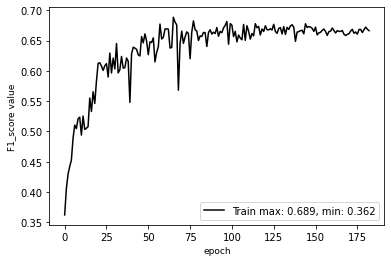

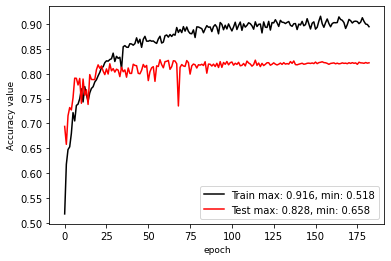

**** EPOCH 183 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.330218
accuracy: 0.902187
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.10  Average F1 score：66.85 
69.40 84.43 90.55 92.85 62.86 95.37 61.63 35.38 73.95 
67.67 76.54 91.45 50.11 12.81 91.36 58.94 52.33 86.27 
68.52 80.29 91.00 65.09 21.29 93.33 60.25 42.22 79.63 

learn rate: 0.000020
eval mean loss: 0.649151
eval accuracy: 0.821009
eval avg class acc: 0.652748


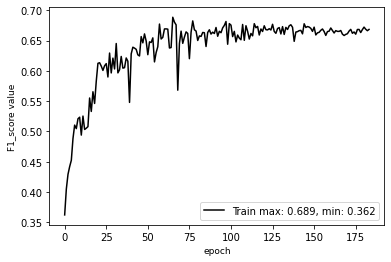

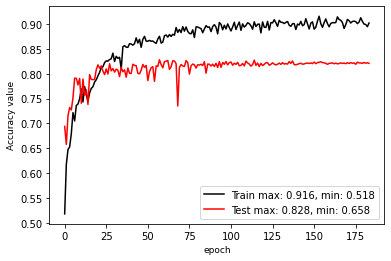

**** EPOCH 184 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.335874
accuracy: 0.899966
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.06  Average F1 score：66.72 
68.79 84.53 90.51 92.42 60.69 95.28 61.82 35.19 73.86 
68.33 76.25 91.59 49.35 12.96 91.50 58.46 52.03 86.21 
68.56 80.18 91.05 64.35 21.36 93.35 60.09 41.99 79.56 

learn rate: 0.000020
eval mean loss: 0.649777
eval accuracy: 0.820628
eval avg class acc: 0.651890


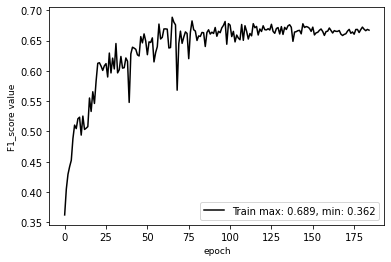

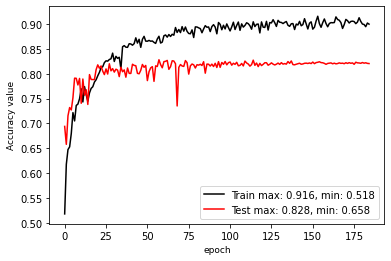

**** EPOCH 185 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.327605
accuracy: 0.900984
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.77 
67.66 84.69 90.32 92.17 59.17 95.23 62.30 35.54 74.12 
68.33 76.37 91.89 49.51 13.26 91.74 58.17 51.78 86.12 
67.99 80.32 91.10 64.42 21.66 93.45 60.16 42.15 79.67 

learn rate: 0.000020
eval mean loss: 0.644528
eval accuracy: 0.822027
eval avg class acc: 0.652437


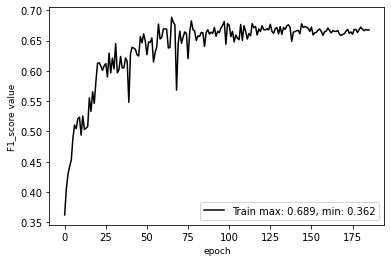

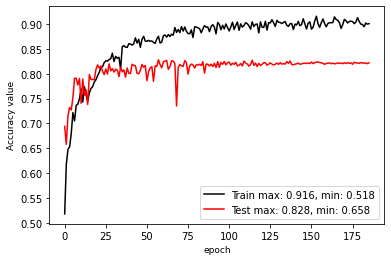

**** EPOCH 186 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.337996
accuracy: 0.908361
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.15  Average F1 score：66.69 
68.57 84.67 90.44 92.18 58.02 95.28 62.41 35.38 73.81 
68.00 76.43 91.73 48.98 13.26 91.63 57.71 51.72 86.32 
68.28 80.34 91.08 63.97 21.58 93.42 59.97 42.02 79.57 

learn rate: 0.000020
eval mean loss: 0.648285
eval accuracy: 0.821490
eval avg class acc: 0.650847


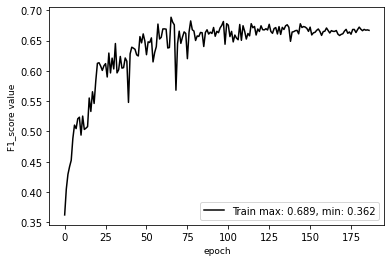

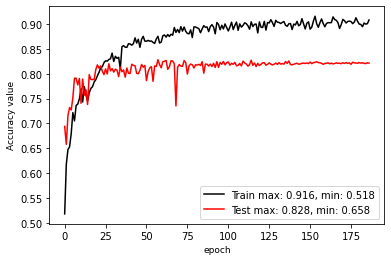

**** EPOCH 187 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.336502
accuracy: 0.895237
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.13  Average F1 score：66.51 
68.04 84.67 90.28 92.47 60.59 95.26 62.14 35.33 74.42 
68.83 76.37 91.74 47.33 12.53 91.67 58.00 52.83 85.79 
68.43 80.30 91.00 62.61 20.77 93.43 60.00 42.34 79.70 

learn rate: 0.000020
eval mean loss: 0.648345
eval accuracy: 0.821267
eval avg class acc: 0.650103


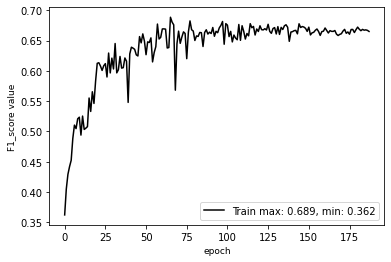

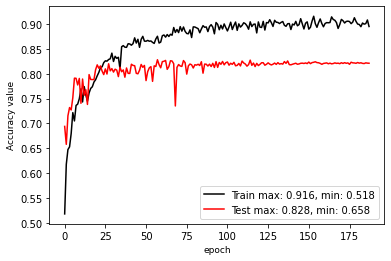

**** EPOCH 188 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.320672
accuracy: 0.905590
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.16  Average F1 score：66.50 
68.26 84.83 90.24 92.01 59.03 95.23 62.32 35.36 74.32 
68.83 76.24 91.85 46.90 12.81 91.80 57.83 52.44 86.04 
68.55 80.30 91.04 62.13 21.06 93.48 59.99 42.24 79.75 

learn rate: 0.000020
eval mean loss: 0.643893
eval accuracy: 0.821626
eval avg class acc: 0.649711


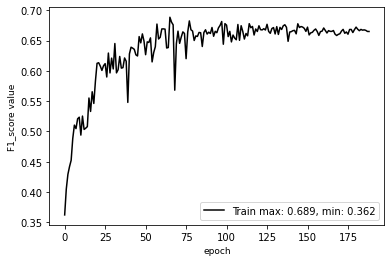

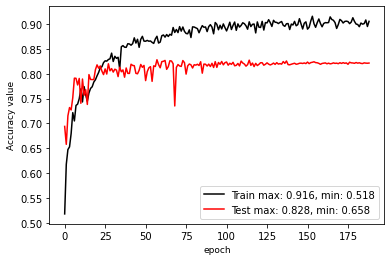

**** EPOCH 189 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.325088
accuracy: 0.900440
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.22  Average F1 score：67.21 
68.51 84.48 90.46 92.14 59.73 95.33 62.23 35.52 74.38 
68.17 76.67 91.61 53.72 13.19 91.71 58.24 52.29 85.78 
68.34 80.39 91.03 67.87 21.61 93.49 60.17 42.30 79.67 

learn rate: 0.000020
eval mean loss: 0.636764
eval accuracy: 0.822180
eval avg class acc: 0.657083


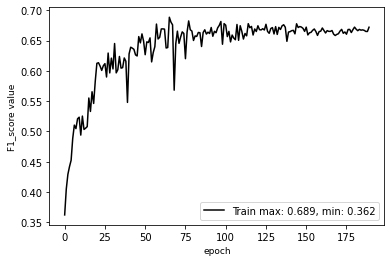

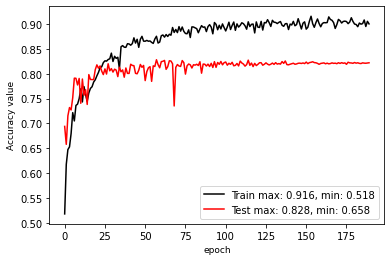

**** EPOCH 190 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.324703
accuracy: 0.908299
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.26  Average F1 score：66.79 
69.34 84.78 90.28 92.04 59.65 95.27 61.83 35.58 74.58 
67.83 76.68 91.98 49.87 12.37 91.73 58.57 52.32 85.66 
68.58 80.53 91.12 64.68 20.49 93.47 60.16 42.35 79.73 

learn rate: 0.000020
eval mean loss: 0.639927
eval accuracy: 0.822639
eval avg class acc: 0.652239


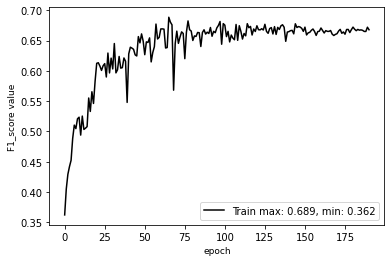

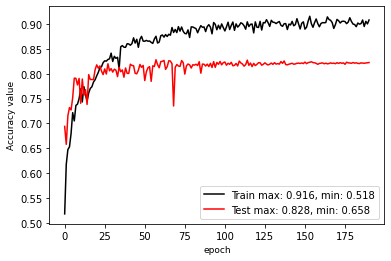

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 191 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.325720
accuracy: 0.907305
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.21  Average F1 score：66.59 
68.50 84.62 90.44 91.44 59.50 95.38 61.25 35.79 74.09 
68.50 76.93 91.79 48.38 12.41 91.36 58.59 52.31 85.95 
68.50 80.59 91.11 63.28 20.54 93.33 59.89 42.50 79.58 

learn rate: 0.000020
eval mean loss: 0.644324
eval accuracy: 0.822061
eval avg class acc: 0.651368


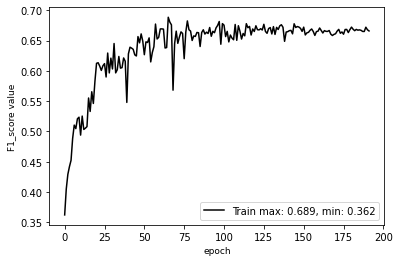

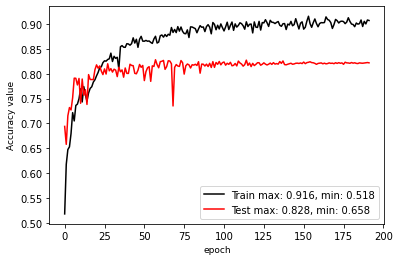

**** EPOCH 192 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.329159
accuracy: 0.901562
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.64 
67.10 84.76 90.55 90.32 56.57 95.28 62.91 35.60 73.88 
69.00 76.62 91.85 50.32 12.41 91.57 56.89 52.53 86.09 
68.04 80.49 91.19 64.63 20.35 93.39 59.75 42.44 79.52 

learn rate: 0.000020
eval mean loss: 0.643851
eval accuracy: 0.822039
eval avg class acc: 0.652532


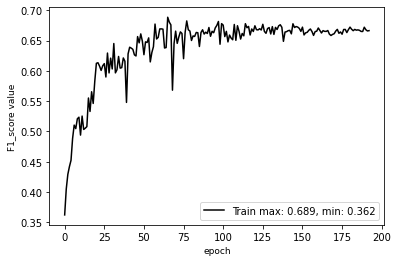

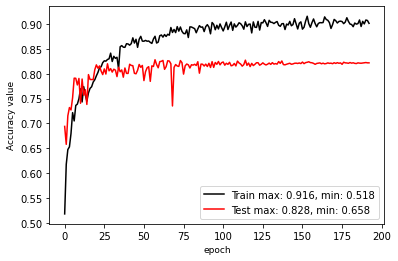

**** EPOCH 193 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.327839
accuracy: 0.905102
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.20  Average F1 score：66.61 
67.89 84.89 90.30 92.17 58.58 95.34 62.55 35.50 74.47 
68.00 76.51 92.03 48.87 12.52 91.54 57.11 53.49 85.60 
67.94 80.48 91.16 63.87 20.63 93.40 59.71 42.68 79.65 

learn rate: 0.000020
eval mean loss: 0.646314
eval accuracy: 0.822020
eval avg class acc: 0.650744


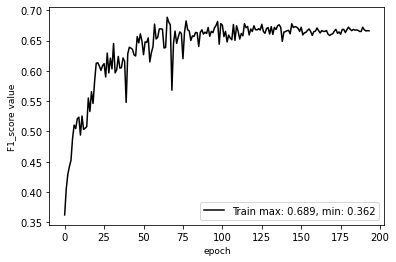

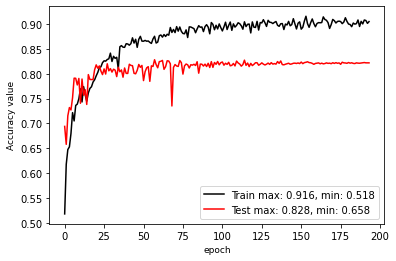

**** EPOCH 194 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.328661
accuracy: 0.902973
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.27  Average F1 score：66.61 
67.32 84.79 90.38 92.22 59.87 95.33 62.80 35.64 74.46 
68.33 77.05 92.04 48.89 12.30 91.47 57.04 53.15 85.46 
67.82 80.74 91.21 63.91 20.41 93.36 59.78 42.67 79.58 

learn rate: 0.000020
eval mean loss: 0.642663
eval accuracy: 0.822724
eval avg class acc: 0.650834


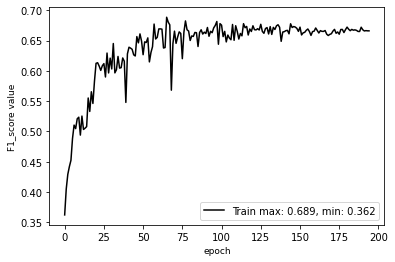

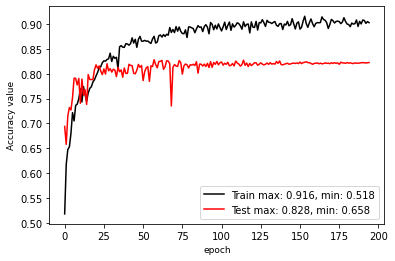

**** EPOCH 195 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.324925
accuracy: 0.902781
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.14  Average F1 score：67.00 
67.54 84.50 90.65 92.12 57.91 95.25 62.21 35.55 74.33 
68.67 76.79 91.55 52.62 12.87 91.37 57.60 53.34 85.56 
68.10 80.46 91.10 66.98 21.06 93.27 59.81 42.66 79.55 

learn rate: 0.000020
eval mean loss: 0.649158
eval accuracy: 0.821447
eval avg class acc: 0.655959


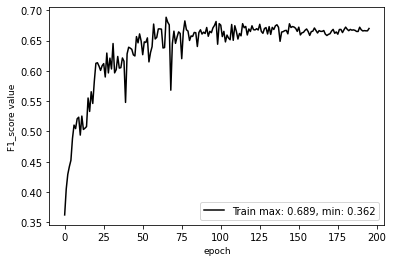

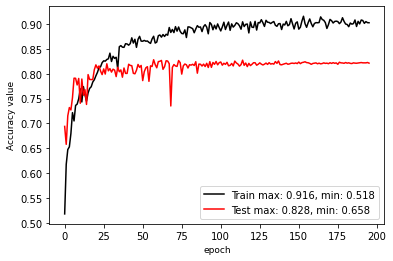

**** EPOCH 196 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.329123
accuracy: 0.913335
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.16  Average F1 score：66.45 
65.91 84.77 90.39 92.22 55.90 95.22 62.74 35.58 73.96 
67.67 76.66 91.97 49.22 12.57 91.42 57.05 52.58 85.74 
66.78 80.51 91.17 64.18 20.53 93.28 59.76 42.44 79.42 

learn rate: 0.000020
eval mean loss: 0.644820
eval accuracy: 0.821568
eval avg class acc: 0.649864


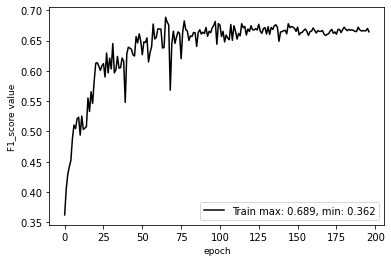

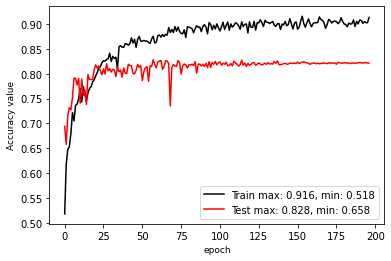

**** EPOCH 197 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.331070
accuracy: 0.896696
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.22  Average F1 score：66.62 
67.01 84.90 90.24 92.02 56.84 95.27 63.27 35.71 73.97 
65.67 76.56 92.09 50.35 12.83 91.45 57.40 52.49 85.97 
66.33 80.52 91.16 65.09 20.93 93.32 60.20 42.50 79.52 

learn rate: 0.000020
eval mean loss: 0.639774
eval accuracy: 0.822156
eval avg class acc: 0.649780


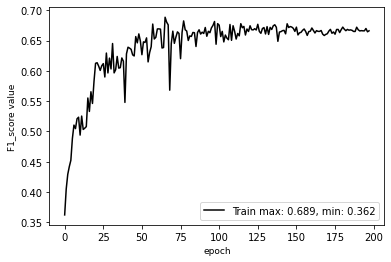

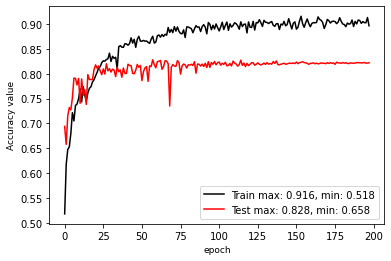

**** EPOCH 198 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.326367
accuracy: 0.904007
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.12  Average F1 score：66.50 
67.97 84.61 90.52 91.95 58.80 95.37 61.83 35.53 74.23 
66.50 76.75 91.61 48.65 12.56 91.26 58.01 53.40 85.79 
67.23 80.49 91.06 63.63 20.69 93.27 59.86 42.67 79.59 

learn rate: 0.000020
eval mean loss: 0.645017
eval accuracy: 0.821199
eval avg class acc: 0.649476


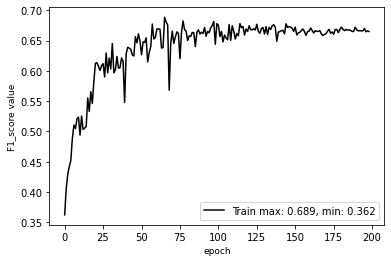

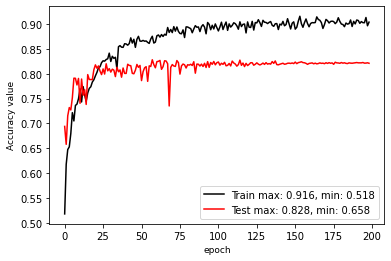

**** EPOCH 199 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.325038
accuracy: 0.911738
----


/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Overall accuracy：82.01  Average F1 score：66.70 
67.05 84.53 90.59 91.97 60.82 95.45 62.01 35.41 73.54 
67.83 76.44 91.50 51.59 12.34 91.02 57.80 53.15 86.19 
67.44 80.28 91.04 66.10 20.52 93.18 59.84 42.50 79.36 

learn rate: 0.000020
eval mean loss: 0.650132
eval accuracy: 0.820137
eval avg class acc: 0.653201


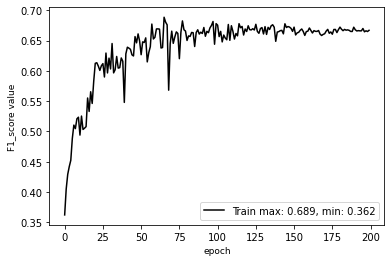

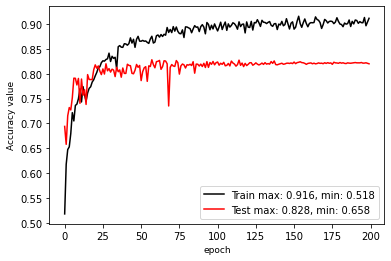

In [10]:
best_F1 = -1

for epoch in range(MAX_EPOCH):
    log_string('**** EPOCH %03d ****' % (epoch))
    sys.stdout.flush()

    train_loss, train_acc = train_one_epoch(sess, ops, train_writer)
    test_acc, test_F1 = eval_one_epoch_whole_scene(sess, ops, test_writer)

    train_acc_list.append(train_acc)
    test_acc_list.append(test_acc)

    test_F1_list.append(test_F1)

    
    drawF1Plot(test_F1_list, "F1_score")
    
    drawPlot(train_acc_list,test_acc_list,"Accuracy")

    # Save the variables to disk.
    
    if test_F1 > best_F1:
        best_F1 = test_F1
        save_path = saver.save(sess, os.path.join(LOG_DIR, "best_model_epoch_%03d.ckpt"%(epoch)))
        log_string("Model saved in file: %s" % save_path)
                
    if epoch % 10 == 0:
        save_path = saver.save(sess, os.path.join(LOG_DIR, "model.ckpt"))
        log_string("Model saved in file: %s" % save_path)

In [15]:
eval_one_epoch_whole_scene(sess, ops, test_writer)

----
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 1.59375   ,  9.5       ,  0.13000488],
        [ 1.59375   ,  9.5       ,  0.10998535],
        [ 1.59375   ,  9.5       ,  0.13998413],
        ...,
        [29.9375    ,  4.        , 12.32000732],
        [29.9375    ,  4.        , 12.38000488],
        [29.90625   ,  3.5       , 12.51000977]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.047059],
        [0.058824],
        [0.05098 ],
        ...,
        [0.003922],
        [0.070588],
        [0.058824]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[2, 2, 2, ..., 5, 5, 5]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.03125   ,  2.5       ,  0.41000366],
        [ 0.03125   ,  2.5       ,  

/home/michael/python-virtual-environments/pointscnn/lib/python3.6/site-packages/sklearn/utils/validation.py:71: FutureWarning: Pass labels=range(0, 9) as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.375     , 22.        ,  4.0499878 ],
        [ 0.375     , 21.5       ,  4.07998658],
        [ 0.375     , 21.        ,  4.09997559],
        ...,
        [29.5       ,  7.5       ,  8.57998658],
        [29.96875   , 10.        , 10.56997681],
        [29.96875   , 10.5       , 10.97998047]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.619608],
        [0.619608],
        [0.615686],
        ...,
        [0.141176],
        [0.086275],
        [0.235294]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[5, 5, 5, ..., 5, 5, 5]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[3.12500000e-02, 1.45000000e+01, 9.49981690e-01],
        [3.12500000e-02, 1.40000

feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[3.12500000e-02, 2.95000000e+01, 9.87997437e+00],
        [3.12500000e-02, 2.90000000e+01, 9.87997437e+00],
        [3.12500000e-02, 2.85000000e+01, 9.86999512e+00],
        ...,
        [3.86562500e+01, 2.10000000e+01, 5.94998169e+00],
        [3.86562500e+01, 2.15000000e+01, 6.02999878e+00],
        [3.86562500e+01, 2.20000000e+01, 6.13998414e+00]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.717647],
        [0.839216],
        [0.784314],
        ...,
        [0.254902],
        [0.239216],
        [0.286275]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[5, 5, 5, ..., 2, 6, 6]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.        , 22.5       ,  

feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.4375    , 29.5       ,  6.8500061 ],
        [ 0.4375    , 29.        ,  6.73999023],
        [ 0.3125    , 28.        ,  9.67999267],
        ...,
        [ 0.        ,  6.        ,  0.07000732],
        [ 0.        ,  6.5       ,  0.07000732],
        [ 0.        ,  6.5       ,  0.05999756]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.701961],
        [0.556863],
        [0.058824],
        ...,
        [0.145098],
        [0.101961],
        [0.211765]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[1, 1, 8, ..., 1, 1, 1]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.        , 10.5       ,  2.82000732],
        [ 0.03125   , 11.        ,  2.809

feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.        , 10.5       ,  5.19000244],
        [ 0.15625   , 11.        ,  2.05999755],
        [ 0.15625   , 11.5       ,  2.07000732],
        ...,
        [37.5       , 12.5       ,  3.11999511],
        [37.5       , 13.        ,  3.14001464],
        [37.5       , 13.5       ,  3.41000366]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.333333],
        [0.654902],
        [0.580392],
        ...,
        [0.72549 ],
        [0.235294],
        [0.776471]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[8, 1, 1, ..., 1, 1, 1]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.        , 13.        ,  3.41000366],
        [ 0.        , 12.5       ,  3.440

feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.        ,  0.5       ,  7.0699768 ],
        [ 0.03125   ,  0.        ,  7.54998779],
        [ 0.625     ,  0.        ,  7.35998535],
        ...,
        [29.84375   , 28.5       ,  3.26998901],
        [29.84375   , 29.        ,  3.26998901],
        [29.84375   , 29.5       ,  3.25      ]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.015686],
        [0.329412],
        [0.678431],
        ...,
        [0.258824],
        [0.007843],
        [0.003922]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[8, 8, 8, ..., 1, 2, 2]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[30.625     ,  6.5       ,  0.36999511],
        [30.59375   ,  7.        ,  0.429

feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.15625   ,  0.        ,  3.5499878 ],
        [ 0.15625   ,  0.        ,  3.66998291],
        [ 0.125     ,  0.5       ,  3.63998413],
        ...,
        [29.9375    ,  8.5       ,  6.00997925],
        [29.96875   ,  7.5       ,  3.63000489],
        [29.9375    ,  7.5       ,  5.5       ]]]), <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>: array([[[0.380392],
        [0.419608],
        [0.388235],
        ...,
        [0.172549],
        [0.384314],
        [0.141176]]]), <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>: array([[7, 7, 7, ..., 8, 8, 8]], dtype=int32), <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>: array([[1., 1., 1., ..., 1., 1., 1.]]), <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>: False}
feed_dict:  {<tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>: array([[[ 0.125     ,  2.5       ,  0.1000061 ],
        [ 0.125     ,  3.        ,  0.100

(0.8201375, 0.6669659)

In [12]:
ops

{'pointclouds_pl': <tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>,
 'labels_pl': <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>,
 'feature_pl': <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>,
 'smpws_pl': <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>,
 'is_training_pl': <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>,
 'pred': <tf.Tensor 'fc2/BiasAdd:0' shape=(?, ?, 9) dtype=float32>,
 'loss': <tf.Tensor 'sparse_softmax_cross_entropy_loss/value:0' shape=() dtype=float32>,
 'train_op': <tf.Operation 'Adam' type=AssignAdd>,
 'merged': <tf.Tensor 'Merge/MergeSummary:0' shape=() dtype=string>,
 'step': <tf.Variable 'Variable:0' shape=() dtype=int32_ref>,
 'learnrate': <tf.Tensor 'Maximum:0' shape=() dtype=float32>}

In [18]:
from keras import backend as K
K.clear_session()
save_path = saver.save(sess, os.path.join(LOG_DIR, "best_model_cleared.ckpt"))

Using TensorFlow backend.
